In [1]:
from F1_library import libraryF1dataNotebook as libraryDataF1
import pandas as pd
import fastf1 as ff1

# FORMULA 1 LENOVO JAPANESE GRAND PRIX 2025
The Japanese Grand Prix (Japanese: 日本グランプリ) is a motor racing event in the calendar of the Formula One World Championship. Historically, Japan has been one of the last races of the season, and as such the Japanese Grand Prix has been the venue for many title-deciding races, with 13 World Drivers' Champions being crowned over the 36 World Championship Japanese Grands Prix that have been hosted. Japan was the only Asian nation to host a Formula One race (including the Pacific Grand Prix) until Malaysia joined the calendar in 1999. Source: Wikipedia
Analyzed by Franccy del Piero Sambrano Ganoza

## Upgrades
In this section those upgrades brought by the teams will be shown.
<table>
<tr>
    <td>
    Team
    </td>
    <td>
    Updated component
    </td>
    <td>
    Upgrade type
    </td>
</tr>
<tr>
    <td>
    Red Bull
    </td>
    <td>
    Coke/Engine COver
    </td>
    <td>
    Reliability
    </td>
</tr>
<tr>
    <td>
    Red Bull
    </td>
    <td>
    Rear corner
    </td>
    <td>
    Reliability
    </td>
</tr>
<tr>
    <td>
    Red Bull
    </td>
    <td>
    Rear suspension
    </td>
    <td>
    Performance
    </td>
</tr>

<tr>
    <td>
    Haas
    </td>
    <td>
    Front body
    </td>
    <td>
    Performance
    </td>
</tr>
<tr>
    <td>
    Racing Bulls
    </td>
    <td>
    Halo
    </td>
    <td>
    Performance
    </td>
</tr>

<tr>
    <td>
    Williams
    </td>
    <td>
    Front beam flap
    </td>
    <td>
    Perormance
    </td>
</tr>
<tr>
    <td>
    Williams
    </td>
    <td>
    Front wing endplate
    </td>
    <td>
    Perormance
    </td>
</tr>

<tr>
    <td>
    Kick Sauber
    </td>
    <td>
    Floor body
    </td>
    <td>
    Performance
    </td>
</tr>
<tr>
    <td>
    Kick Sauber
    </td>
    <td>
    Rear wing
    </td>
    <td>
    Performance
    </td>
</tr>
<tr>
    <td>
    Kick Sauber
    </td>
    <td>
    Beam wing
    </td>
    <td>
    Performance
    </td>
</tr>
</table>

## Obtain session information

In [2]:
libraryDataF1.obtain_information('sessions',year=2025,country_acronym='JPN')

,session_key,session_name,date_start,date_end,gmt_offset,session_type,meeting_key,location,country_key,country_code,country_name,circuit_key,circuit_short_name,year
0,9999,Practice 1,2025-04-04T02:30:00+00:00,2025-04-04T03:30:00+00:00,09:00:00,Practice,1256,Suzuka,4,JPN,Japan,46,Suzuka,2025
1,10000,Practice 2,2025-04-04T06:00:00+00:00,2025-04-04T07:00:00+00:00,09:00:00,Practice,1256,Suzuka,4,JPN,Japan,46,Suzuka,2025
2,10001,Practice 3,2025-04-05T02:30:00+00:00,2025-04-05T03:30:00+00:00,09:00:00,Practice,1256,Suzuka,4,JPN,Japan,46,Suzuka,2025
3,10002,Qualifying,2025-04-05T06:00:00+00:00,2025-04-05T07:00:00+00:00,09:00:00,Qualifying,1256,Suzuka,4,JPN,Japan,46,Suzuka,2025
4,10006,Race,2025-04-06T05:00:00+00:00,2025-04-06T07:00:00+00:00,09:00:00,Race,1256,Suzuka,4,JPN,Japan,46,Suzuka,2025


req         WARNING 	DEFAULT CACHE ENABLED! (3.32 GB) /home/frank/.cache/fastf1
core           INFO 	Loading data for Japanese Grand Prix - Practice 1 [v3.3.0]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '5', '6', '10', '12',

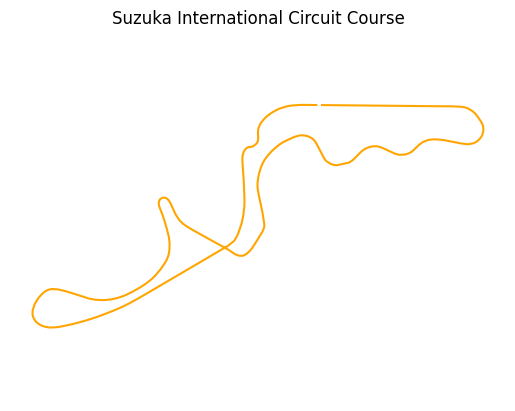

In [4]:
session = ff1.get_session(2025, 3, 'FP1')
session.load()

lap = session.laps.pick_fastest()
pos = lap.get_pos_data()

circuit_info = session.get_circuit_info()
libraryDataF1.draw_track(circuit_info,pos,"Suzuka International Circuit Course")

## Free Practice 1
### Obtain setup

In [92]:
practice = libraryDataF1.obtain_information('laps',session_key=9999)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9999)
drivers = libraryDataF1.obtain_information('drivers',session_key=9999)
libraryDataF1.obtain_drivers_colours(drivers)

In [93]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap
It seems that Mercedes and McLaren set up a car centered a bit on the straights. Sauber, RB and Haas centered on turns but the differerences are not significant. 

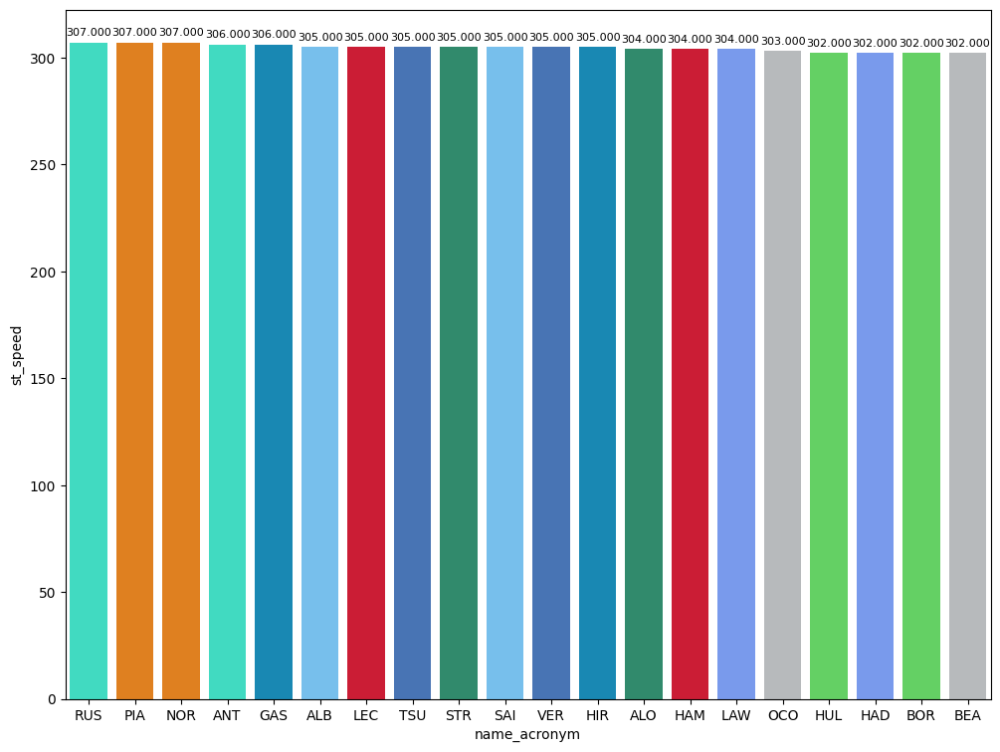

In [95]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

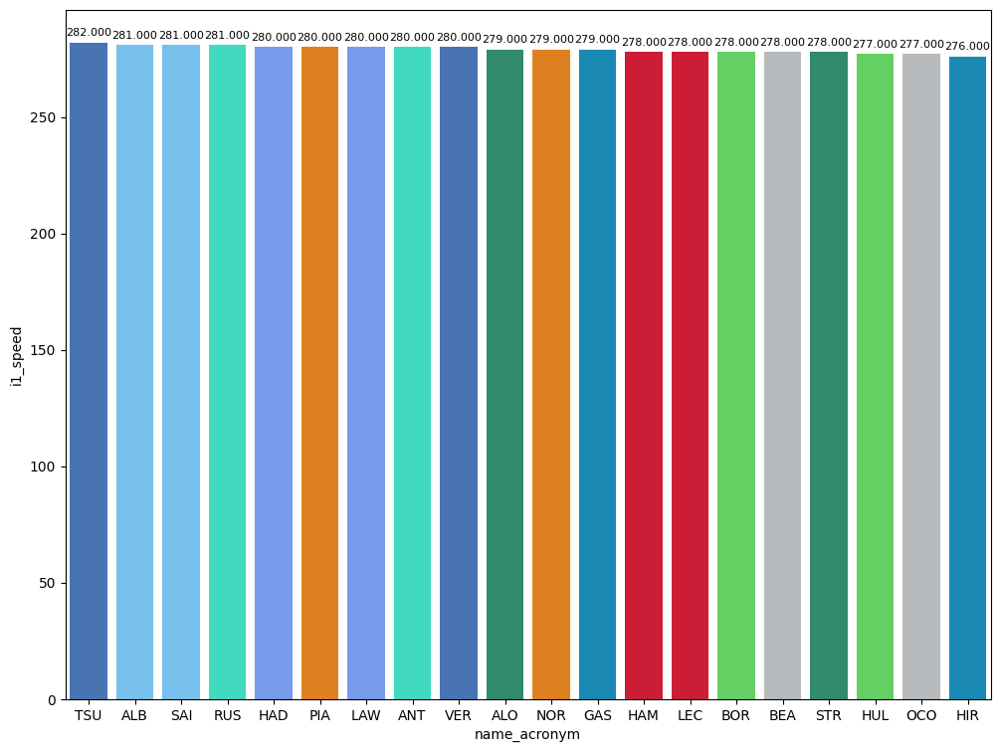

In [96]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

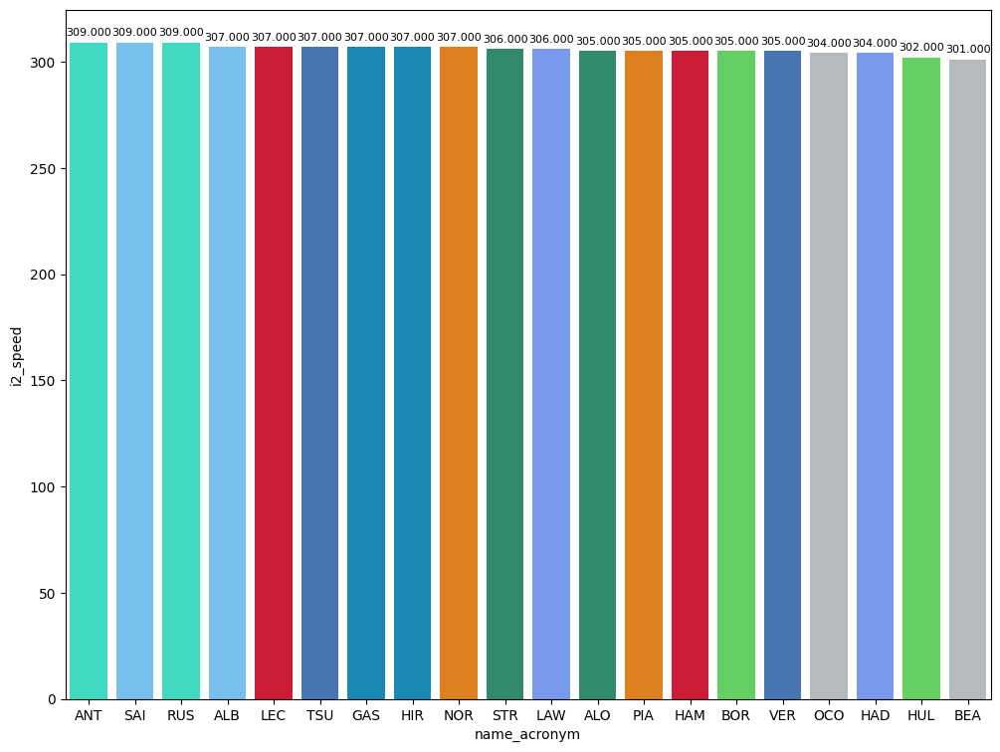

In [97]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session.
There are a big differences in sector 1 and 2 among the tyres. Only in the third sector(1 turn) laptimes are similar 

In [98]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
178,Isack HADJAR,HARD,31.156,40.917,17.901,89.974
150,George RUSSELL,MEDIUM,30.986,40.587,17.603,89.176
283,Lando NORRIS,SOFT,30.820,40.108,17.621,88.549


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session
Norris was the fastest and Piastri should not have any problem to replicate his pace.
Ferrari and Red Bull will have a fight beetween them.
Alpine, RB and Aston could fight for entering in Q3 but RB was strong than them.
Haas and Sauber will fight for entering in Q2 but they will struggle.

In [99]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


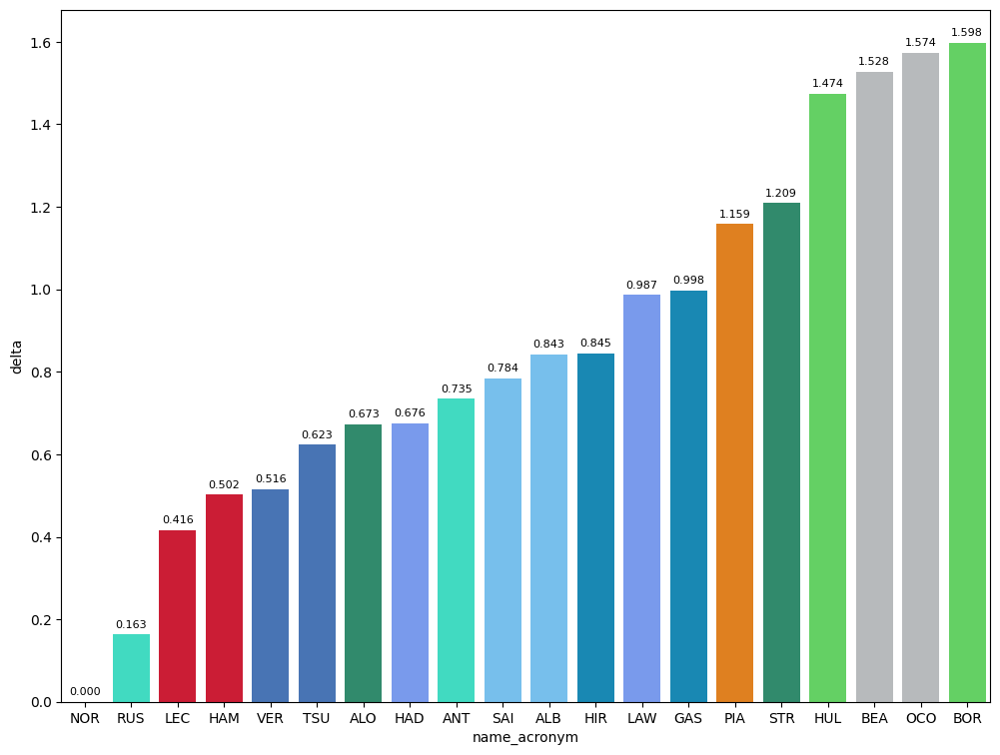

In [100]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.
S1: Aston wins in the battle of midfield being the fastest and Williams and RB had a similar pace.Sauber could win some positions if BOR replicates HUL pace.
S2:Ferrari and Mercedes are strong here and Red Bull,Alpine,Sauber and Haas could suffer
S3:Red Bull is the strongest here. On the other hand, Racing Bulls could be knocked-out if they dont improve this sector. 

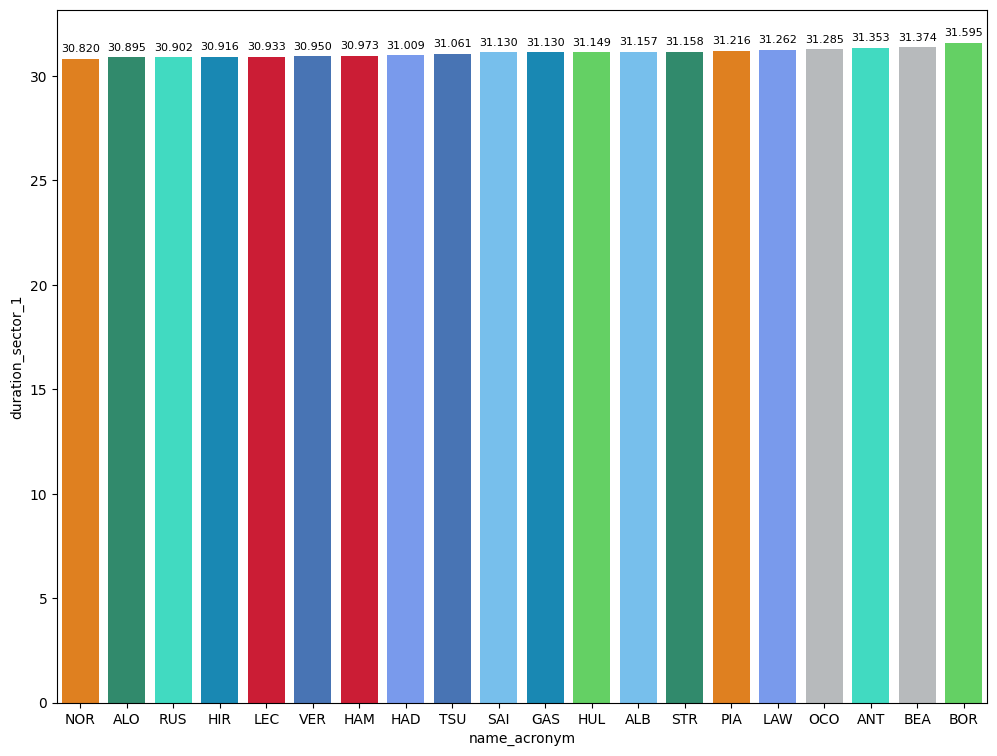

In [101]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

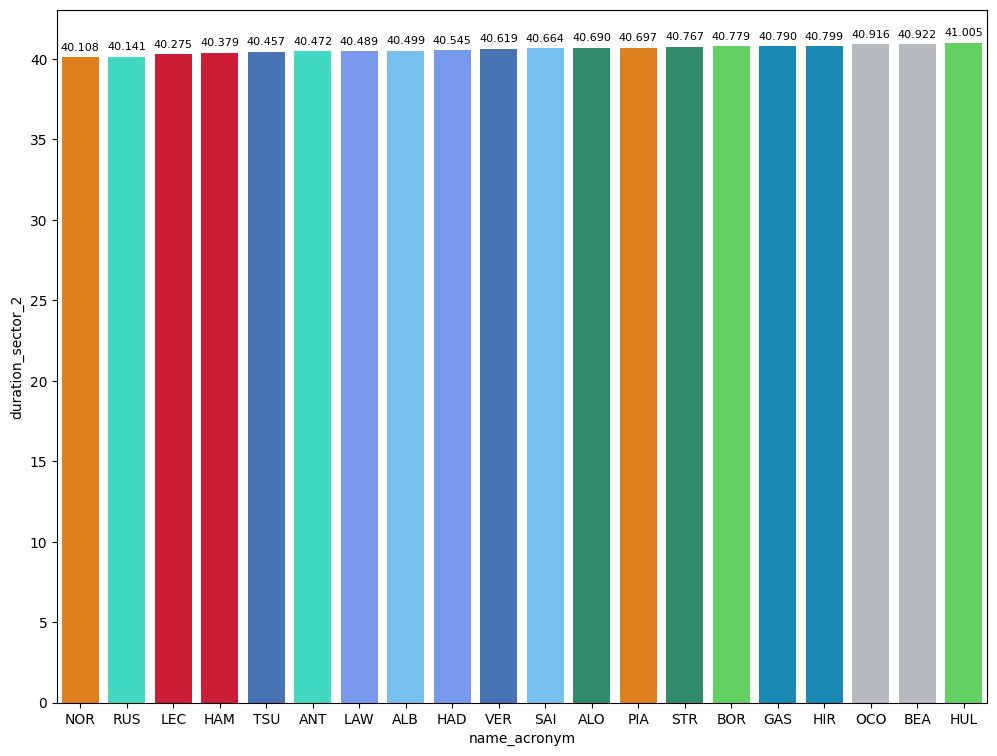

In [102]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

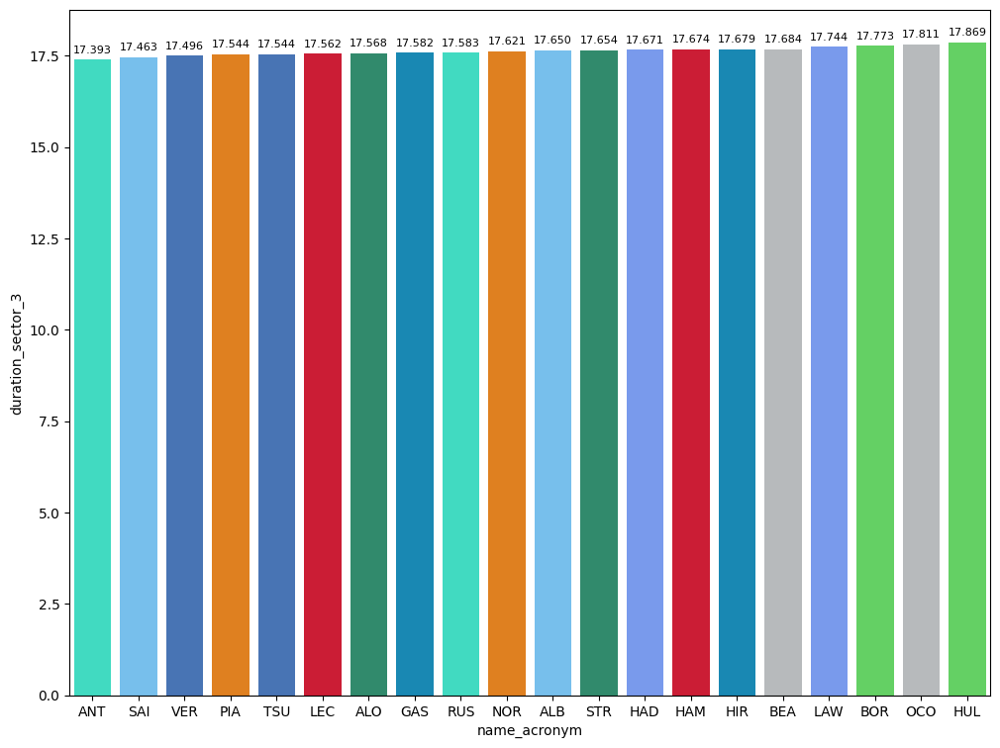

In [103]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [104]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 100").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,92.204233
HARD,92.356029
MEDIUM,93.007146


## Free Practice 2
### Obtain setup

In [105]:
practice = libraryDataF1.obtain_information('laps',session_key=10000)
stintInformation = libraryDataF1.obtain_information('stints',session_key=10000)
drivers = libraryDataF1.obtain_information('drivers',session_key=10000)

In [106]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

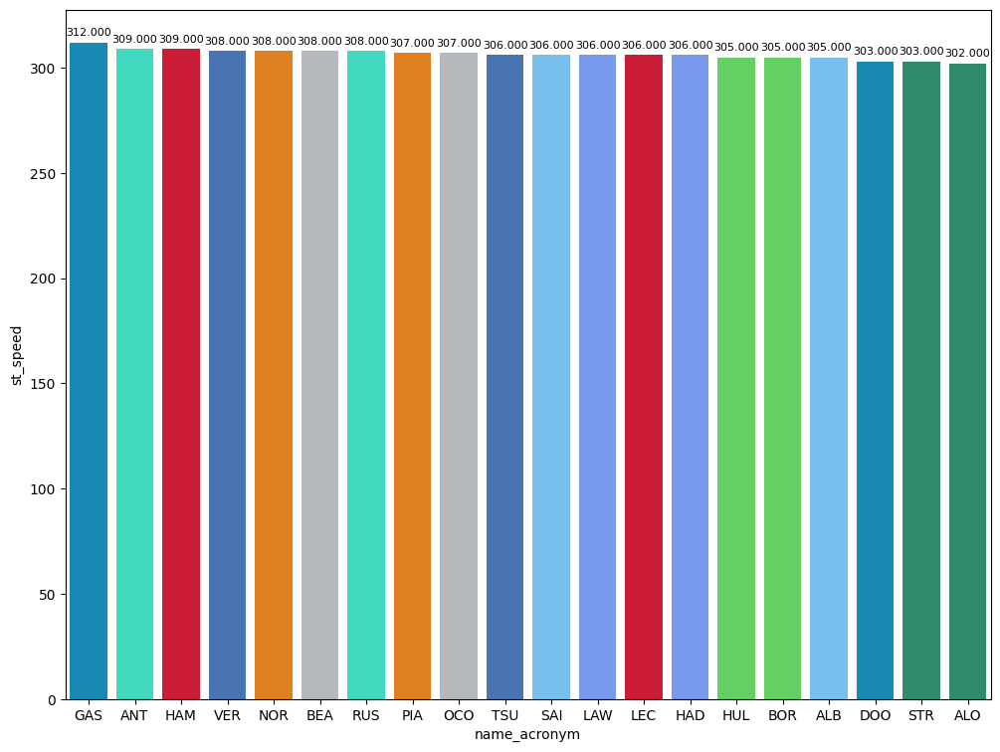

In [107]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

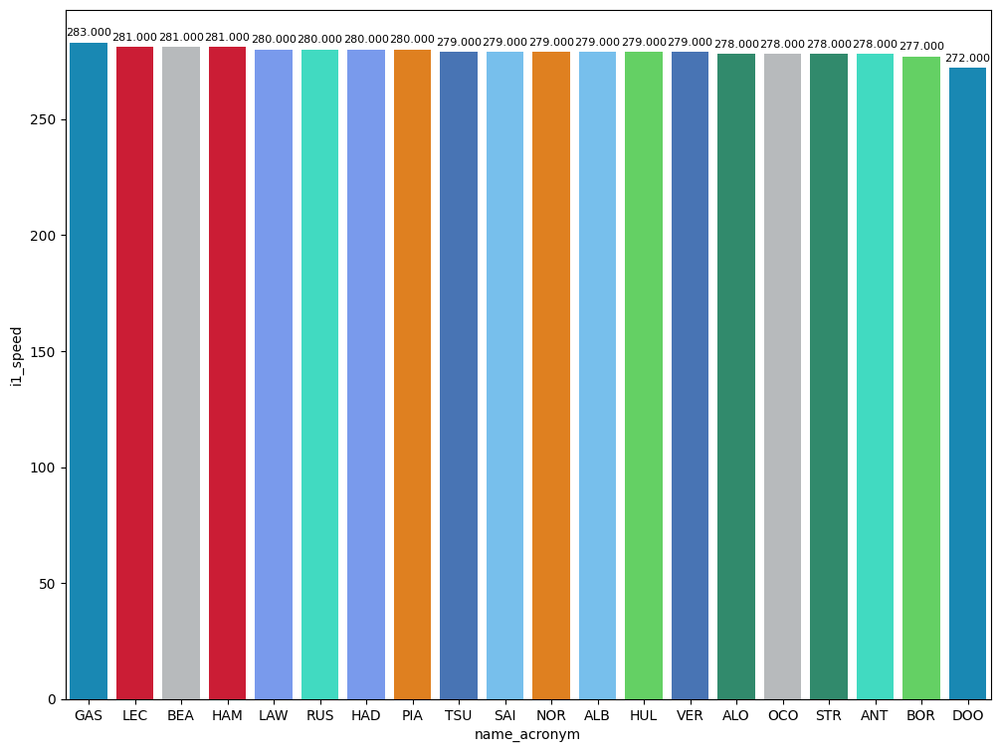

In [108]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

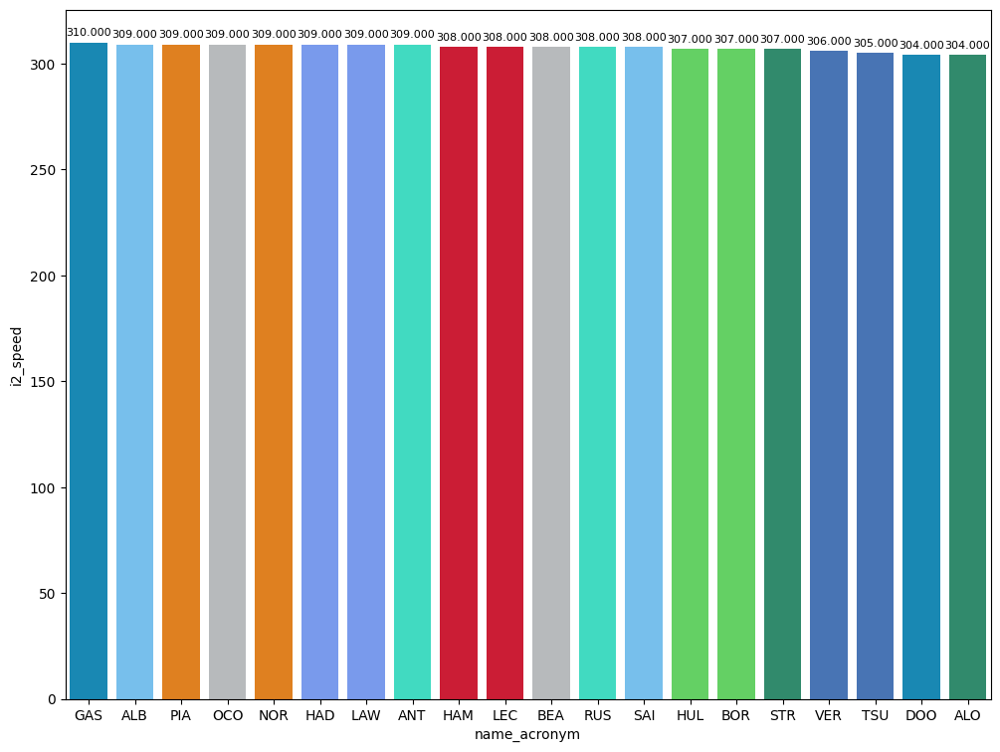

In [109]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [110]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
37,George RUSSELL,HARD,30.948,40.990,17.728,89.666
155,Liam LAWSON,MEDIUM,30.919,40.044,17.596,88.559
217,Oscar PIASTRI,SOFT,30.713,39.970,17.431,88.114


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [111]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


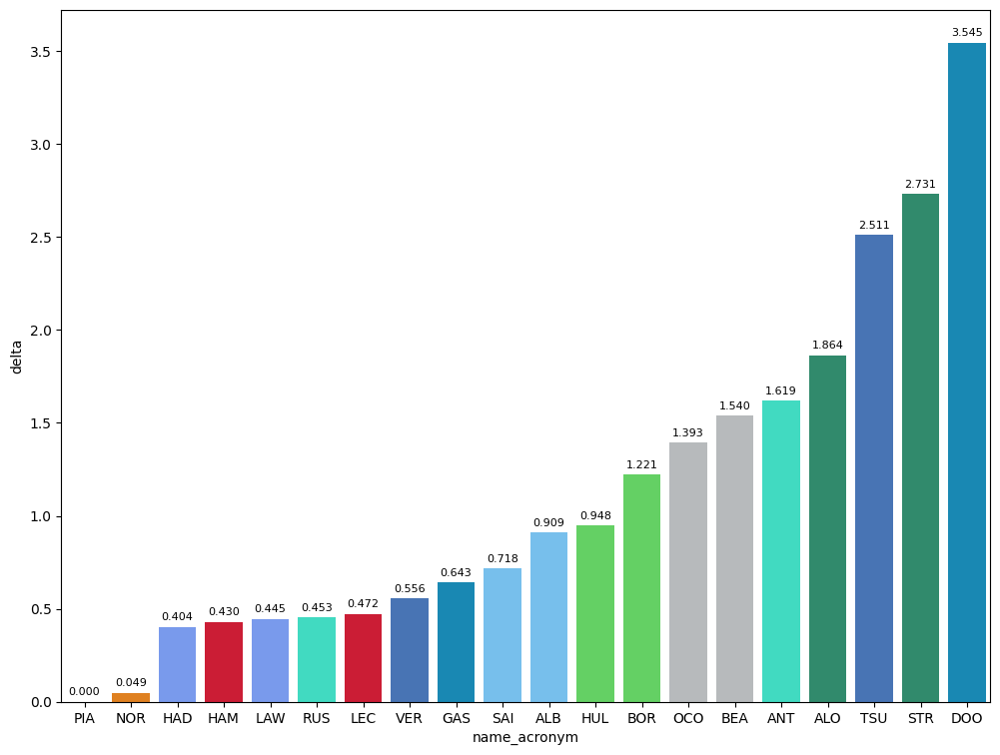

In [112]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

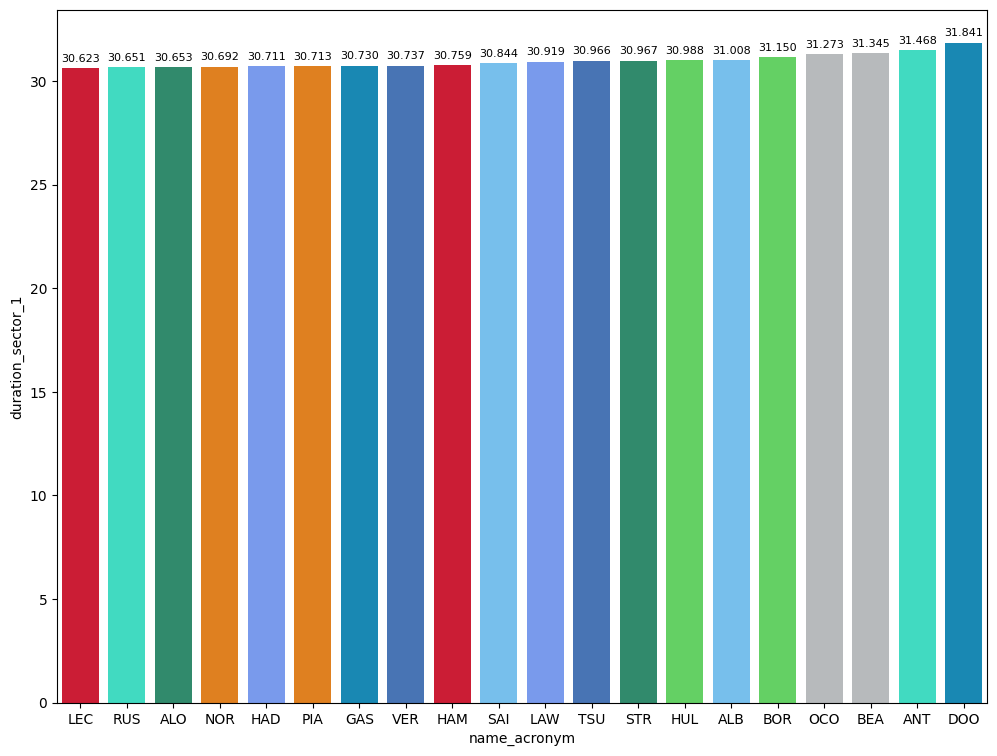

In [113]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

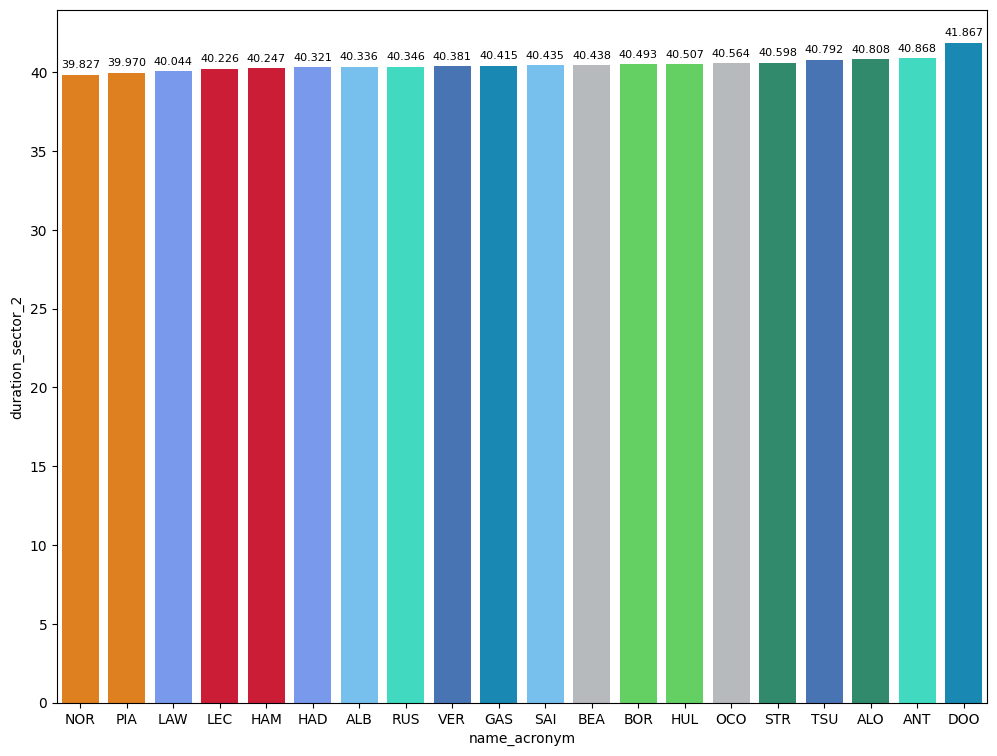

In [114]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

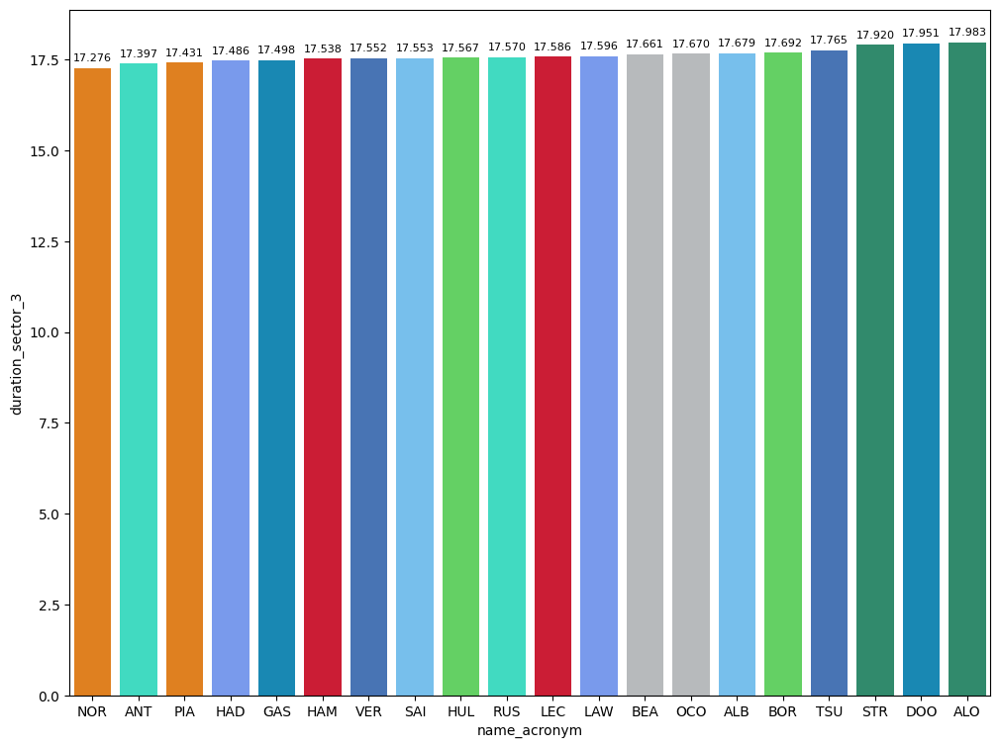

In [115]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [116]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 110").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,90.284765
MEDIUM,92.169720
HARD,93.133000


### Long runs
No data available due to red flags

In [200]:
MINIMUN_SECONDS = 120
MAXIMUM_SECONDS = 130

#### Red Bull Racing

In [201]:
stintInformation.query('driver_number == 1 or driver_number == 30')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1256,10000,1,1,1,4,MEDIUM,0
13,1256,10000,1,30,1,5,MEDIUM,0
21,1256,10000,2,1,4,5,SOFT,0
26,1256,10000,3,1,5,7,SOFT,1
41,1256,10000,2,30,6,8,MEDIUM,3
50,1256,10000,4,1,8,10,MEDIUM,0
57,1256,10000,3,30,8,11,SOFT,0
71,1256,10000,4,30,11,14,MEDIUM,5


In [202]:
data = libraryDataF1.getinfolongruns(jointables2,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [203]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [204]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [205]:
data = libraryDataF1.getinfolongruns(jointables2,30,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [206]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [207]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [208]:
stintInformation.query('driver_number == 55 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1256,10000,1,55,1,2,HARD,0
18,1256,10000,1,16,1,6,HARD,0
20,1256,10000,2,55,3,5,SOFT,0
30,1256,10000,3,55,5,8,SOFT,2
40,1256,10000,2,16,6,8,HARD,4
54,1256,10000,4,55,8,10,SOFT,5
60,1256,10000,3,16,9,12,SOFT,0
75,1256,10000,4,16,12,15,SOFT,3


In [209]:
data = libraryDataF1.getinfolongruns(jointables2,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [210]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [211]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [212]:
data = libraryDataF1.getinfolongruns(jointables2,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [213]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [214]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [215]:
stintInformation.query('driver_number == 63 or driver_number == 12')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1256,10000,1,63,1,4,HARD,0
9,1256,10000,1,12,1,5,HARD,0
25,1256,10000,2,63,5,6,SOFT,3
27,1256,10000,2,12,5,7,HARD,3
45,1256,10000,3,63,7,9,SOFT,0
52,1256,10000,3,12,8,10,SOFT,0
67,1256,10000,4,63,10,14,HARD,5
70,1256,10000,4,12,11,14,HARD,0


In [216]:
data = libraryDataF1.getinfolongruns(jointables2,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [217]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [218]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [219]:
data = libraryDataF1.getinfolongruns(jointables2,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [220]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [221]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [222]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1256,10000,1,4,1,3,MEDIUM,0
16,1256,10000,1,81,1,5,HARD,0
22,1256,10000,2,4,4,5,MEDIUM,0
29,1256,10000,2,81,5,7,HARD,0
31,1256,10000,3,4,6,6,SOFT,0
43,1256,10000,4,4,7,9,SOFT,1
55,1256,10000,3,81,8,10,SOFT,0
62,1256,10000,5,4,10,13,SOFT,4
73,1256,10000,4,81,11,14,SOFT,6


In [223]:
data = libraryDataF1.getinfolongruns(jointables2,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [224]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [225]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [226]:
data = libraryDataF1.getinfolongruns(jointables2,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [227]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [228]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [229]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1256,10000,1,14,1,4,MEDIUM,0
10,1256,10000,1,18,1,5,MEDIUM,0
24,1256,10000,2,14,5,6,SOFT,0
28,1256,10000,2,18,5,7,SOFT,0
47,1256,10000,3,18,7,10,SOFT,2
64,1256,10000,4,18,10,13,SOFT,5


In [230]:
data = libraryDataF1.getinfolongruns(jointables2,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [231]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [232]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [233]:
data = libraryDataF1.getinfolongruns(jointables2,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [234]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [235]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Racing Bulls

In [236]:
stintInformation.query('driver_number == 6 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
6,1256,10000,1,6,1,5,MEDIUM,0
11,1256,10000,1,22,1,5,MEDIUM,0
32,1256,10000,2,6,6,6,MEDIUM,0
36,1256,10000,2,22,6,7,SOFT,0
46,1256,10000,3,6,7,10,SOFT,0
48,1256,10000,3,22,8,9,MEDIUM,4
63,1256,10000,4,6,10,13,MEDIUM,4
65,1256,10000,4,22,10,13,MEDIUM,6


In [237]:
data = libraryDataF1.getinfolongruns(jointables2,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [238]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [239]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [240]:
data = libraryDataF1.getinfolongruns(jointables2,22,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [241]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [242]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [243]:
stintInformation.query('driver_number == 87 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1256,10000,1,87,1,4,MEDIUM,0
14,1256,10000,1,31,1,5,MEDIUM,0
23,1256,10000,2,87,5,5,SOFT,0
38,1256,10000,2,31,6,7,SOFT,0
42,1256,10000,3,87,6,8,SOFT,1
58,1256,10000,3,31,8,11,SOFT,2
59,1256,10000,4,87,8,11,MEDIUM,3
72,1256,10000,4,31,11,14,MEDIUM,4


In [244]:
data = libraryDataF1.getinfolongruns(jointables2,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [245]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [246]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [247]:
data = libraryDataF1.getinfolongruns(jointables2,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [248]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [249]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [250]:
stintInformation.query('driver_number == 10 or driver_number == 7')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1256,10000,1,7,1,5,HARD,0
8,1256,10000,1,10,1,5,HARD,0
35,1256,10000,2,10,6,7,SOFT,0
51,1256,10000,3,10,8,10,SOFT,2
69,1256,10000,4,10,11,14,SOFT,5


In [251]:
data =libraryDataF1.getinfolongruns(jointables2,7,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [252]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [253]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [254]:
data = libraryDataF1.getinfolongruns(jointables2,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [255]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [256]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [257]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1256,10000,1,55,1,2,HARD,0
19,1256,10000,1,23,1,6,HARD,0
20,1256,10000,2,55,3,5,SOFT,0
30,1256,10000,3,55,5,8,SOFT,2
37,1256,10000,2,23,6,7,SOFT,0
49,1256,10000,3,23,8,9,SOFT,0
54,1256,10000,4,55,8,10,SOFT,5
61,1256,10000,4,23,9,12,SOFT,3


In [258]:
data = libraryDataF1.getinfolongruns(jointables2,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [259]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [260]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [261]:
data= libraryDataF1.getinfolongruns(jointables2,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [262]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [263]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [264]:
stintInformation.query('driver_number == 5 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1256,10000,1,27,1,5,HARD,0
17,1256,10000,1,5,1,6,MEDIUM,0
33,1256,10000,2,27,6,6,SOFT,0
34,1256,10000,2,5,6,7,SOFT,0
44,1256,10000,3,27,7,9,SOFT,1
56,1256,10000,3,5,8,11,MEDIUM,2
66,1256,10000,4,27,10,13,HARD,4
68,1256,10000,4,5,11,14,MEDIUM,4


In [265]:
data = libraryDataF1.getinfolongruns(jointables2,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [266]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [267]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [268]:
data = libraryDataF1.getinfolongruns(jointables2,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [269]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [270]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Long runs mean for each driver

In [271]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Sorted by lap duration
Only Mercedes and Red Bull did long stints. Red Bull had a poor pace and they had some problems in sector 2 with the degradation. On the other hand, Mercedes was faster in general but they had degradation in sector 3.
Haas suffered in the first sector.


In [272]:
sorted_laps = pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3'])

In [273]:
sorted_laps.sort_values(by='lap_duration',ascending=True)

,driver,compound,lap_duration,sector1,sector2,sector3


##### Sorted by sector 1
Piastri and Hamilton are strong in this sector being the  leaders of their teams. Also Alonso is strong and this could help him to win some positions. Red Bull will suffer on race.

In [274]:
sorted_laps.sort_values(by='sector1',ascending=True)[['driver','compound','sector1']]

,driver,compound,sector1


##### Sorted by sector 2
Ferrari is strong here so it could make sense to say that the car is focused on turns. Racing Bulls were fast here so it could help to make overcuts on race.

In [275]:
sorted_laps.sort_values(by='sector2',ascending=True)[['driver','compound','sector2']]

,driver,compound,sector2


##### Sorted by sector 3
McLaren was the best here and if they take advantage this sector, they could extend the gap on race. Alpine could gain some positions thanks to the focus on the straight. Red Bull will suffer here.

In [276]:
sorted_laps.sort_values(by='sector3',ascending=True)[['driver','compound','sector3']]

,driver,compound,sector3


#### Long runs mean

In [277]:
longruns_summary = libraryDataF1.obtainMeanLongRuns(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Mean pace per compound

In [279]:
#libraryDataF1.showDataLongRuns(longruns_summary,"MEDIUM","mean_lap_time",['driver','mean_lap_time'])

In [ ]:
#libraryDataF1.showDataLongRuns(longruns_summary,"SOFT","mean_lap_time",['driver','mean_lap_time'])

In [ ]:
#libraryDataF1.showDataLongRuns(longruns_summary,"HARD","mean_lap_time",['driver','mean_lap_time'])

## Free Practice 3
### Obtain setup

In [3]:
practice = libraryDataF1.obtain_information('laps',session_key=10001)
stintInformation = libraryDataF1.obtain_information('stints',session_key=10001)
drivers = libraryDataF1.obtain_information('drivers',session_key=10001)

In [4]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

In [5]:
session = ff1.get_session(2025, 3, 'FP3')
session.load();

req         WARNING 	DEFAULT CACHE ENABLED! (3.36 GB) /home/frank/.cache/fastf1
core           INFO 	Loading data for Japanese Grand Prix - Practice 3 [v3.3.0]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '5', '6', '7', '10', 

In [6]:
# practice = pd.DataFrame(session.laps)

In [7]:
# practice['duration_sector_1']= practice.Sector1Time.dt.total_seconds()
# practice['duration_sector_2']= practice.Sector2Time.dt.total_seconds()
# practice['duration_sector_3']= practice.Sector3Time.dt.total_seconds()
# practice['lap_duration']= practice.LapTime.dt.total_seconds()
# practice['driver_number'] = practice.DriverNumber
# practice['i1_speed'] = practice.SpeedI1
# practice['i2_speed'] = practice.SpeedI2
# practice['st_speed'] = practice.SpeedFL
# practice['lap_number'] = practice.LapNumber

In [8]:
# stintInformation =pd.read_excel("stintsFP3.xlsx")
# drivers = pd.read_excel("e.xlsx")

In [9]:
# drivers.loc[drivers['last_name']=="Bortoleto",'team_colour'] = '52E253'
# drivers.loc[drivers['last_name']=="Hulkenberg",'team_colour'] = '52E253'

In [ ]:
# practice = practice[['duration_sector_1','duration_sector_2','duration_sector_3','lap_duration','driver_number','i1_speed','i2_speed','st_speed','lap_number']]

In [10]:
# stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
# jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
# libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

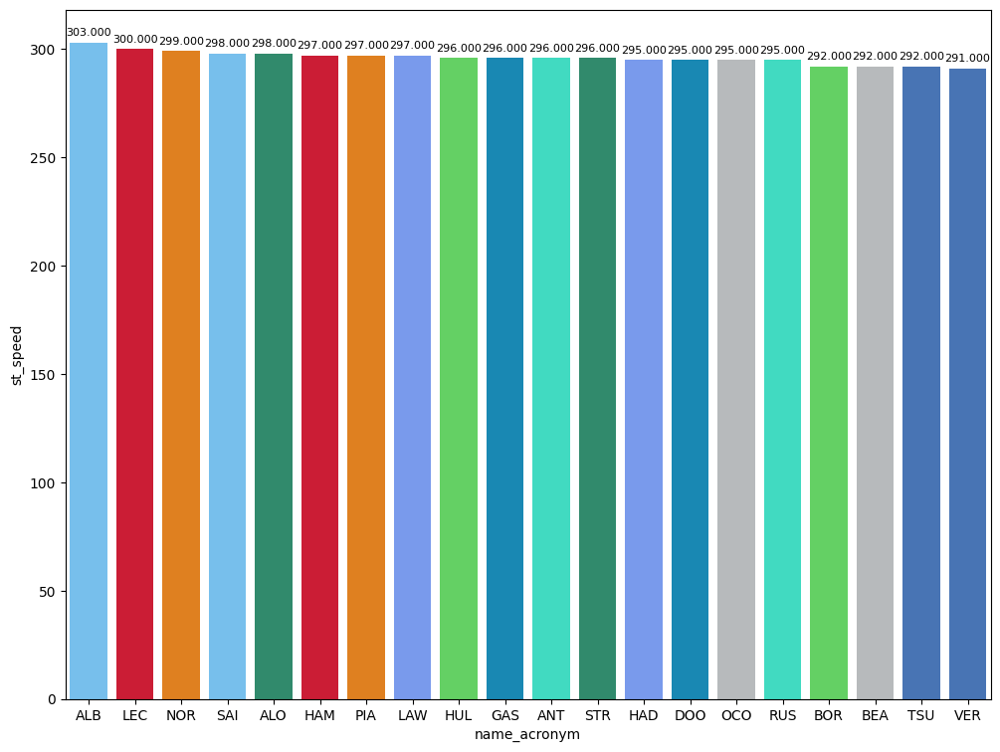

In [11]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

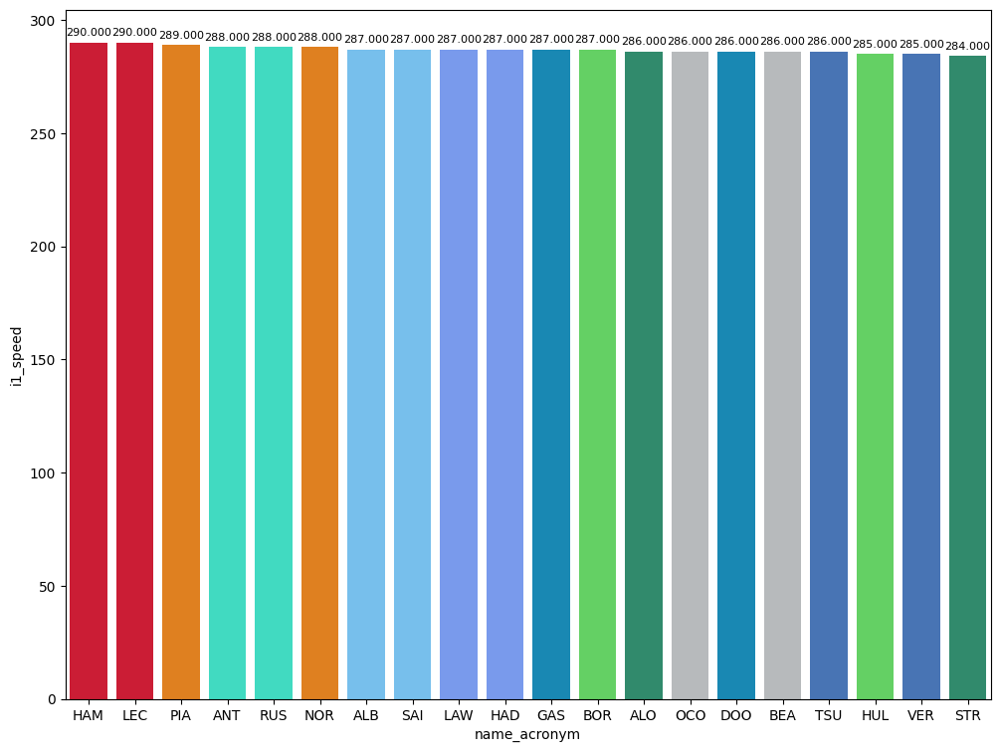

In [12]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

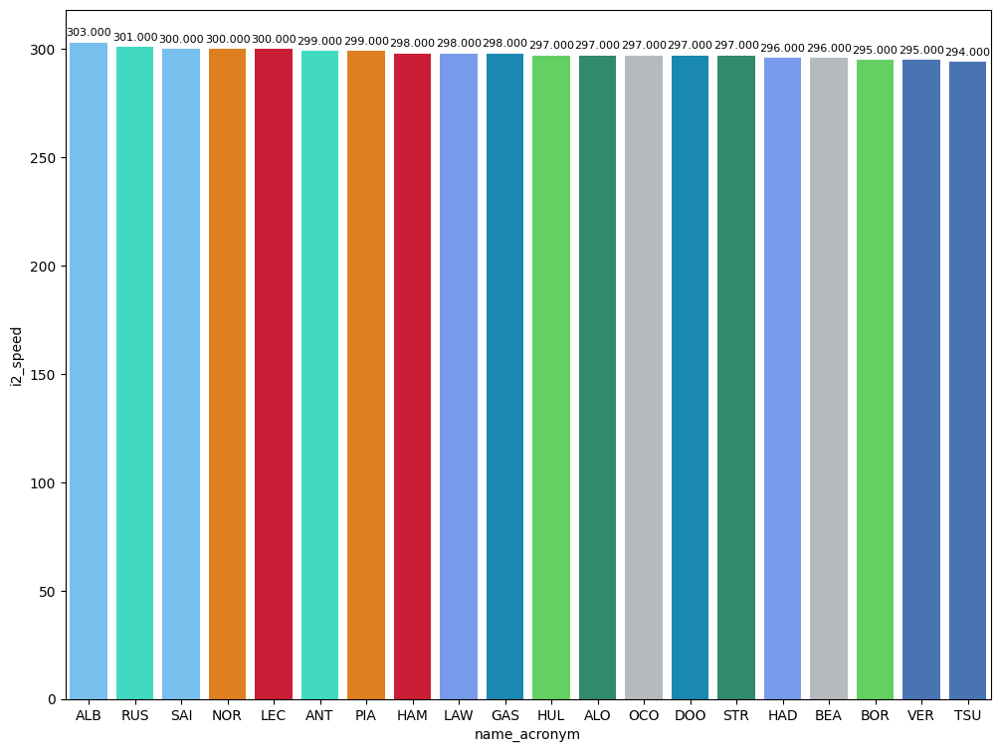

In [13]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [14]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
181,Yuki TSUNODA,HARD,31.294,40.422,17.690,89.406
304,Liam LAWSON,MEDIUM,31.190,40.371,17.543,89.104
306,Lando NORRIS,SOFT,30.501,39.951,17.513,87.965


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [15]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


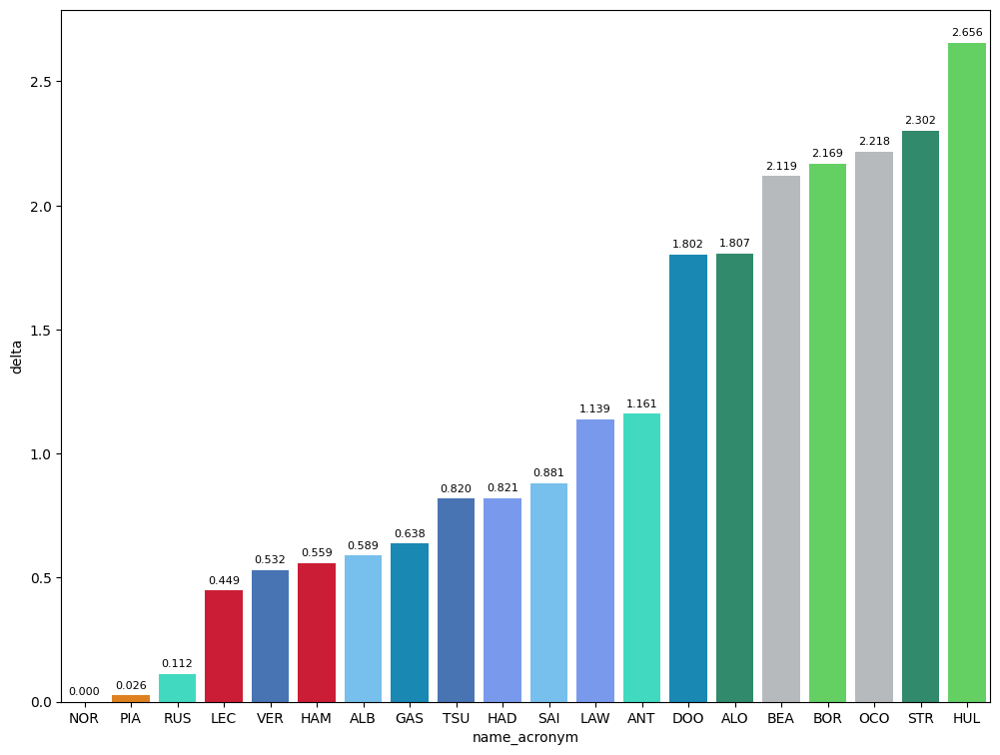

In [16]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

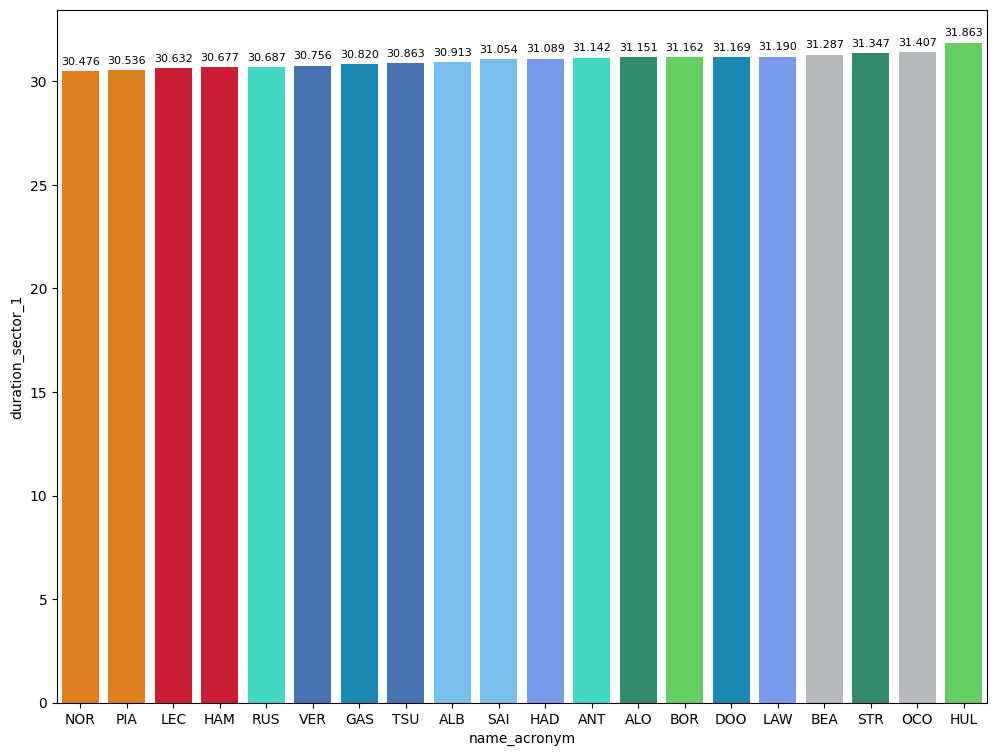

In [17]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

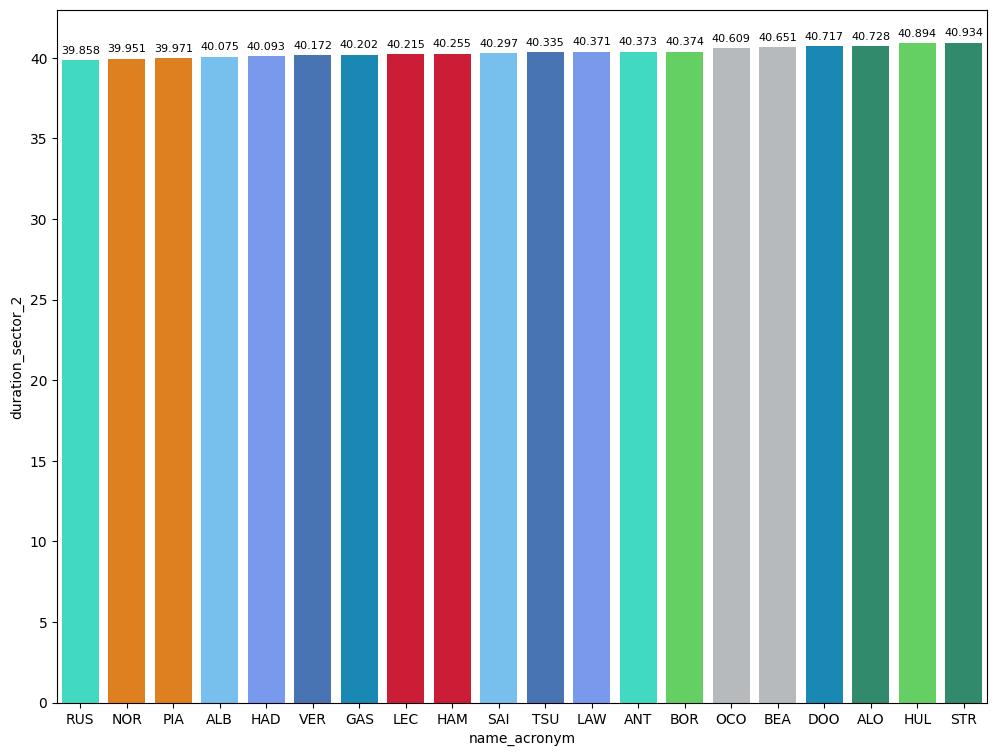

In [18]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

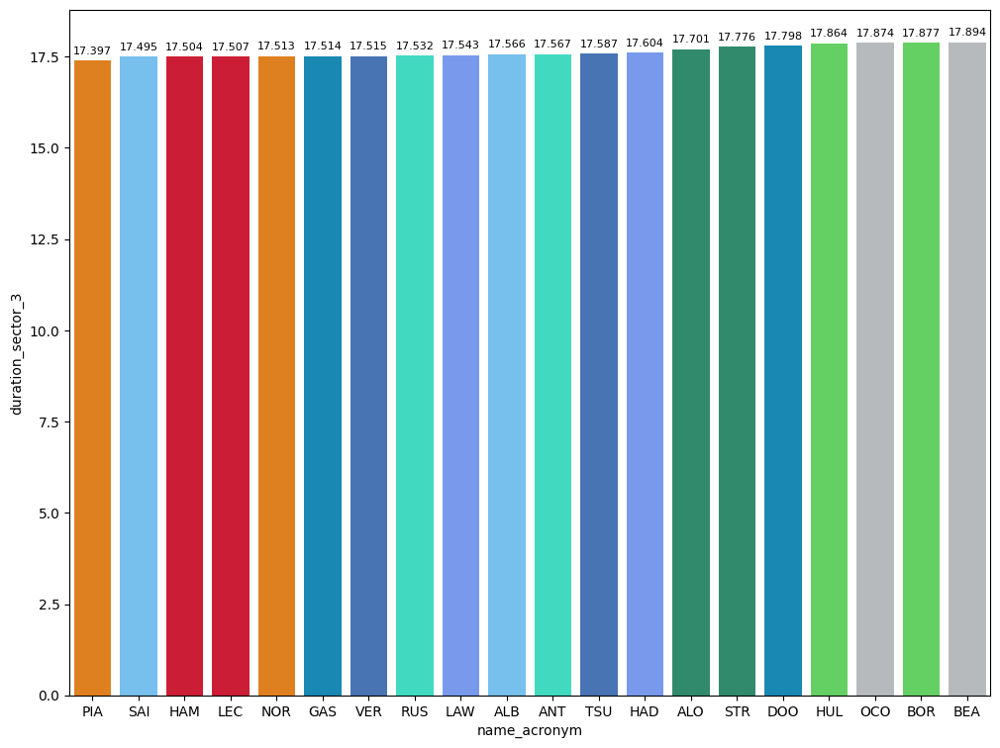

In [19]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [20]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 95").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,89.418795
MEDIUM,91.946566
HARD,92.768846


### Long runs

In [21]:
MINIMUN_SECONDS = 92
MAXIMUM_SECONDS = 95

#### Red Bull Racing

In [22]:
stintInformation.query('driver_number == 1 or driver_number == 30')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
15,1256,10001,1,30,1,4,MEDIUM,0
17,1256,10001,1,1,1,5,HARD,0
37,1256,10001,2,30,5,7,MEDIUM,3
42,1256,10001,2,1,6,16,HARD,4
52,1256,10001,3,30,8,18,MEDIUM,0
76,1256,10001,3,1,17,19,SOFT,0
80,1256,10001,4,30,18,20,SOFT,0
81,1256,10001,4,1,20,22,SOFT,3


In [23]:
data = libraryDataF1.getinfolongruns(jointables2,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
75,Max VERSTAPPEN,HARD,2025-04-05T02:47:51.106000+00:00,6,33.698,42.235,18.371,94.304
92,Max VERSTAPPEN,HARD,2025-04-05T02:49:25.454000+00:00,7,33.657,42.388,18.389,94.434
103,Max VERSTAPPEN,HARD,2025-04-05T02:50:59.910000+00:00,8,33.340,42.352,18.247,93.939
118,Max VERSTAPPEN,HARD,2025-04-05T02:52:33.758000+00:00,9,33.534,42.350,18.209,94.093
126,Max VERSTAPPEN,HARD,2025-04-05T02:54:07.890000+00:00,10,33.173,42.383,18.610,94.166
142,Max VERSTAPPEN,HARD,2025-04-05T02:55:42+00:00,11,33.061,42.577,18.285,93.923
164,Max VERSTAPPEN,HARD,2025-04-05T02:58:53.905000+00:00,13,32.965,42.370,18.216,93.551
176,Max VERSTAPPEN,HARD,2025-04-05T03:00:27.456000+00:00,14,33.090,42.493,18.299,93.882


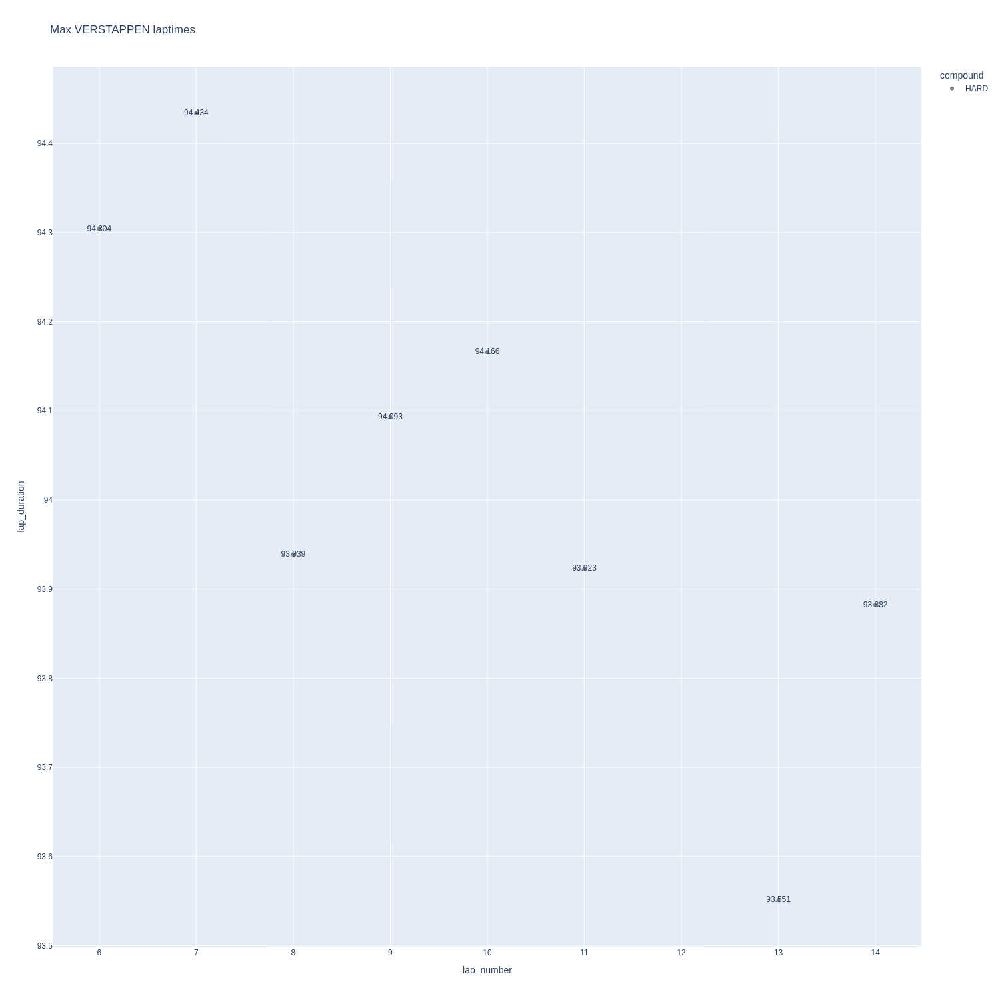

In [24]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

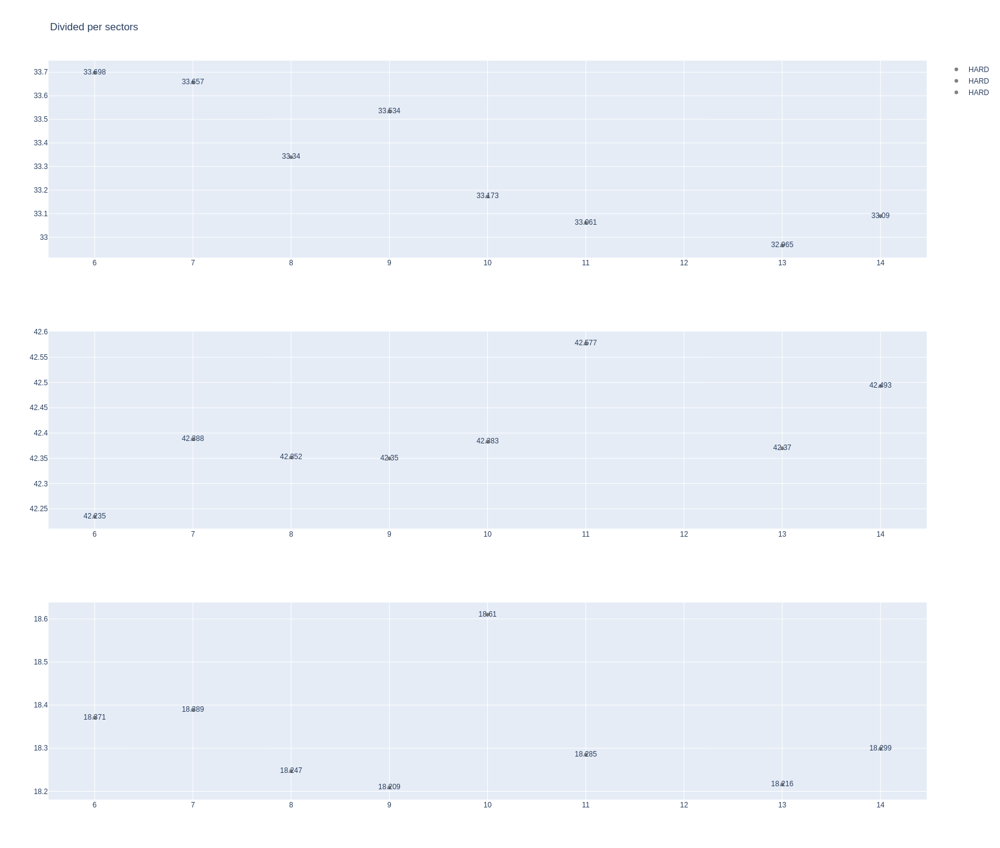

In [25]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [26]:
data = libraryDataF1.getinfolongruns(jointables2,30,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [27]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [28]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [29]:
stintInformation.query('driver_number == 55 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
13,1256,10001,1,16,1,4,SOFT,0
16,1256,10001,1,55,1,4,HARD,0
35,1256,10001,2,16,5,7,SOFT,3
38,1256,10001,2,55,5,11,HARD,4
46,1256,10001,3,16,8,10,SOFT,0
59,1256,10001,4,16,11,14,SOFT,0
64,1256,10001,3,55,12,19,HARD,11
82,1256,10001,4,55,20,22,SOFT,0
83,1256,10001,5,55,23,23,SOFT,0


In [30]:
data = libraryDataF1.getinfolongruns(jointables2,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [31]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [32]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [33]:
data = libraryDataF1.getinfolongruns(jointables2,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [34]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [35]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [36]:
stintInformation.query('driver_number == 63 or driver_number == 12')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
6,1256,10001,1,63,1,2,MEDIUM,0
12,1256,10001,1,12,1,4,MEDIUM,0
23,1256,10001,2,63,3,5,SOFT,0
34,1256,10001,2,12,5,7,MEDIUM,3
39,1256,10001,3,63,6,8,SOFT,3
48,1256,10001,3,12,8,16,MEDIUM,6
54,1256,10001,4,63,9,11,SOFT,6
63,1256,10001,5,63,12,16,SOFT,0
78,1256,10001,4,12,17,21,SOFT,0


In [37]:
data = libraryDataF1.getinfolongruns(jointables2,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [38]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [39]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [40]:
data = libraryDataF1.getinfolongruns(jointables2,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
60,Kimi ANTONELLI,MEDIUM,2025-04-05T02:46:18.120000+00:00,5,33.773,41.830,17.877,93.480
134,Kimi ANTONELLI,MEDIUM,2025-04-05T02:54:56.562000+00:00,8,32.938,41.782,17.987,92.707
146,Kimi ANTONELLI,MEDIUM,2025-04-05T02:56:29.235000+00:00,9,33.493,41.829,17.963,93.285
157,Kimi ANTONELLI,MEDIUM,2025-04-05T02:58:02.561000+00:00,10,32.847,42.107,17.946,92.900
171,Kimi ANTONELLI,MEDIUM,2025-04-05T02:59:35.467000+00:00,11,32.993,42.061,18.098,93.152
182,Kimi ANTONELLI,MEDIUM,2025-04-05T03:01:08.581000+00:00,12,32.924,42.113,17.951,92.988
197,Kimi ANTONELLI,MEDIUM,2025-04-05T03:02:41.566000+00:00,13,32.726,42.140,18.055,92.921
210,Kimi ANTONELLI,MEDIUM,2025-04-05T03:04:14.457000+00:00,14,32.776,42.086,18.011,92.873


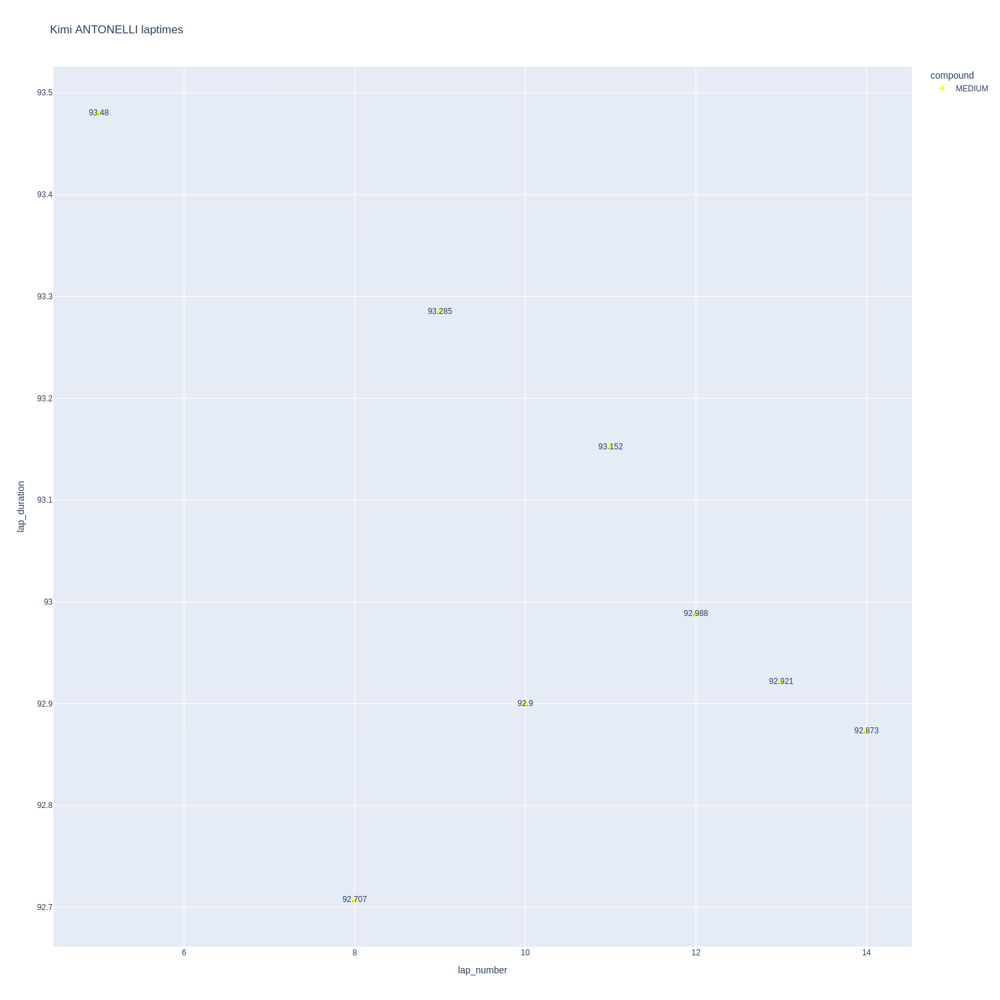

In [41]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

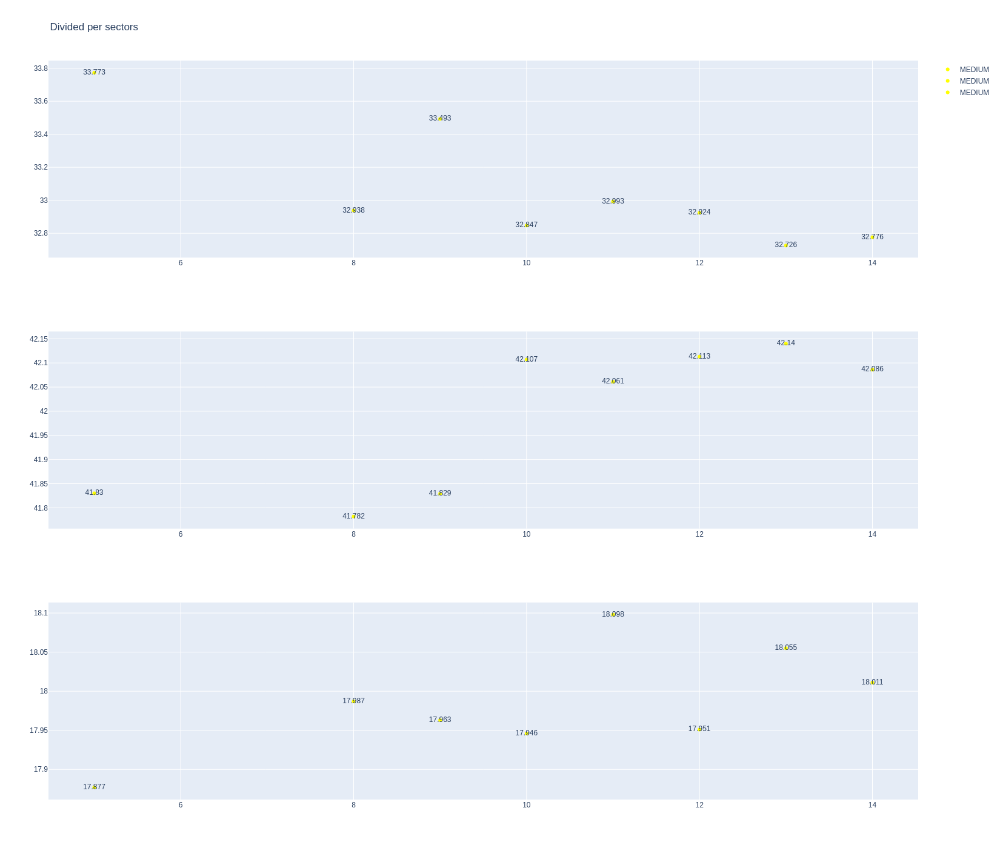

In [42]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [43]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1256,10001,1,4,1,2,HARD,0
7,1256,10001,1,81,1,2,MEDIUM,0
27,1256,10001,2,4,3,12,SOFT,0
28,1256,10001,2,81,3,12,SOFT,0
66,1256,10001,3,81,13,15,SOFT,0
67,1256,10001,3,4,13,18,SOFT,0
71,1256,10001,4,81,16,18,SOFT,3


In [44]:
data = libraryDataF1.getinfolongruns(jointables2,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
173,Lando NORRIS,SOFT,2025-04-05T02:59:39.186000+00:00,11,31.698,41.705,20.864,94.267


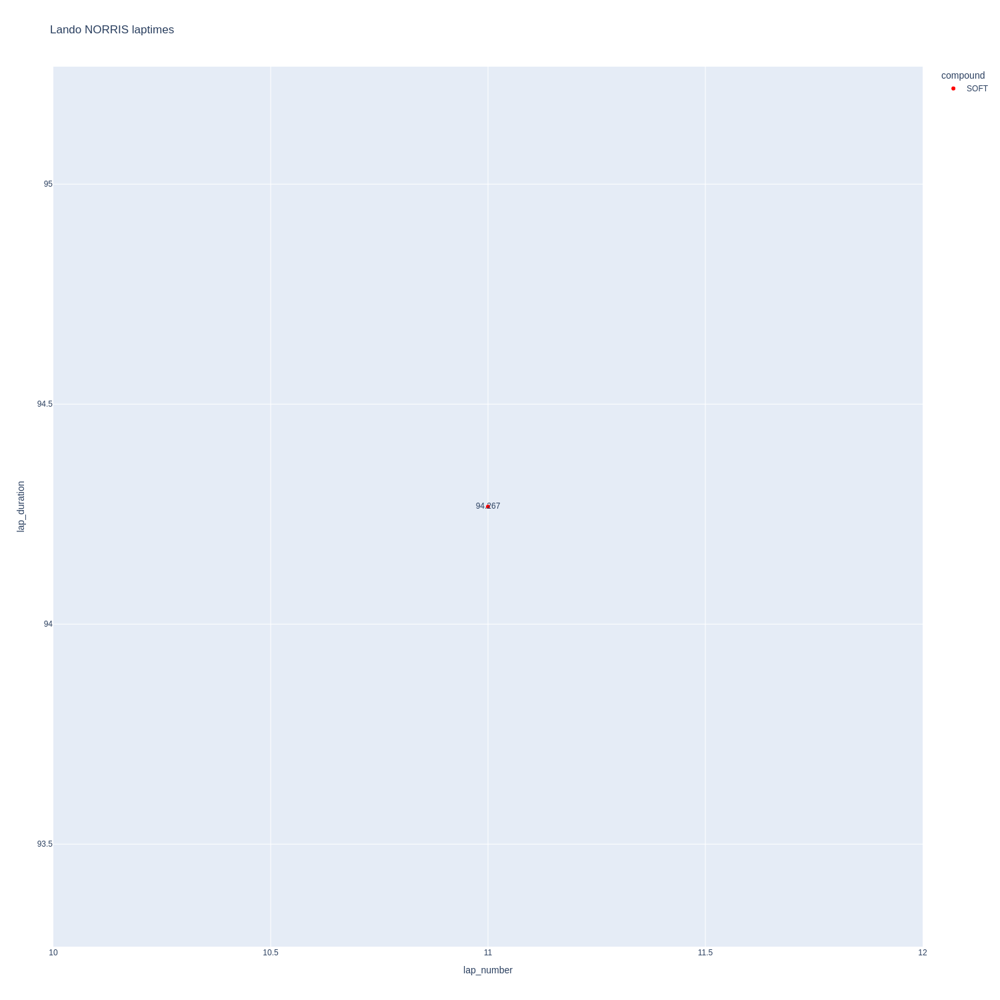

In [45]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

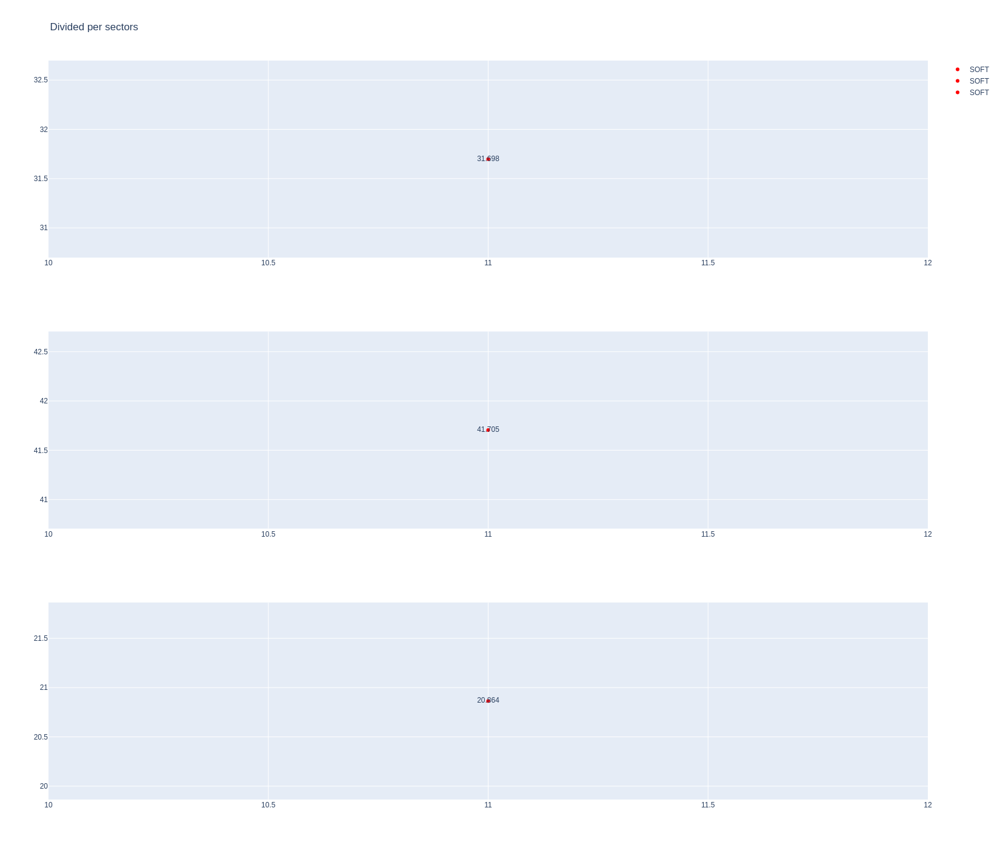

In [46]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [47]:
data = libraryDataF1.getinfolongruns(jointables2,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
144,Oscar PIASTRI,SOFT,2025-04-05T02:56:06.141000+00:00,8,33.934,40.605,17.875,92.414


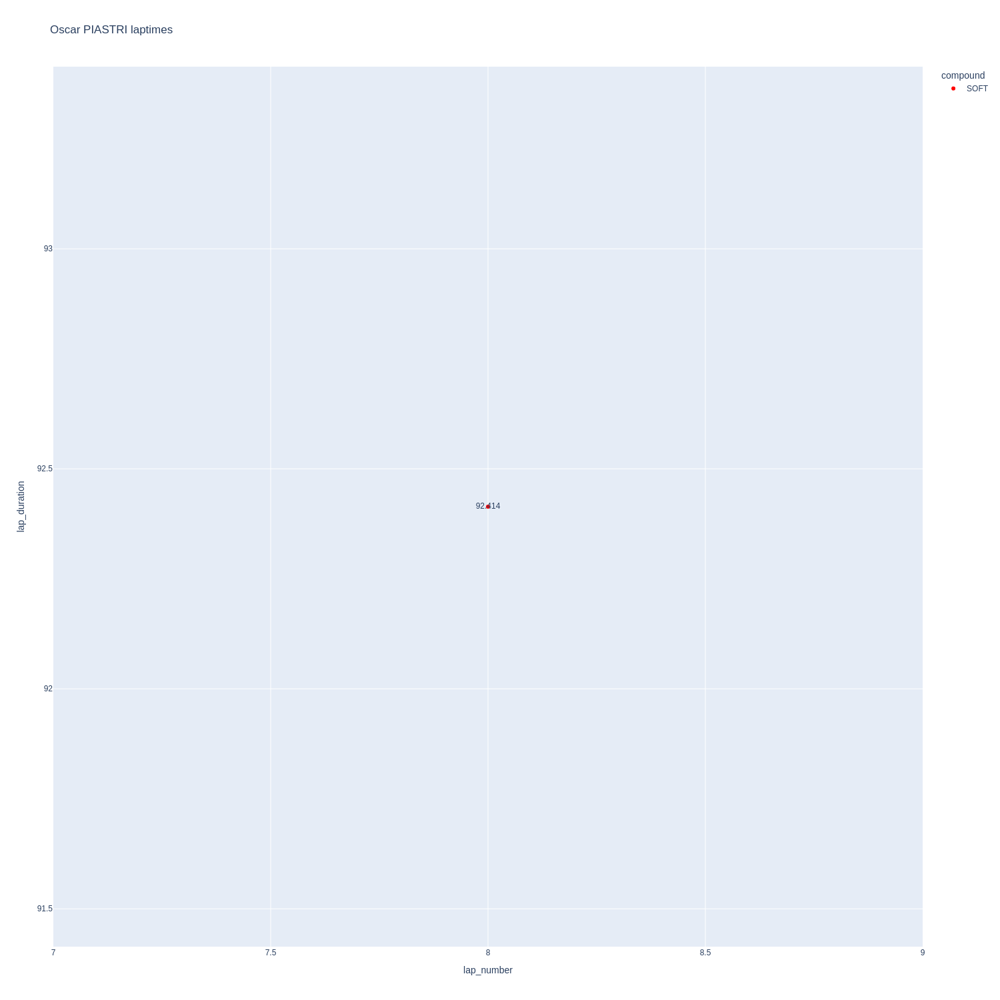

In [48]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

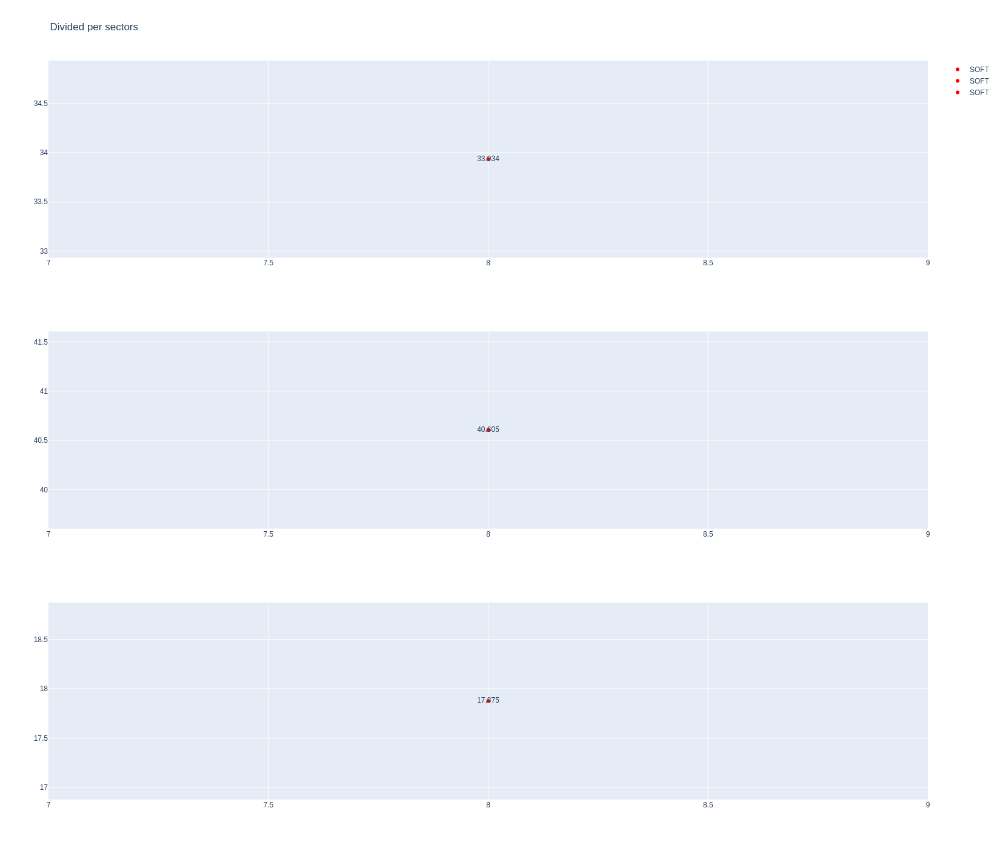

In [49]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [50]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1256,10001,1,14,1,1,MEDIUM,0
2,1256,10001,1,18,1,2,MEDIUM,0
20,1256,10001,2,14,2,3,HARD,0
21,1256,10001,2,18,3,3,HARD,0
30,1256,10001,3,18,4,8,MEDIUM,0
32,1256,10001,3,14,4,9,MEDIUM,0
55,1256,10001,4,18,9,16,MEDIUM,5
57,1256,10001,4,14,10,17,MEDIUM,6
72,1256,10001,5,18,17,17,SOFT,0
79,1256,10001,5,14,18,18,SOFT,0


In [51]:
data = libraryDataF1.getinfolongruns(jointables2,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
249,Fernando ALONSO,MEDIUM,2025-04-05T03:09:45.023000+00:00,13,32.566,41.754,18.063,92.383
256,Fernando ALONSO,MEDIUM,2025-04-05T03:11:17.508000+00:00,14,32.662,41.914,18.069,92.645
263,Fernando ALONSO,MEDIUM,2025-04-05T03:12:50.071000+00:00,15,32.432,41.953,18.049,92.434


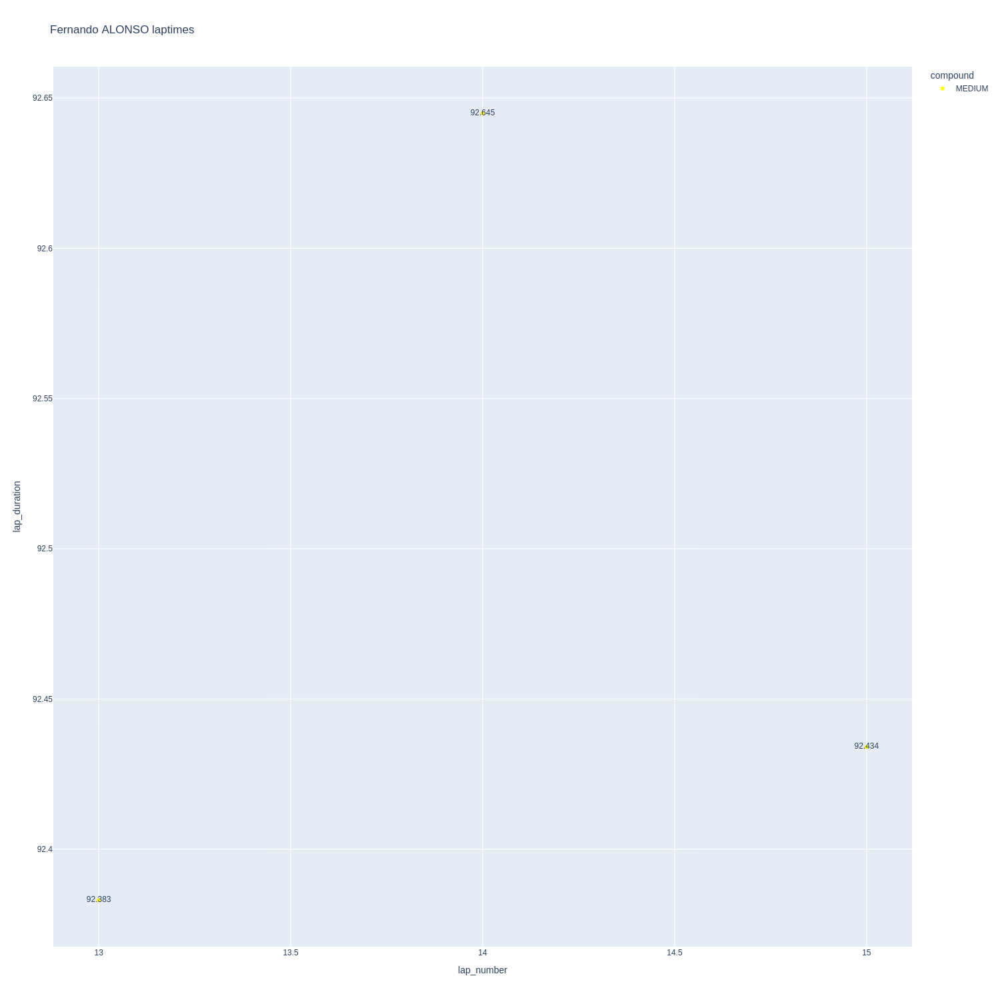

In [52]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

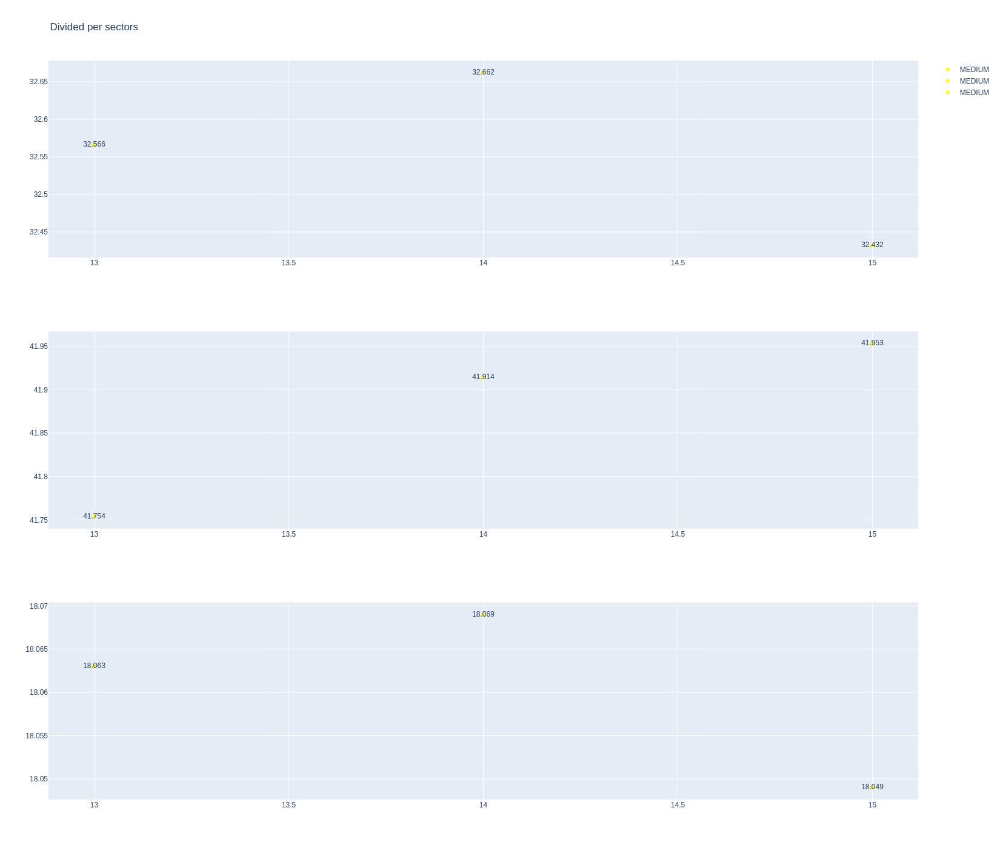

In [53]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [54]:
data = libraryDataF1.getinfolongruns(jointables2,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [55]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [56]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Racing Bulls

In [57]:
stintInformation.query('driver_number == 6 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1256,10001,1,6,1,3,MEDIUM,0
14,1256,10001,1,22,1,4,HARD,0
31,1256,10001,2,6,4,9,MEDIUM,2
36,1256,10001,2,22,5,7,HARD,3
47,1256,10001,3,22,8,10,HARD,0
56,1256,10001,3,6,10,14,HARD,0
58,1256,10001,4,22,11,13,HARD,0
68,1256,10001,5,22,14,16,SOFT,0
70,1256,10001,4,6,15,17,SOFT,0


In [58]:
data = libraryDataF1.getinfolongruns(jointables2,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
221,Isack HADJAR,HARD,2025-04-05T03:05:20.771000+00:00,11,33.356,42.563,18.324,94.243
234,Isack HADJAR,HARD,2025-04-05T03:06:55.099000+00:00,12,33.408,42.487,18.249,94.144


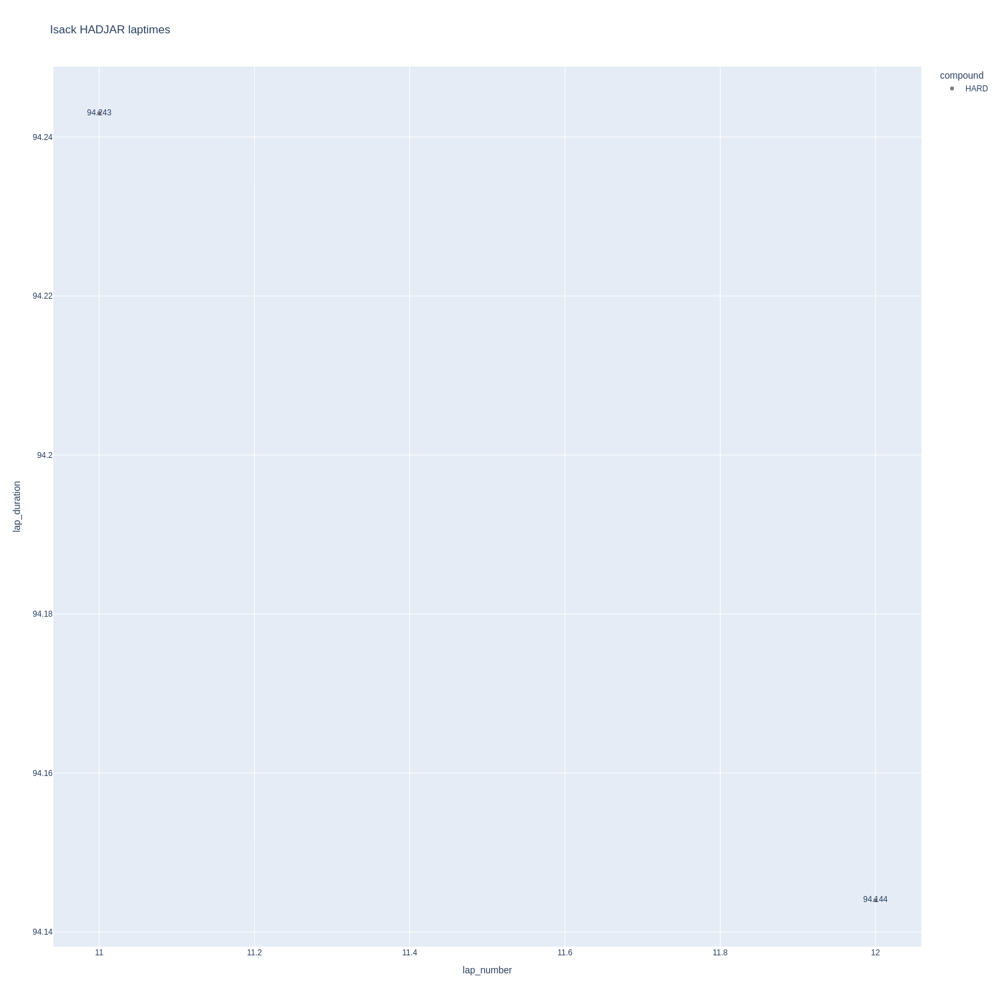

In [59]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

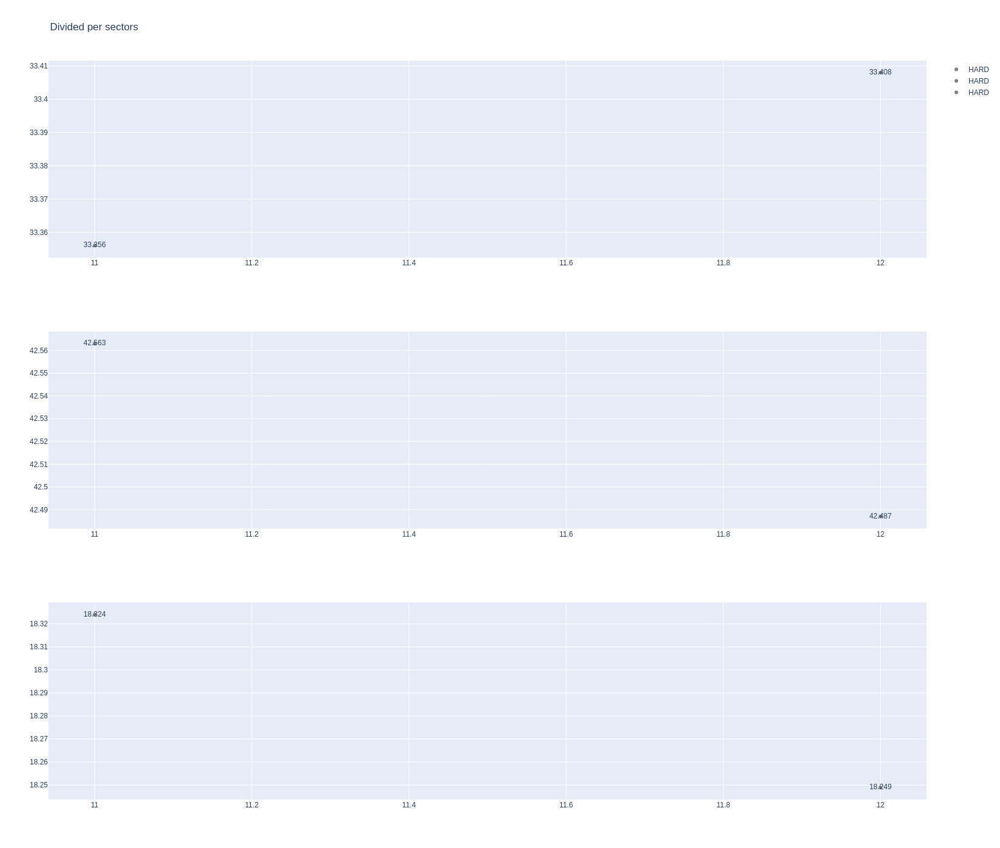

In [60]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [61]:
data = libraryDataF1.getinfolongruns(jointables2,22,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [62]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [63]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [64]:
stintInformation.query('driver_number == 87 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1256,10001,1,31,1,2,HARD,0
8,1256,10001,1,87,1,2,HARD,0
25,1256,10001,2,31,3,7,HARD,0
26,1256,10001,2,87,3,7,HARD,0
50,1256,10001,3,31,8,16,HARD,0
51,1256,10001,3,87,8,17,HARD,5
74,1256,10001,4,31,17,18,SOFT,0
75,1256,10001,4,87,17,18,SOFT,0


In [65]:
data = libraryDataF1.getinfolongruns(jointables2,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
235,Oliver BEARMAN,HARD,2025-04-05T03:07:08.521000+00:00,11,33.420,42.996,18.489,94.905
245,Oliver BEARMAN,HARD,2025-04-05T03:08:43.491000+00:00,12,33.481,42.817,18.334,94.632
252,Oliver BEARMAN,HARD,2025-04-05T03:10:18.039000+00:00,13,33.433,42.738,18.478,94.649
259,Oliver BEARMAN,HARD,2025-04-05T03:11:52.758000+00:00,14,32.967,43.065,18.409,94.441


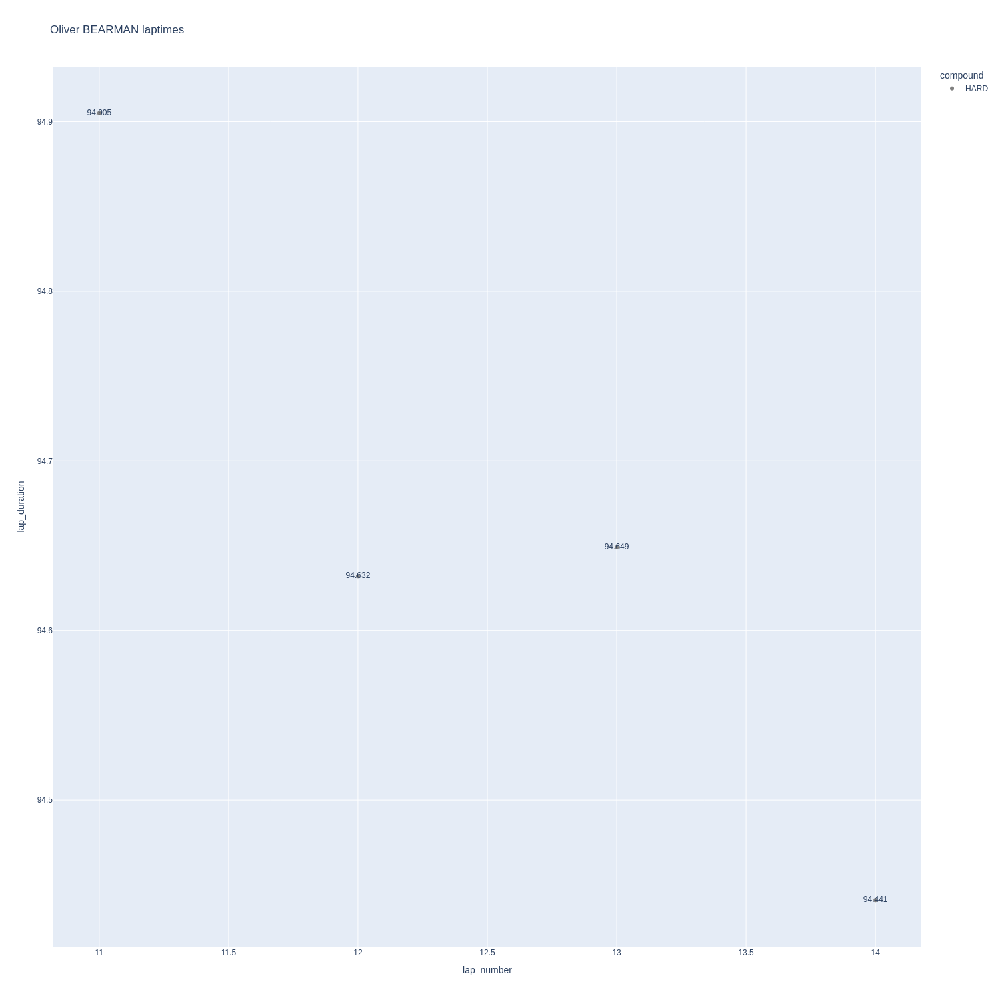

In [66]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

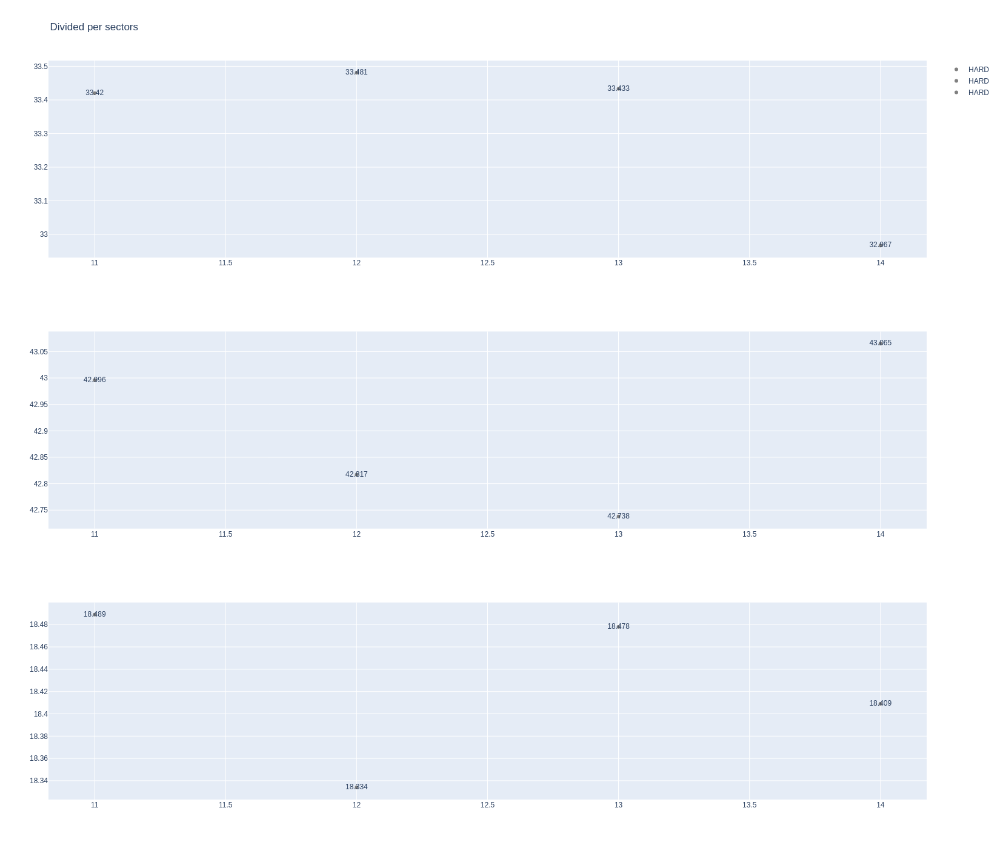

In [67]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [68]:
data = libraryDataF1.getinfolongruns(jointables2,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
200,Esteban OCON,HARD,2025-04-05T03:02:59.691000+00:00,9,33.639,42.755,18.501,94.895
213,Esteban OCON,HARD,2025-04-05T03:04:34.630000+00:00,10,33.578,42.841,18.483,94.902
228,Esteban OCON,HARD,2025-04-05T03:06:09.552000+00:00,11,33.455,42.899,18.620,94.974
238,Esteban OCON,HARD,2025-04-05T03:07:44.350000+00:00,12,33.152,42.692,18.584,94.428
247,Esteban OCON,HARD,2025-04-05T03:09:18.866000+00:00,13,33.258,42.808,18.585,94.651
255,Esteban OCON,HARD,2025-04-05T03:10:53.554000+00:00,14,33.301,42.798,18.793,94.892


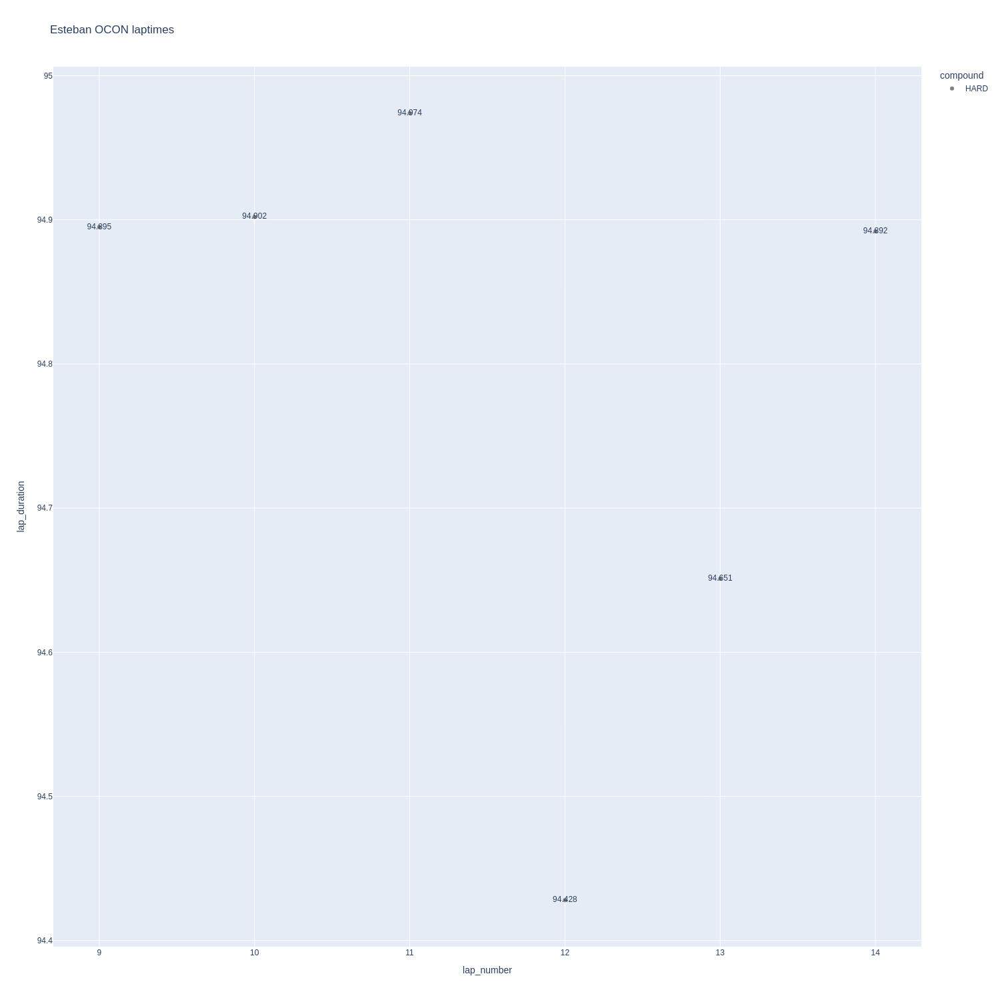

In [69]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

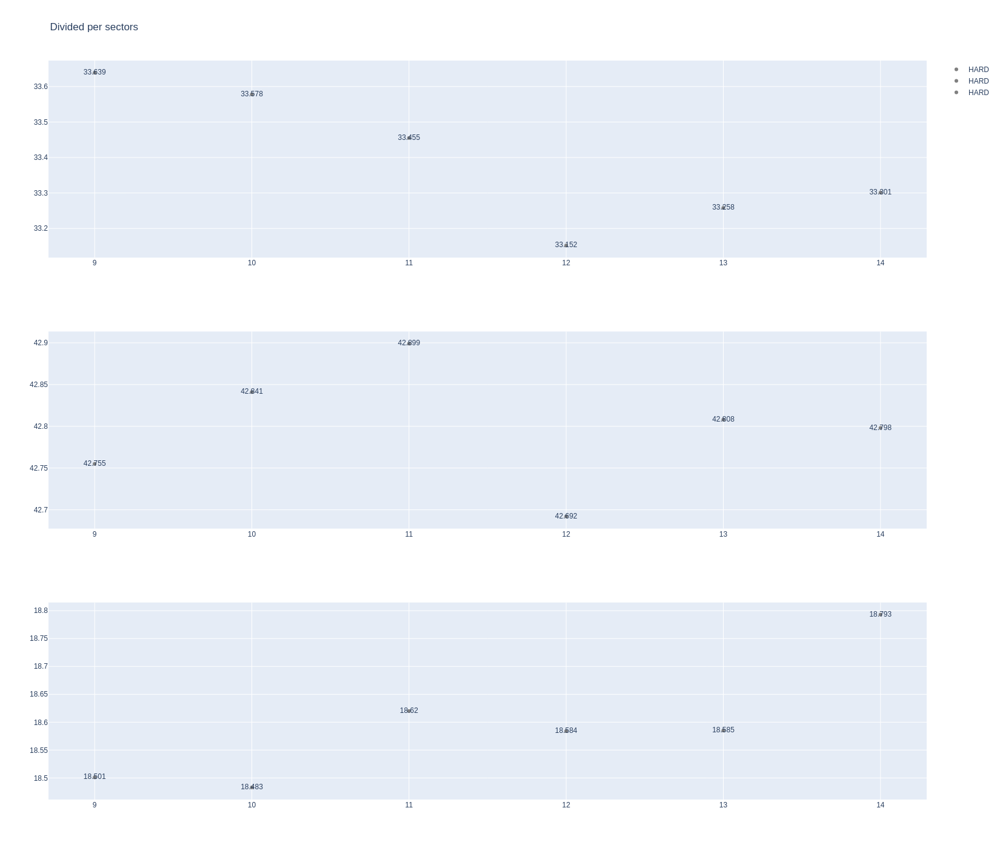

In [70]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [71]:
stintInformation.query('driver_number == 10 or driver_number == 7')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
18,1256,10001,1,7,1,5,SOFT,0
19,1256,10001,1,10,1,6,MEDIUM,0
41,1256,10001,2,7,6,11,SOFT,4
43,1256,10001,2,10,7,11,MEDIUM,5
60,1256,10001,3,10,12,14,SOFT,0
62,1256,10001,3,7,12,16,SOFT,0
69,1256,10001,4,10,15,16,SOFT,0


In [72]:
data =libraryDataF1.getinfolongruns(jointables2,7,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
15,Jack DOOHAN,SOFT,2025-04-05T02:32:04.365000+00:00,2,32.161,42.453,18.074,92.688


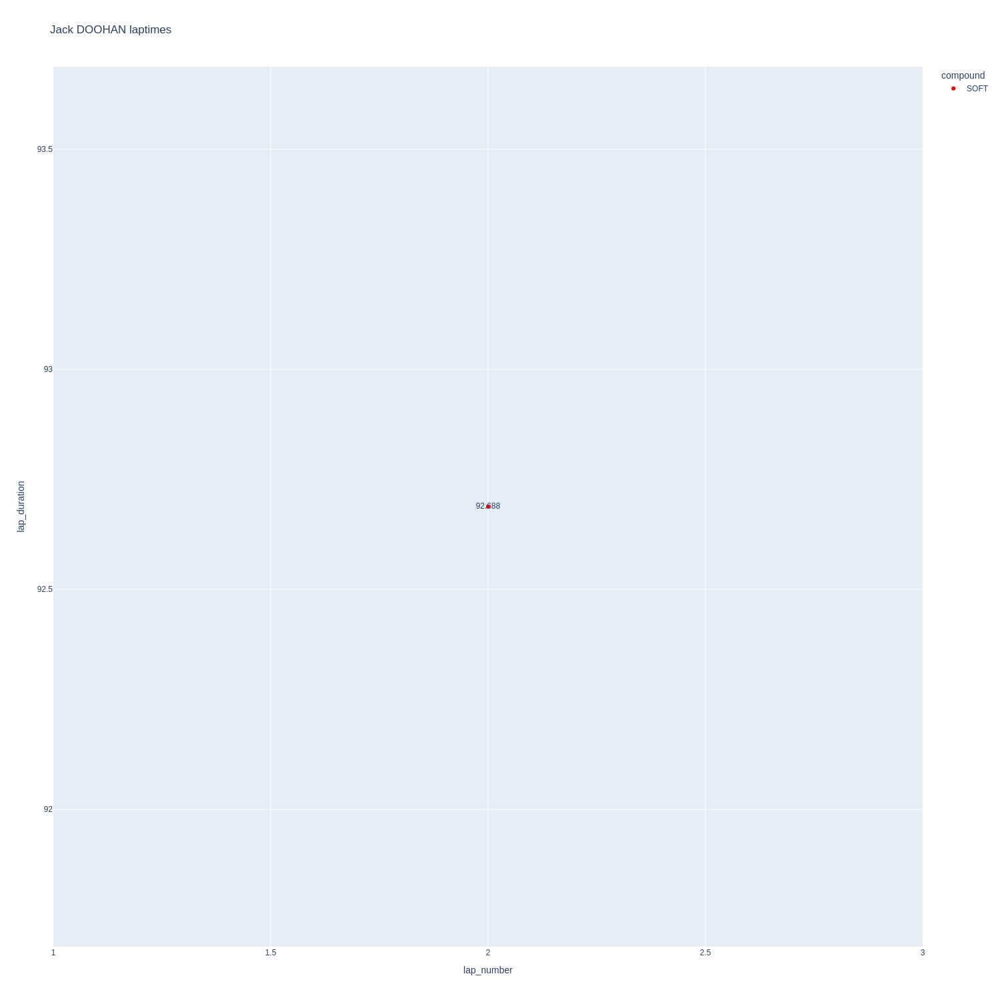

In [73]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

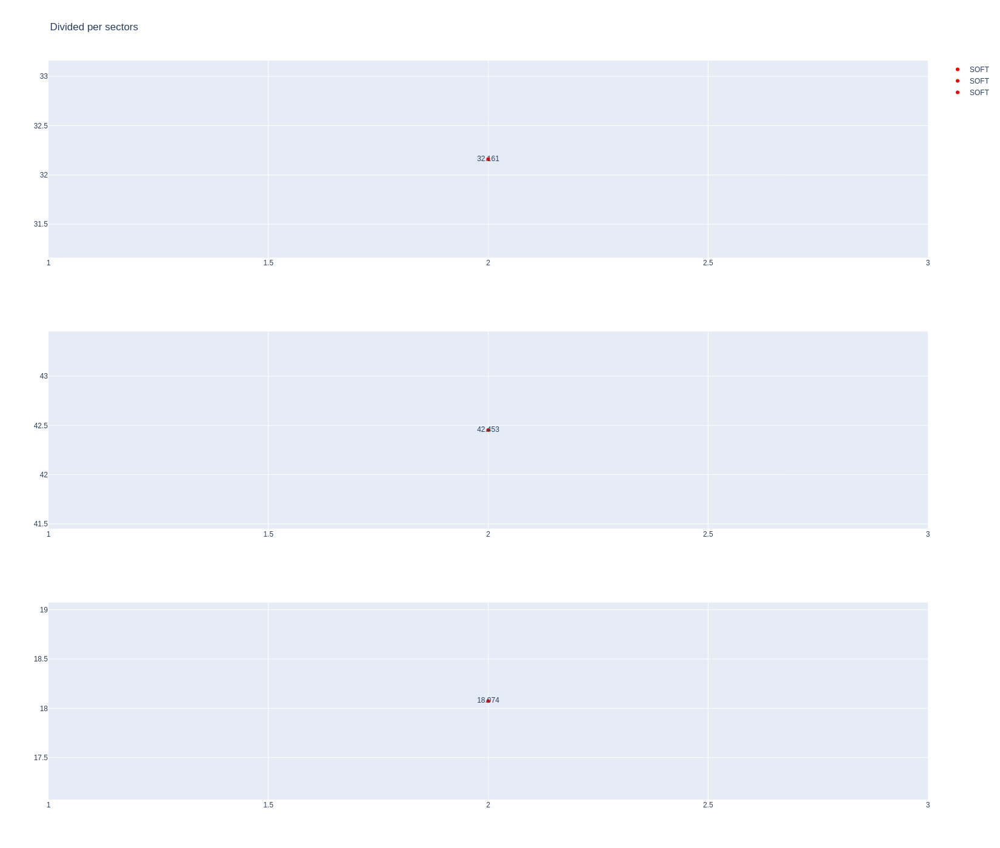

In [74]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [75]:
data = libraryDataF1.getinfolongruns(jointables2,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [76]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [77]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [78]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1256,10001,1,23,1,2,MEDIUM,0
16,1256,10001,1,55,1,4,HARD,0
24,1256,10001,2,23,3,6,MEDIUM,0
38,1256,10001,2,55,5,11,HARD,4
45,1256,10001,3,23,7,16,MEDIUM,0
64,1256,10001,3,55,12,19,HARD,11
77,1256,10001,4,23,17,20,SOFT,0
82,1256,10001,4,55,20,22,SOFT,0
83,1256,10001,5,55,23,23,SOFT,0


In [79]:
data = libraryDataF1.getinfolongruns(jointables2,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
168,Alexander ALBON,MEDIUM,2025-04-05T02:59:09.717000+00:00,9,33.422,41.857,18.017,93.296
206,Alexander ALBON,MEDIUM,2025-04-05T03:03:46.879000+00:00,12,32.815,41.957,17.853,92.625


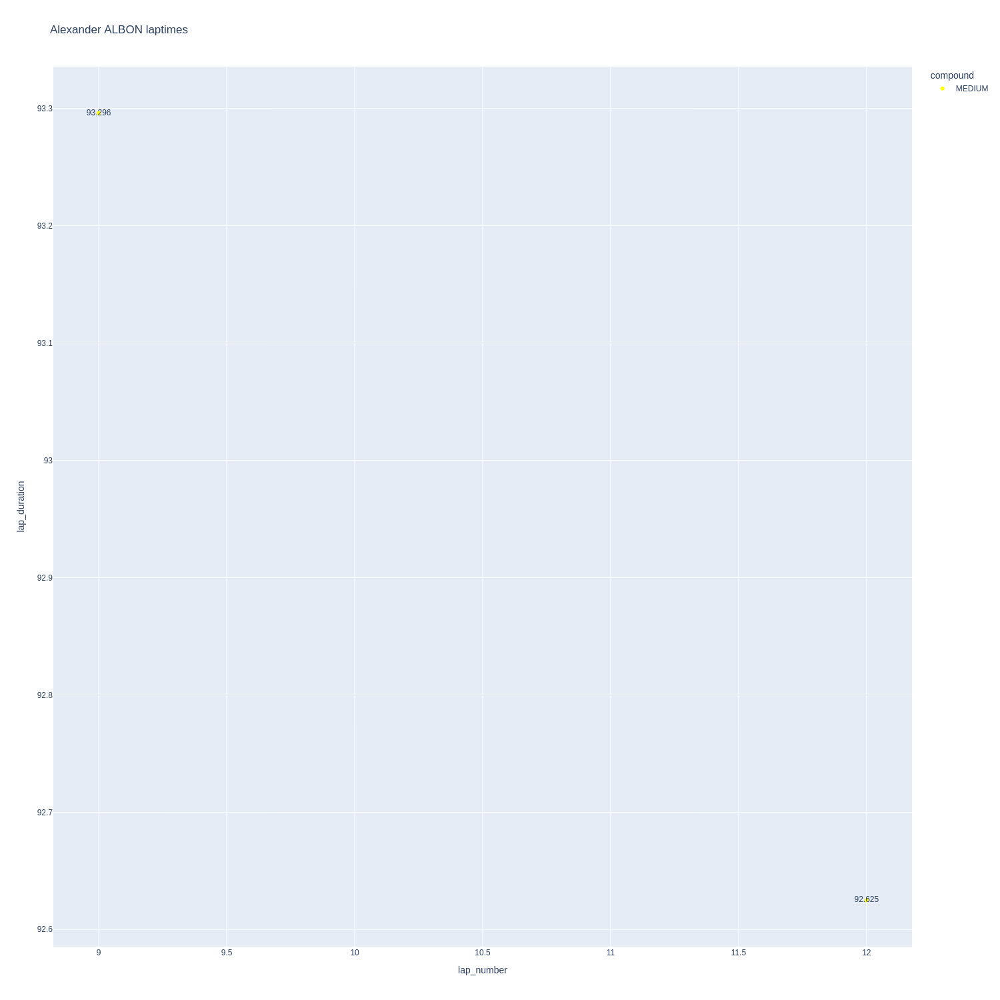

In [80]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

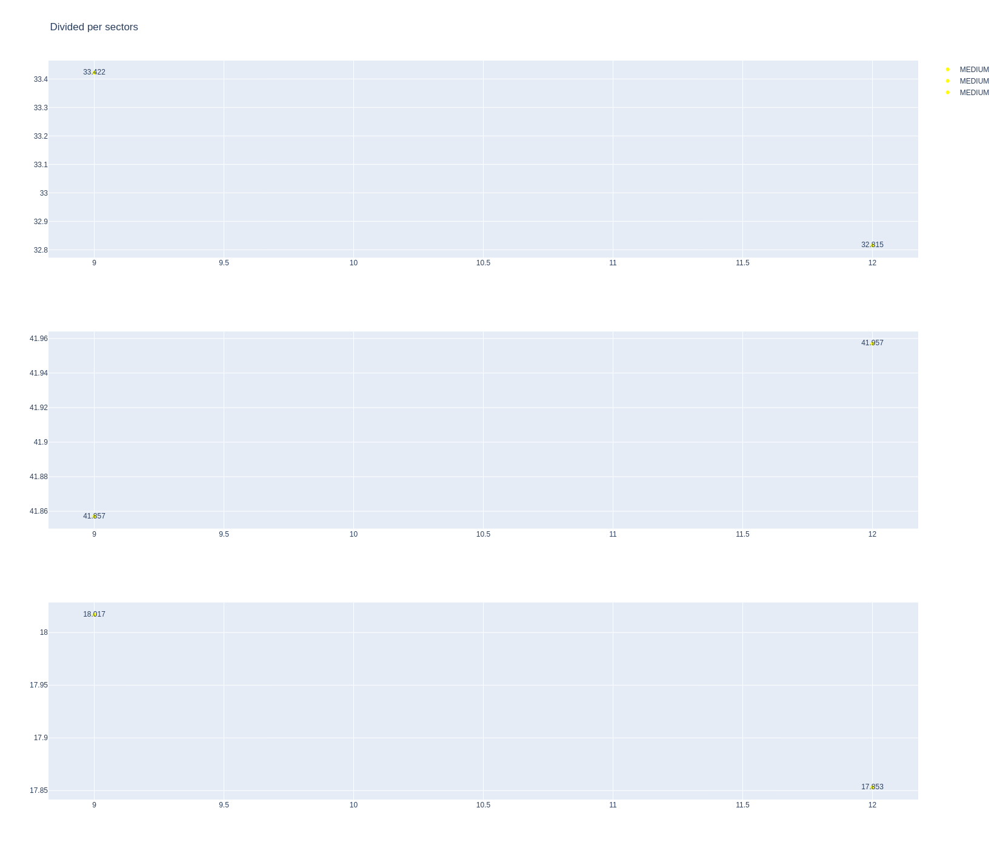

In [81]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [82]:
data= libraryDataF1.getinfolongruns(jointables2,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
253,Carlos SAINZ,HARD,2025-04-05T03:10:27.382000+00:00,18,32.068,41.745,21.126,94.939


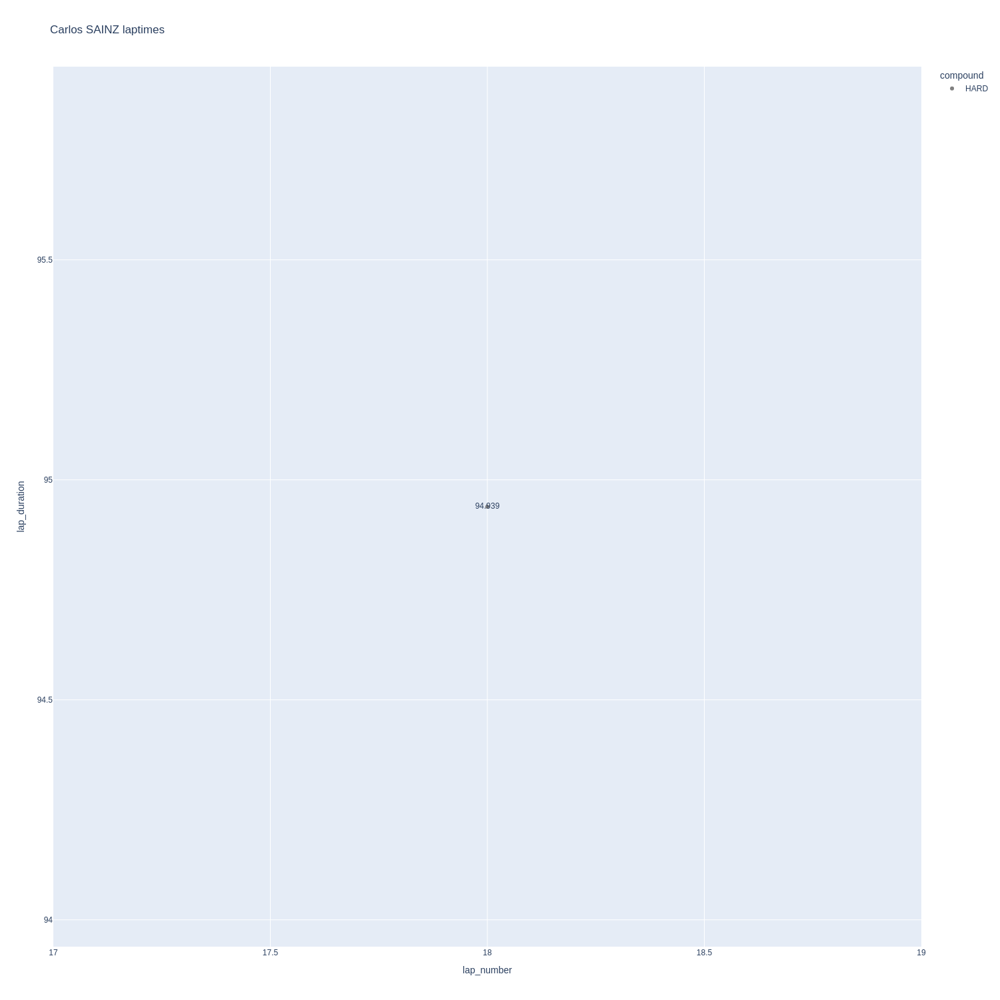

In [83]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

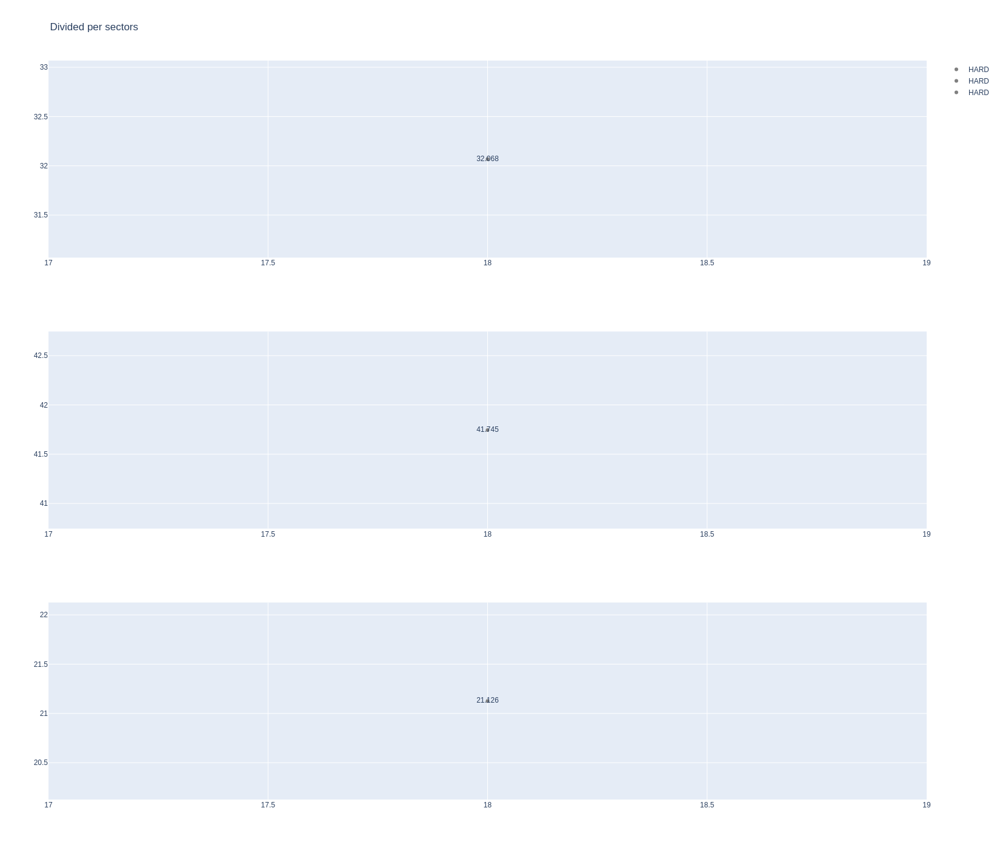

In [84]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [85]:
stintInformation.query('driver_number == 5 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
10,1256,10001,1,27,1,3,MEDIUM,0
11,1256,10001,1,5,1,4,MEDIUM,0
29,1256,10001,2,27,4,7,MEDIUM,0
33,1256,10001,2,5,5,6,MEDIUM,0
44,1256,10001,3,5,7,12,MEDIUM,5
49,1256,10001,3,27,8,16,MEDIUM,6
65,1256,10001,4,5,13,14,SOFT,0
73,1256,10001,4,27,17,18,SOFT,0


In [86]:
data = libraryDataF1.getinfolongruns(jointables2,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [87]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [88]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [89]:
data = libraryDataF1.getinfolongruns(jointables2,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
29,Nico HULKENBERG,MEDIUM,2025-04-05T02:34:10.144000+00:00,2,32.759,41.318,18.214,92.291
165,Nico HULKENBERG,MEDIUM,2025-04-05T02:58:56.373000+00:00,8,33.845,41.871,18.152,93.868
178,Nico HULKENBERG,MEDIUM,2025-04-05T03:00:30.221000+00:00,9,33.396,41.969,18.301,93.666
191,Nico HULKENBERG,MEDIUM,2025-04-05T03:02:03.972000+00:00,10,33.421,42.827,18.254,94.502
204,Nico HULKENBERG,MEDIUM,2025-04-05T03:03:38.410000+00:00,11,33.176,42.343,18.271,93.790
232,Nico HULKENBERG,MEDIUM,2025-04-05T03:06:48.427000+00:00,13,32.799,41.951,18.066,92.816
242,Nico HULKENBERG,MEDIUM,2025-04-05T03:08:21.288000+00:00,14,33.189,42.394,18.424,94.007


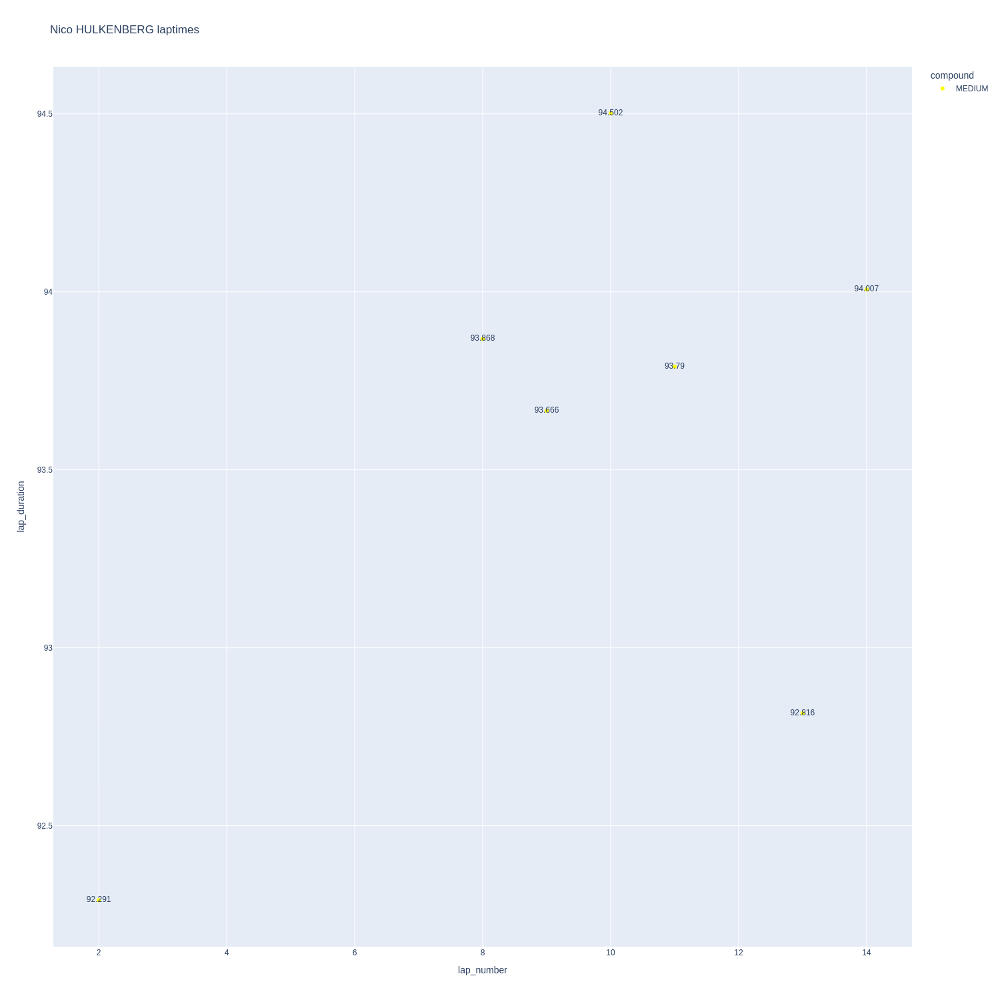

In [90]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

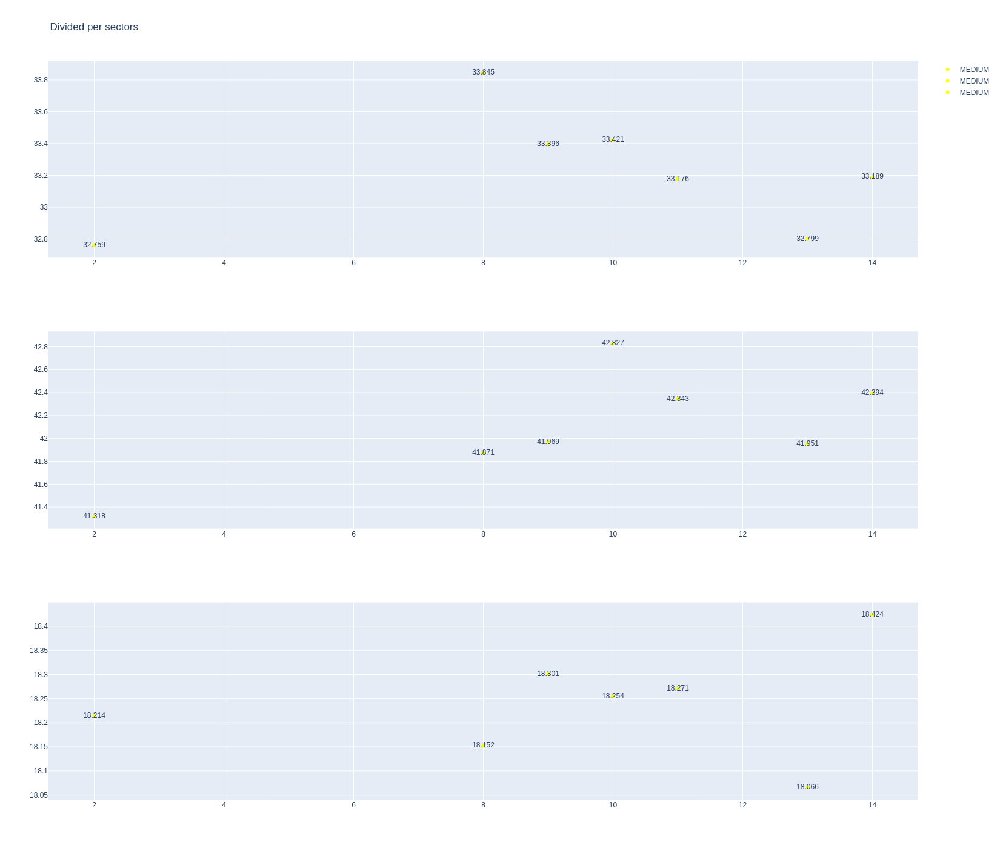

In [91]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Long runs mean for each driver

In [92]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Sorted by lap duration
Only Mercedes and Red Bull did long stints. Red Bull had a poor pace and they had some problems in sector 2 with the degradation. On the other hand, Mercedes was faster in general but they had degradation in sector 3.
Haas suffered in the first sector.


In [93]:
sorted_laps = pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3'])

In [94]:
sorted_laps.sort_values(by='lap_duration',ascending=True)

,driver,compound,lap_duration,sector1,sector2,sector3
11,Oscar PIASTRI,SOFT,92.414000,33.934000,40.605000,17.875000
5,Fernando ALONSO,MEDIUM,92.487333,32.553333,41.873667,18.060333
3,Jack DOOHAN,SOFT,92.688000,32.161000,42.453000,18.074000
6,Alexander ALBON,MEDIUM,92.960500,33.118500,41.907000,17.935000
4,Kimi ANTONELLI,MEDIUM,93.038250,33.058750,41.993500,17.986000
7,Nico HULKENBERG,MEDIUM,93.562857,33.226429,42.096143,18.240286
0,Max VERSTAPPEN,HARD,94.036500,33.314750,42.393500,18.328250
2,Isack HADJAR,HARD,94.193500,33.382000,42.525000,18.286500
1,Lando NORRIS,SOFT,94.267000,31.698000,41.705000,20.864000
12,Oliver BEARMAN,HARD,94.656750,33.325250,42.904000,18.427500


##### Sorted by sector 1
Piastri and Hamilton are strong in this sector being the  leaders of their teams. Also Alonso is strong and this could help him to win some positions. Red Bull will suffer on race.

In [95]:
sorted_laps.sort_values(by='sector1',ascending=True)[['driver','compound','sector1']]

,driver,compound,sector1
1,Lando NORRIS,SOFT,31.698000
10,Carlos SAINZ,HARD,32.068000
3,Jack DOOHAN,SOFT,32.161000
5,Fernando ALONSO,MEDIUM,32.553333
4,Kimi ANTONELLI,MEDIUM,33.058750
6,Alexander ALBON,MEDIUM,33.118500
7,Nico HULKENBERG,MEDIUM,33.226429
0,Max VERSTAPPEN,HARD,33.314750
12,Oliver BEARMAN,HARD,33.325250
2,Isack HADJAR,HARD,33.382000


##### Sorted by sector 2
Ferrari is strong here so it could make sense to say that the car is focused on turns. Racing Bulls were fast here so it could help to make overcuts on race.

In [96]:
sorted_laps.sort_values(by='sector2',ascending=True)[['driver','compound','sector2']]

,driver,compound,sector2
11,Oscar PIASTRI,SOFT,40.605000
1,Lando NORRIS,SOFT,41.705000
10,Carlos SAINZ,HARD,41.745000
5,Fernando ALONSO,MEDIUM,41.873667
6,Alexander ALBON,MEDIUM,41.907000
4,Kimi ANTONELLI,MEDIUM,41.993500
7,Nico HULKENBERG,MEDIUM,42.096143
0,Max VERSTAPPEN,HARD,42.393500
3,Jack DOOHAN,SOFT,42.453000
2,Isack HADJAR,HARD,42.525000


##### Sorted by sector 3
McLaren was the best here and if they take advantage this sector, they could extend the gap on race. Alpine could gain some positions thanks to the focus on the straight. Red Bull will suffer here.

In [97]:
sorted_laps.sort_values(by='sector3',ascending=True)[['driver','compound','sector3']]

,driver,compound,sector3
11,Oscar PIASTRI,SOFT,17.875000
6,Alexander ALBON,MEDIUM,17.935000
4,Kimi ANTONELLI,MEDIUM,17.986000
5,Fernando ALONSO,MEDIUM,18.060333
3,Jack DOOHAN,SOFT,18.074000
7,Nico HULKENBERG,MEDIUM,18.240286
2,Isack HADJAR,HARD,18.286500
0,Max VERSTAPPEN,HARD,18.328250
8,Liam LAWSON,MEDIUM,18.397600
12,Oliver BEARMAN,HARD,18.427500


#### Long runs mean

In [98]:
longruns_summary = libraryDataF1.obtainMeanLongRuns(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Mean pace per compound

In [102]:
libraryDataF1.showDataLongRuns(longruns_summary,"MEDIUM","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
5,F ALONSO,92.487
6,A ALBON,92.960
4,K ANTONELLI,93.038
7,N HULKENBERG,93.563
8,L LAWSON,94.854


In [103]:
libraryDataF1.showDataLongRuns(longruns_summary,"SOFT","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
11,O PIASTRI,92.414
3,J DOOHAN,92.688
1,L NORRIS,94.267


In [104]:
libraryDataF1.showDataLongRuns(longruns_summary,"HARD","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
0,M VERSTAPPEN,94.036
2,I HADJAR,94.194
12,O BEARMAN,94.657
9,E OCON,94.790
10,C SAINZ,94.939


### Comparaison between the poleman and the second

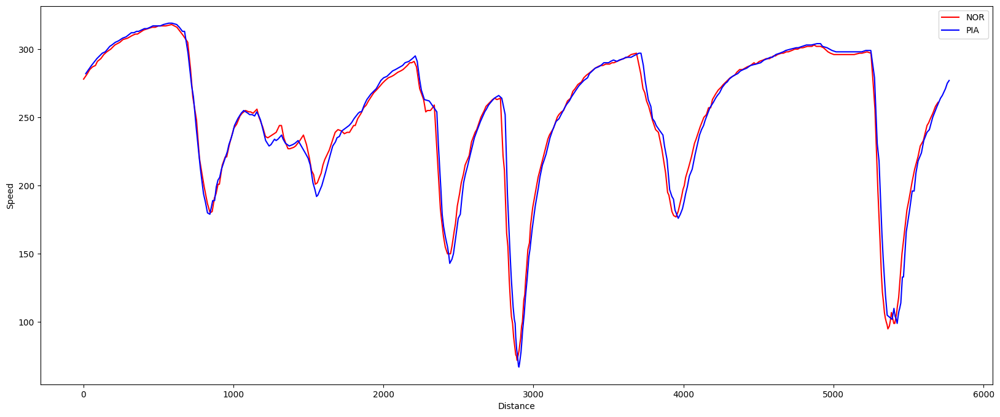

In [105]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

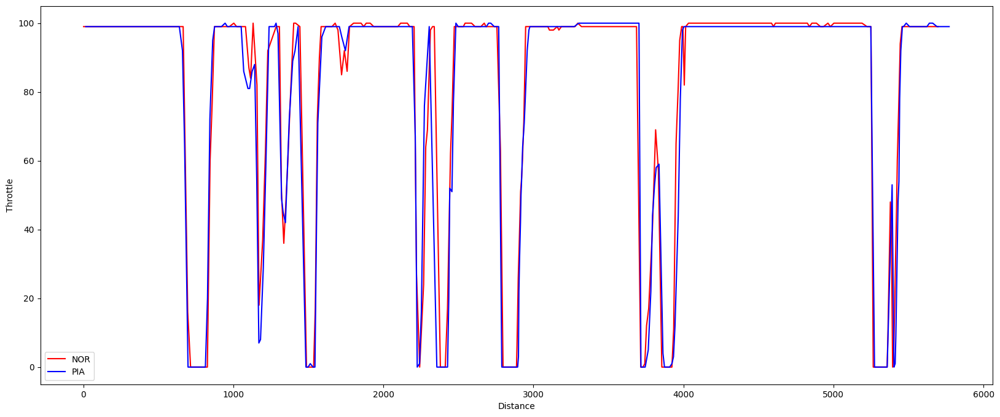

In [106]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

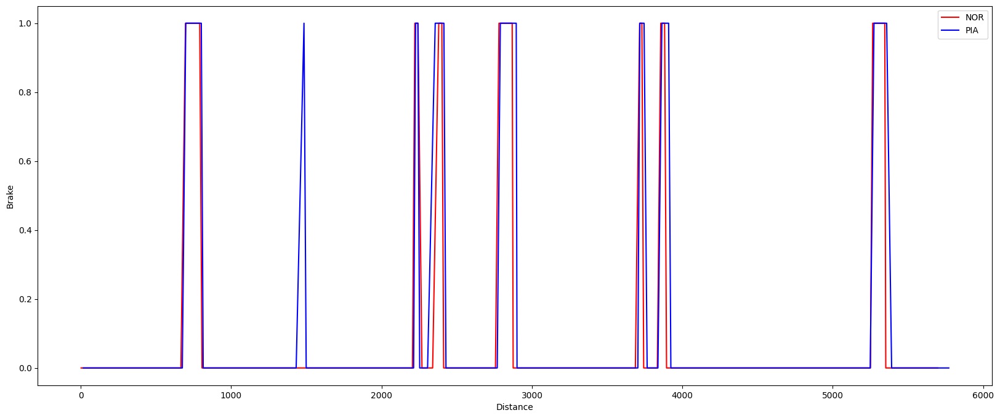

In [107]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

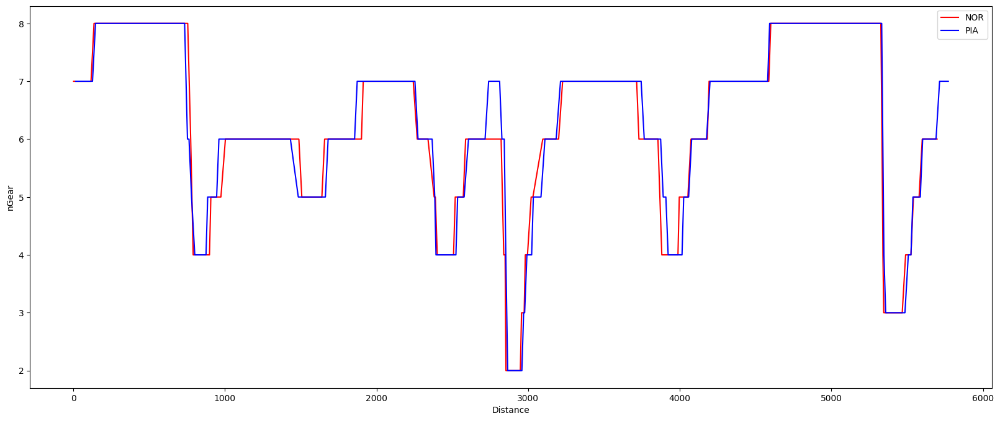

In [108]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Qualyfing
### Set up
First of all, it is neccesary to obtain the data about the qualyfing
#### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session.

In [109]:
libraryDataF1.obtain_information('race_control',session_key=10002)

,session_key,meeting_key,date,category,flag,lap_number,message,driver_number,scope,sector
0,10002,1256,2025-04-05T05:45:19+00:00,Other,None,None,RISK OF RAIN FOR F1 QUALIFYING SESSION IS 0%,None,None,None
1,10002,1256,2025-04-05T05:45:29+00:00,Other,None,None,LIGHT BLUE HEAD PADDING MATERIAL MUST BE USED,None,None,None
2,10002,1256,2025-04-05T06:00:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,None,Track,None
3,10002,1256,2025-04-05T06:18:00+00:00,Flag,CHEQUERED,None,CHEQUERED FLAG,None,Track,None
4,10002,1256,2025-04-05T06:18:12+00:00,Other,None,None,FIRST CAR TO TAKE THE FLAG - CAR 7 (DOO),None,None,None
5,10002,1256,2025-04-05T06:21:59+00:00,Other,None,None,FIA STEWARDS: Q1 INCIDENT INVOLVING CARS 22 (T...,None,None,None
6,10002,1256,2025-04-05T06:22:28+00:00,Other,None,None,FIA STEWARDS: Q1 INCIDENT INVOLVING CARS 22 (T...,None,None,None
7,10002,1256,2025-04-05T06:23:26+00:00,Other,None,None,CAR 18 (STR) LAP DELETED - TRACK LIMITS AT TUR...,None,None,None
8,10002,1256,2025-04-05T06:25:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,None,Track,None
9,10002,1256,2025-04-05T06:31:35+00:00,Flag,RED,None,RED FLAG,None,Track,None


### Obtain setup

In [110]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=10002)
stintInformation = libraryDataF1.obtain_information('stints',session_key=10002)
drivers = libraryDataF1.obtain_information('drivers',session_key=10002)
libraryDataF1.obtain_drivers_colours(drivers)

In [111]:
session = ff1.get_session(2025, 3, 'Q')
session.load()
session.laps["LapTimeSeconds"] = session.laps["LapTime"].dt.total_seconds()

core           INFO 	Loading data for Japanese Grand Prix - Qualifying [v3.3.0]
req            INFO 	No cached data found for session_info. Loading data...
_api           INFO 	Fetching session info data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for driver_info. Loading data...
_api           INFO 	Fetching driver list...
req            INFO 	Data has been written to cache!
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	No cached data found for session_status_data. Loading data...
_api           INFO 	Fetching session status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for track_status_data. Loading data...
_api           INFO 	Fetching track status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for _extended_timing_data. Loading dat

To obtain a better analysis, those laptimes deleted will be removed from this analysis in order to obtain the data with valid values. So that,taking into account the race control table, it will be neccesary to consult the qualyfing data to obtain the ids. 

In [ ]:
# qualyfing = qualyfing.drop(116)

In [112]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)
bestlap[0:1]

,meeting_key,session_key,driver_number,i1_speed,i2_speed,st_speed,date_start,lap_duration,is_pit_out_lap,duration_sector_1,duration_sector_2,duration_sector_3,segments_sector_1,segments_sector_2,segments_sector_3,lap_number
280,1256,10002,1,288.0,298.0,295.0,2025-04-05T07:07:05.543000+00:00,86.983,False,30.387,39.355,17.241,"[2051, 2049, 2051, 2048, 2049, 2048, 2048, 204...","[2051, 2049, 2049, 2048, 2049, 2049, 2049, 204...","[2048, 2048, 2048, 2064, 2064, 2064]",16


In this case, the fastest lap is 86.983 seconds (1.26.983= so that to obtain the competitve laps the fastest lap will be multiplied by 1.07 (93.071 seconds) due to, according to the rules all the drivers have to do unless one lap within this gap.

In [113]:
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration < 93.071")

In [114]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

#### Best lap per driver compared with the best lap of the session
In this chart we can see the deltas with compared with the fastest lap of the session that it could be different than the pole. In this case, this happened with Leclerc taking the best time but not taking the pole because his cest time in Q3 was not the best time of the session.

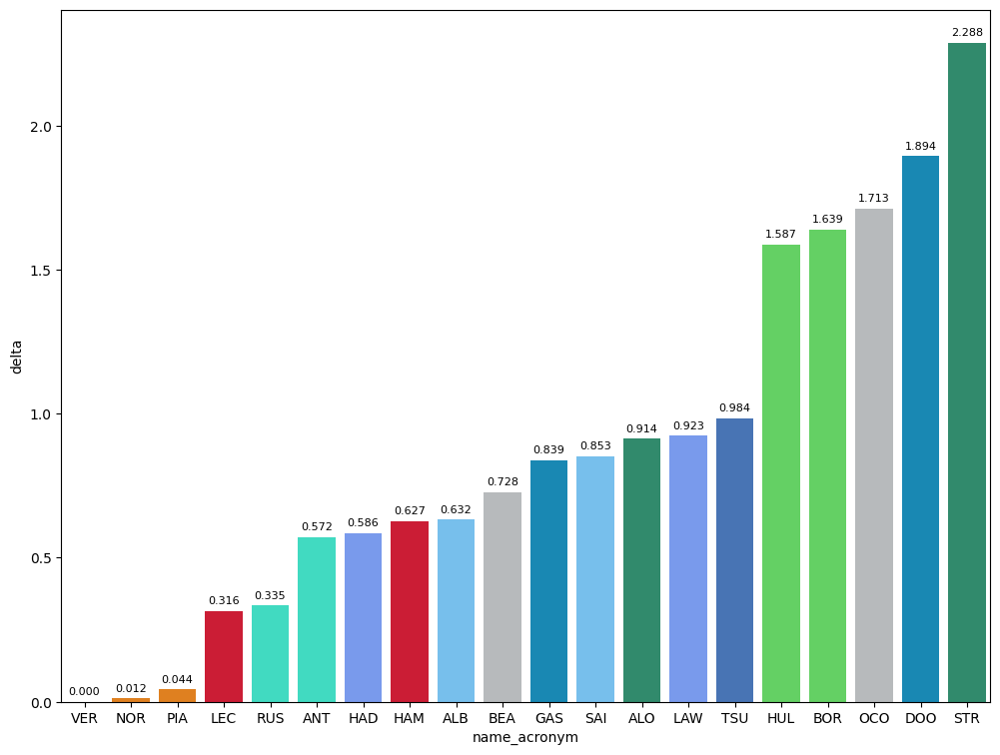

In [115]:
dt = jointables.sort_values(by=['fastest_lap'],ascending=True)
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Speed trap

#### Maximum speed per drivers

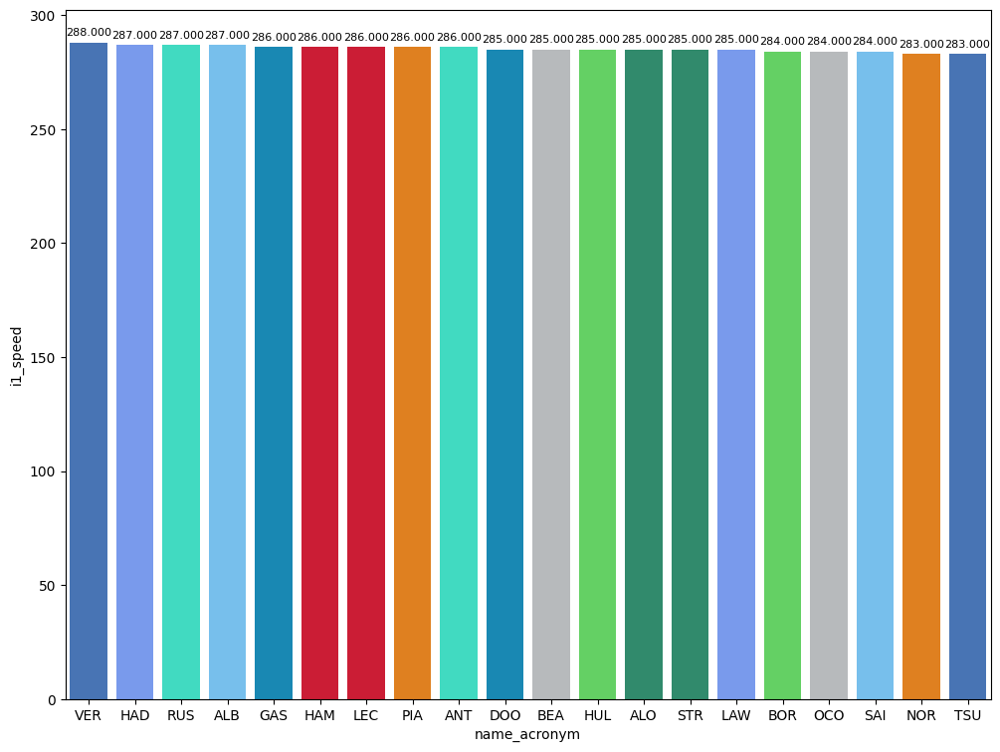

In [116]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

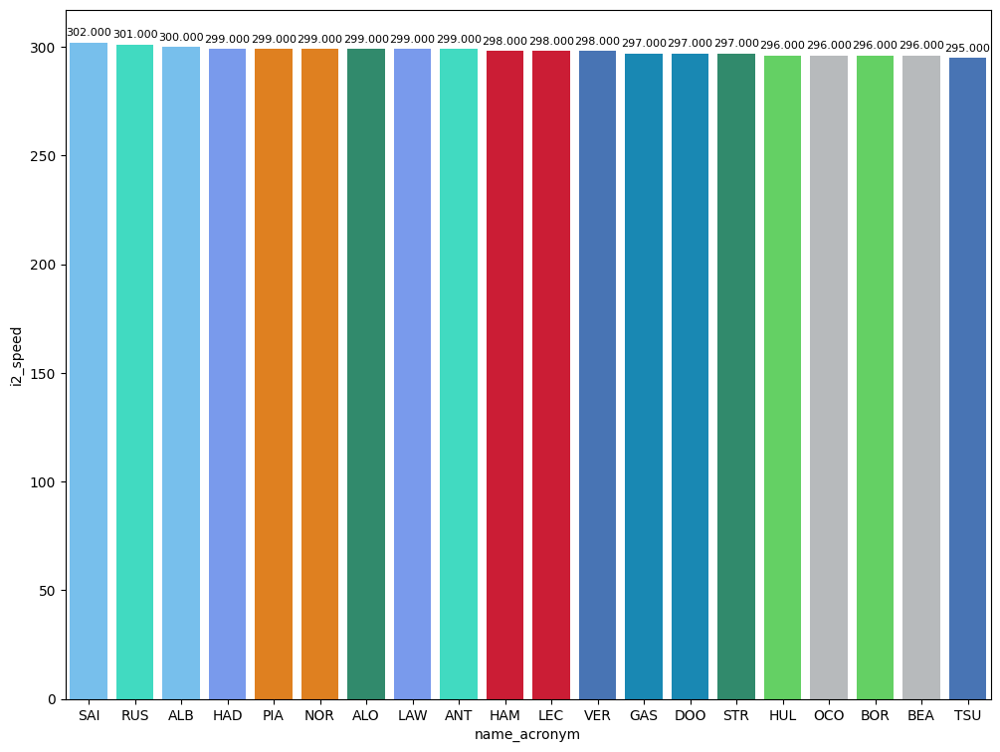

In [117]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

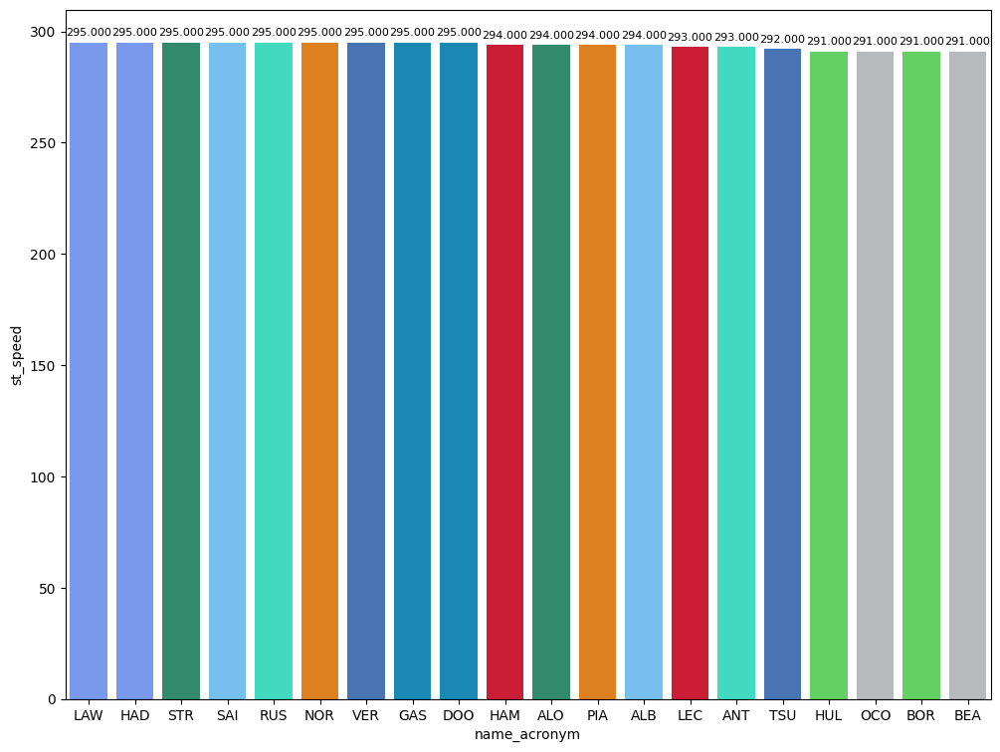

In [118]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Maximum speed per teams

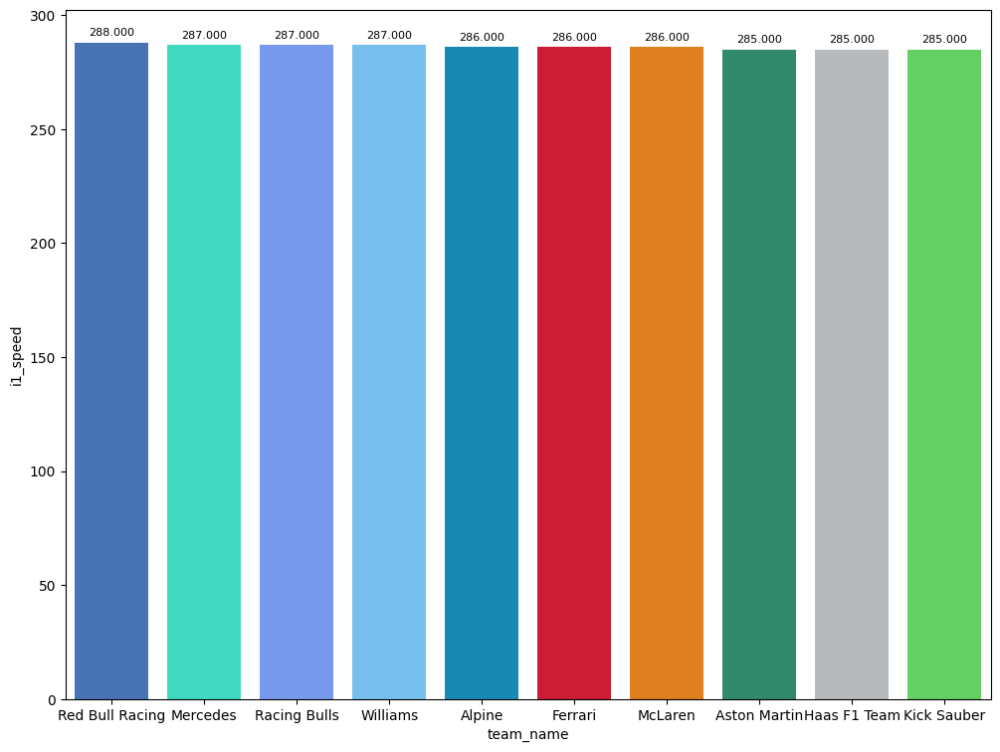

In [119]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i1_speed",top_speed)

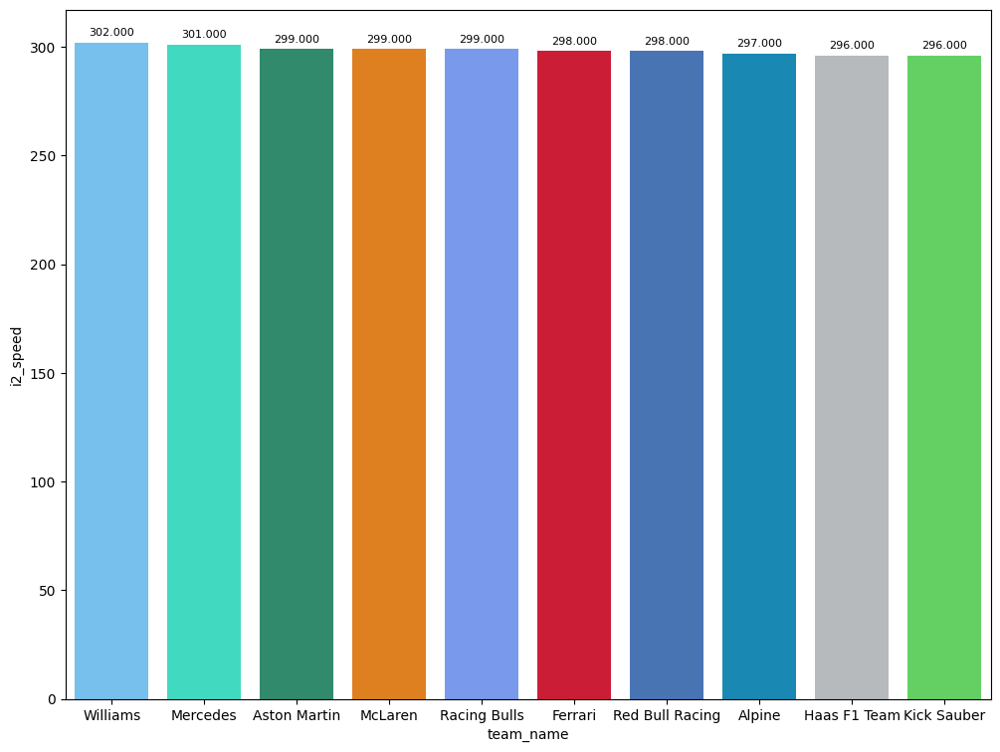

In [120]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i2_speed",top_speed)

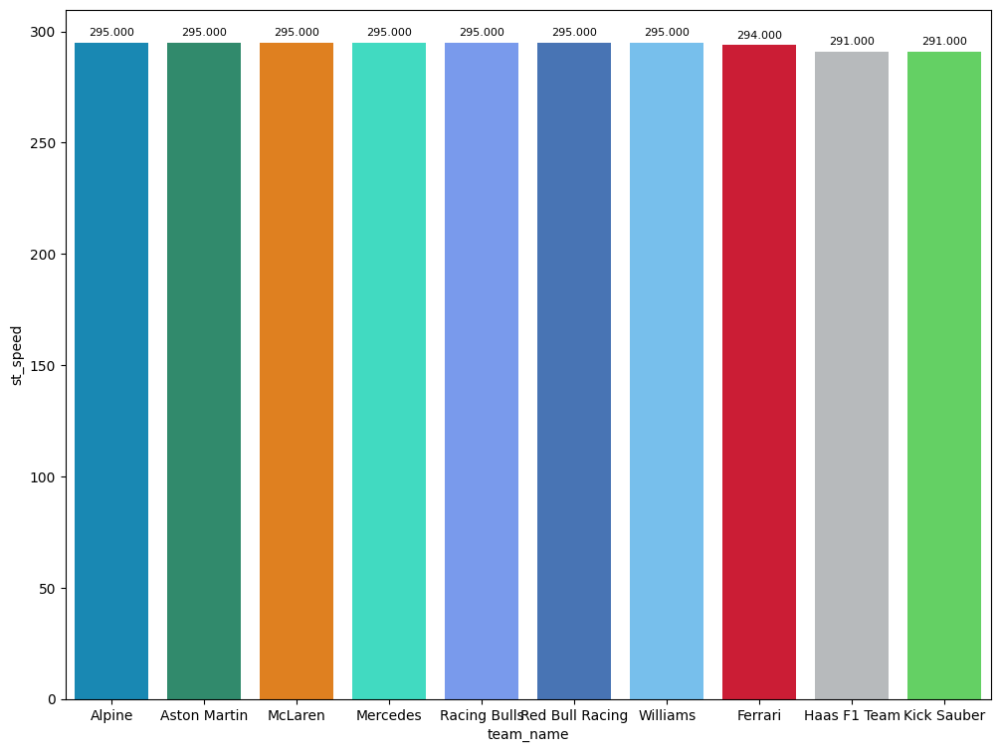

In [121]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","st_speed",top_speed)

In [124]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In order to know when each session finished, race control dataset will be consulted.

In [125]:
maximumDateQ1 = "date_start <'2025-04-05T06:25:00+00:00'"
maximumDateQ2 = "date_start <'2025-04-05T06:56:00+00:00' and date_start >'2025-04-05T06:25:00+00:00'"
maximumDateQ3 = "date_start >'2025-04-05T06:56:00+00:00'"

### Qualyfing 1
In this session the surprise came from Aston Martin with Stroll that knocked-out in Q1. The rest of the drivers were expected to be knocked-out

In [126]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will do a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [127]:
#Reference
P15 = q1Data[14:15]

In [128]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

Driver: Liam LAWSON Sector 1:  31.194 Sector 2:  39.833 Sector 3:  17.527


In [129]:
q1Data[15::]

,meeting_key_x,session_key_x,driver_number,i1_speed,i2_speed,st_speed,date_start,lap_duration,is_pit_out_lap,duration_sector_1,...,broadcast_name,country_code,first_name,full_name,headshot_url,last_name,team_colour,team_name,name_acronym,isFastestLap
20,1256,10002,27,288.0,300.0,297.0,2025-04-05T06:17:09.076000+00:00,88.570,False,31.082,...,N HULKENBERG,GER,Nico,Nico HULKENBERG,https://media.formula1.com/d_driver_fallback_i...,Hulkenberg,52E252,Kick Sauber,HUL,True
23,1256,10002,5,287.0,297.0,293.0,2025-04-05T06:17:20.748000+00:00,88.622,False,31.080,...,G BORTOLETO,None,Gabriel,Gabriel BORTOLETO,https://media.formula1.com/d_driver_fallback_i...,Bortoleto,52E252,Kick Sauber,BOR,True
2,1256,10002,31,286.0,296.0,295.0,2025-04-05T06:16:57.420000+00:00,88.696,False,31.041,...,E OCON,FRA,Esteban,Esteban OCON,https://media.formula1.com/d_driver_fallback_i...,Ocon,B6BABD,Haas F1 Team,OCO,True
11,1256,10002,7,288.0,301.0,299.0,2025-04-05T06:08:40.274000+00:00,88.877,False,30.983,...,J DOOHAN,None,Jack,Jack DOOHAN,https://media.formula1.com/d_driver_fallback_i...,Doohan,0093CC,Alpine,DOO,True
64,1256,10002,18,285.0,297.0,295.0,2025-04-05T06:05:30.273000+00:00,89.271,False,31.034,...,L STROLL,CAN,Lance,Lance STROLL,https://media.formula1.com/d_driver_fallback_i...,Stroll,229971,Aston Martin,STR,True


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
It was a close battle to pass to Q2 with less of 2 tenths among the driver at risk and the last driver. Until the third sector, Stroll and Gasly had the chance to pass to Q2.

In [130]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,27,0.016,-0.112,0.151,-0.023,HUL
1,5,0.068,-0.114,0.167,0.015,BOR
2,31,0.142,-0.153,0.304,-0.009,OCO
3,7,0.323,-0.211,0.353,0.181,DOO
4,18,0.717,-0.160,0.650,0.227,STR


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: Futur

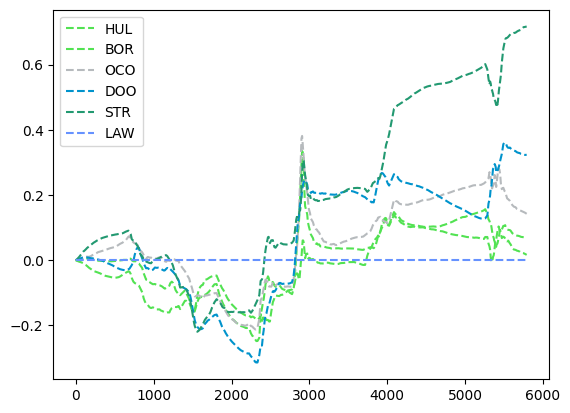

In [131]:
libraryDataF1.draw_gap(P15,15,20,q1Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
Albon was able to pass Hulkenberg, but, unfortunately, his second sector was bad.

In [132]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[0:14].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,81,-0.867,-0.504,-0.291,-0.072,PIA
1,63,-0.711,-0.456,-0.171,-0.084,RUS
2,4,-0.709,-0.584,-0.108,-0.017,NOR
3,16,-0.634,-0.524,0.008,-0.118,LEC
4,44,-0.612,-0.521,-0.057,-0.034,HAM
5,1,-0.611,-0.498,-0.115,0.002,VER
6,22,-0.587,-0.355,-0.154,-0.078,TSU
7,12,-0.586,-0.294,-0.148,-0.144,ANT
8,10,-0.368,-0.528,0.258,-0.098,GAS
9,55,-0.345,-0.259,-0.039,-0.047,SAI


#### Best sector per driver
In this section we can see the best sector of the session

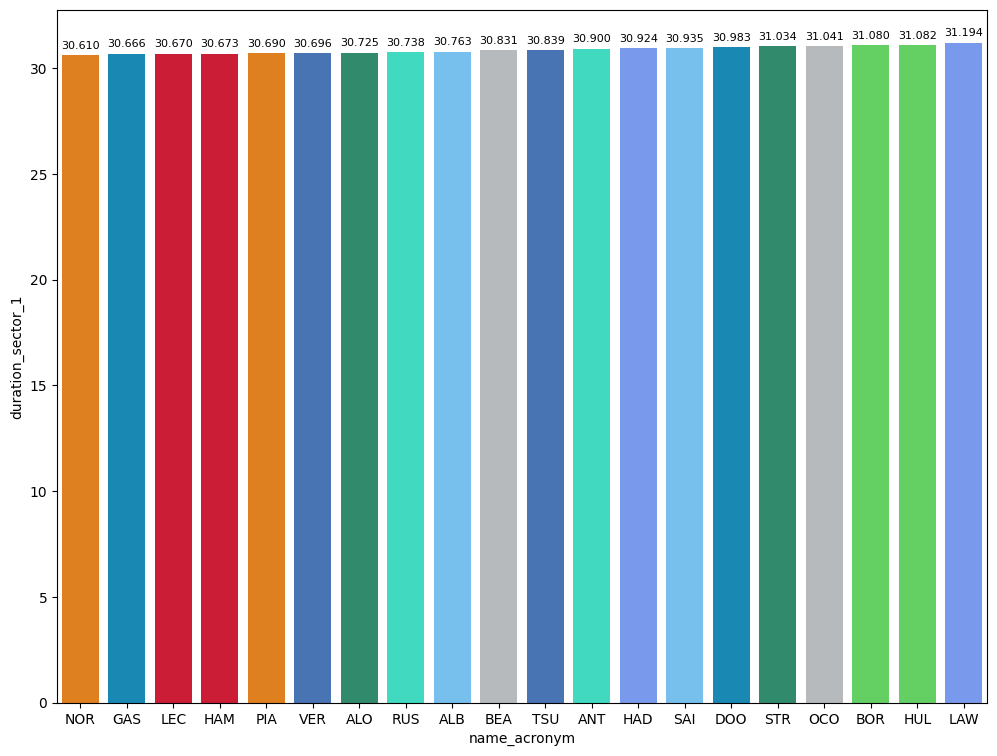

In [133]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

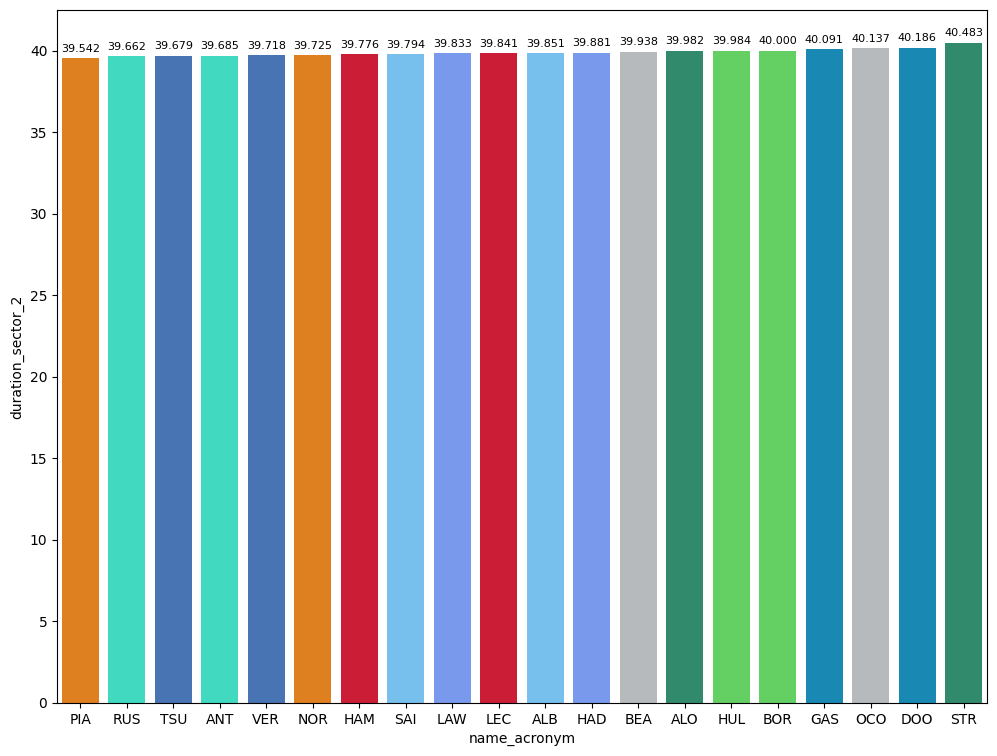

In [134]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

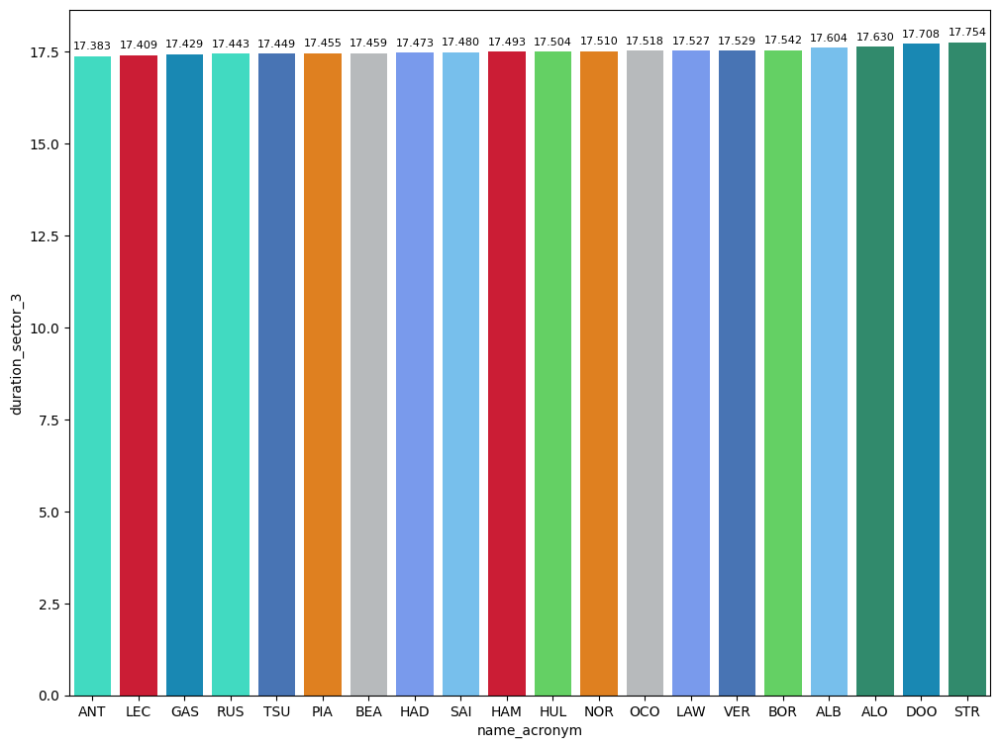

In [135]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 2
In this session, there were not surprises

In [136]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [137]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

Driver: Alexander ALBON Sector 1:  30.714 Sector 2:  39.651 Sector 3:  17.418


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
RB had a good pace, as we can see in the standings. Tsunoda made it through Q2 and Ricciardo finished P11.

In [138]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,10,0.039,-0.121,0.189,-0.029,GAS
1,55,0.053,0.046,-0.072,0.079,SAI
2,14,0.114,-0.081,0.054,0.141,ALO
3,30,0.123,0.165,-0.017,-0.025,LAW
4,22,0.217,0.126,0.021,0.070,TSU


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: Futur

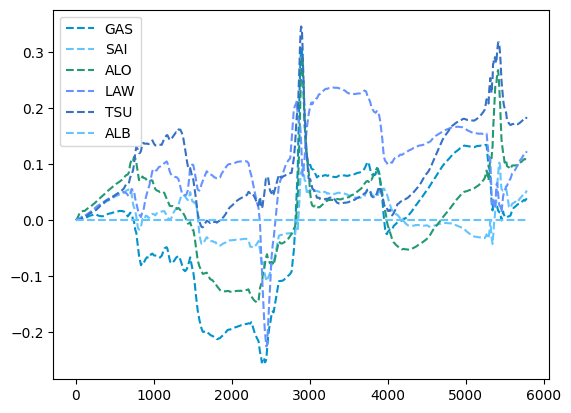

In [139]:
libraryDataF1.draw_gap(P10,10,15,q2Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
RB had a good pace but it was not enough to fight with the drivers that finished better than their drivers.

In [144]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[0:9].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,4,-0.637,-0.263,-0.263,-0.111,NOR
1,63,-0.383,-0.256,-0.078,-0.049,RUS
2,1,-0.281,-0.204,-0.010,-0.067,VER
3,81,-0.276,-0.056,-0.225,0.005,PIA
4,16,-0.228,-0.162,-0.047,-0.019,LEC
5,44,-0.173,-0.015,-0.197,0.039,HAM
6,12,-0.144,0.036,-0.057,-0.123,ANT
7,87,-0.072,-0.045,-0.012,-0.015,BEA
8,6,-0.008,0.069,-0.060,-0.017,HAD


#### Best sector per driver
In this section we can see the best sector of the session

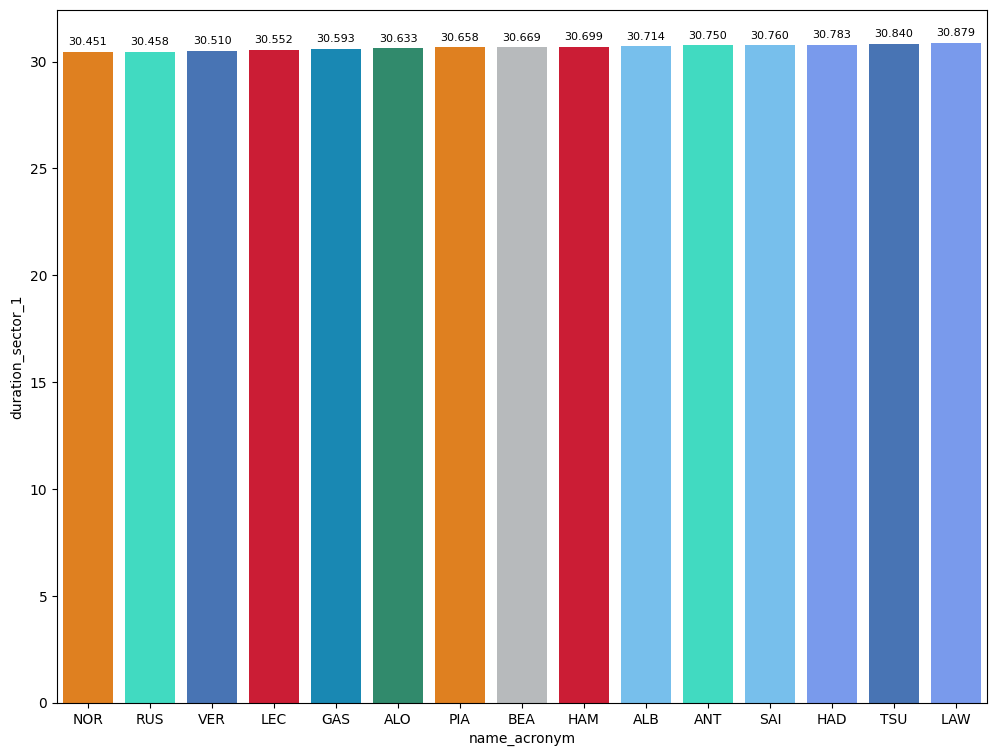

In [145]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q2Data.sort_values(by=['duration_sector_1'],ascending=True))

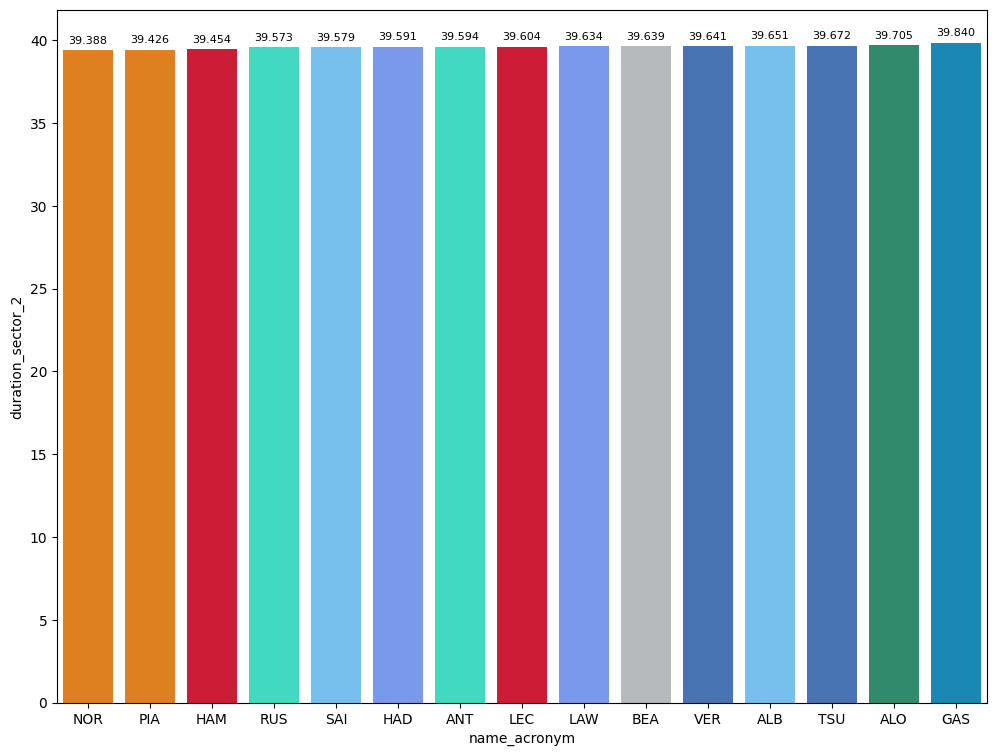

In [146]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q2Data.sort_values(by=['duration_sector_2'],ascending=True))

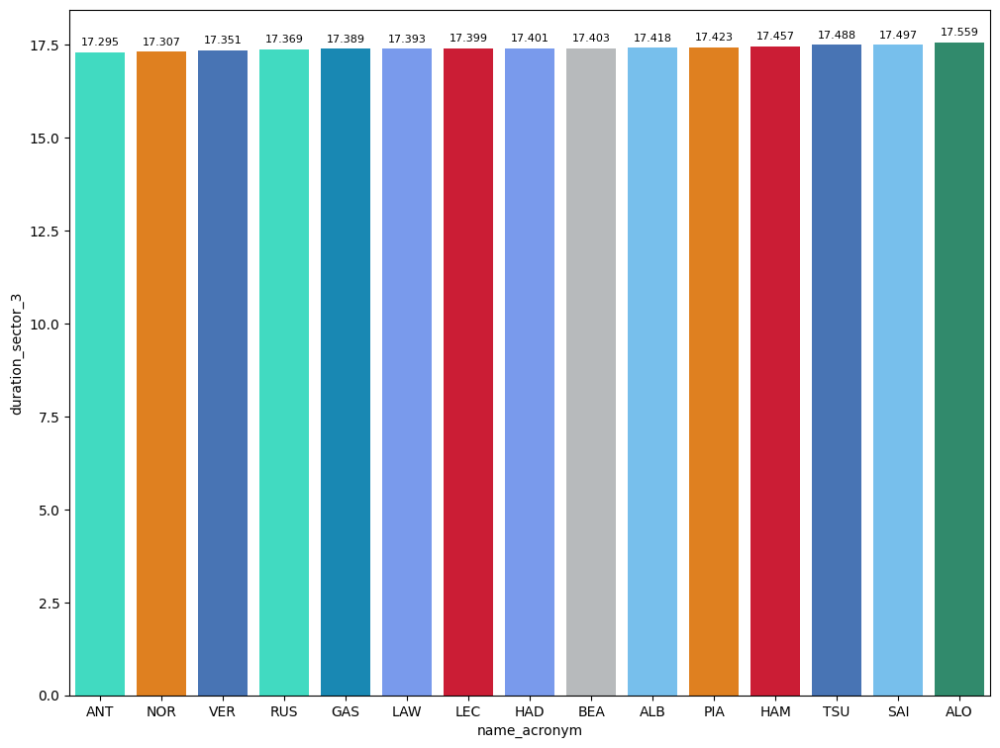

In [147]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q2Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 3

In [148]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [149]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

Driver: Max VERSTAPPEN Sector 1:  30.387 Sector 2:  39.355 Sector 3:  17.241


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
Red Bull was dominant in Japan as we can see in qualyfing. After finishing the second sector, Perez had a better laptime than Verstappen but a better sector from the Dutch driver afford to him to take the pole.

In [150]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,4,0.012,-0.029,-0.054,0.095,NOR
1,81,0.044,0.238,-0.158,-0.036,PIA
2,16,0.316,0.148,-0.003,0.171,LEC
3,63,0.335,-0.011,0.244,0.102,RUS
4,12,0.572,0.282,0.148,0.142,ANT
5,6,0.586,0.276,0.116,0.194,HAD
6,44,0.627,0.119,0.343,0.165,HAM
7,23,0.632,0.217,0.257,0.158,ALB
8,87,0.884,0.259,0.298,0.327,BEA


#### Best sector per driver
In this section we can see the best sector of the session

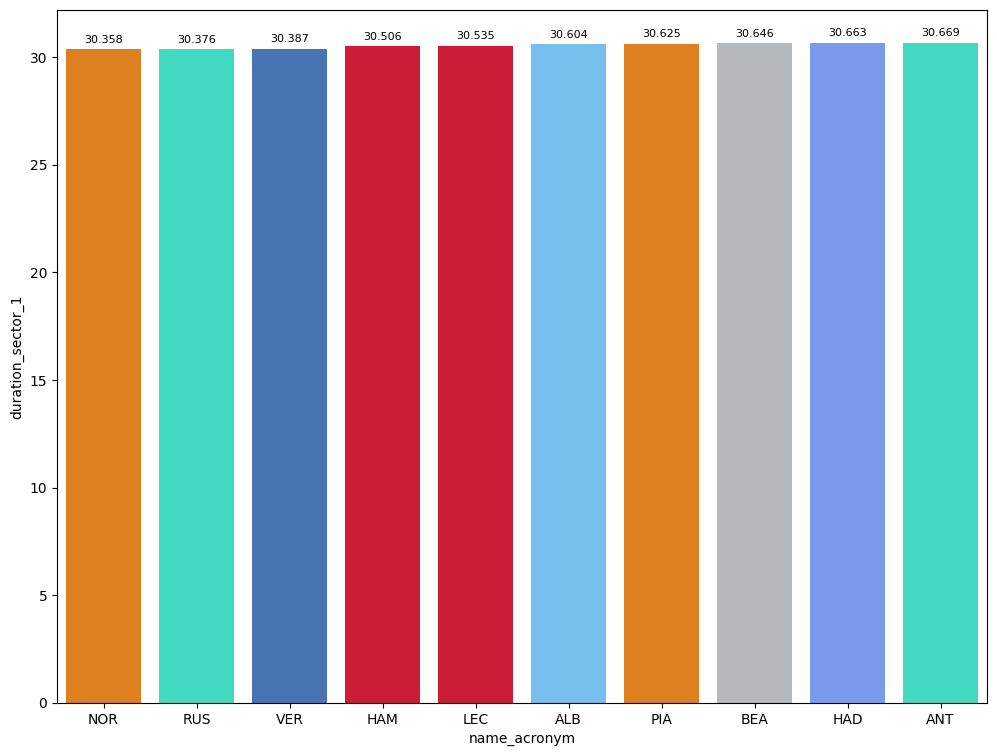

In [151]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

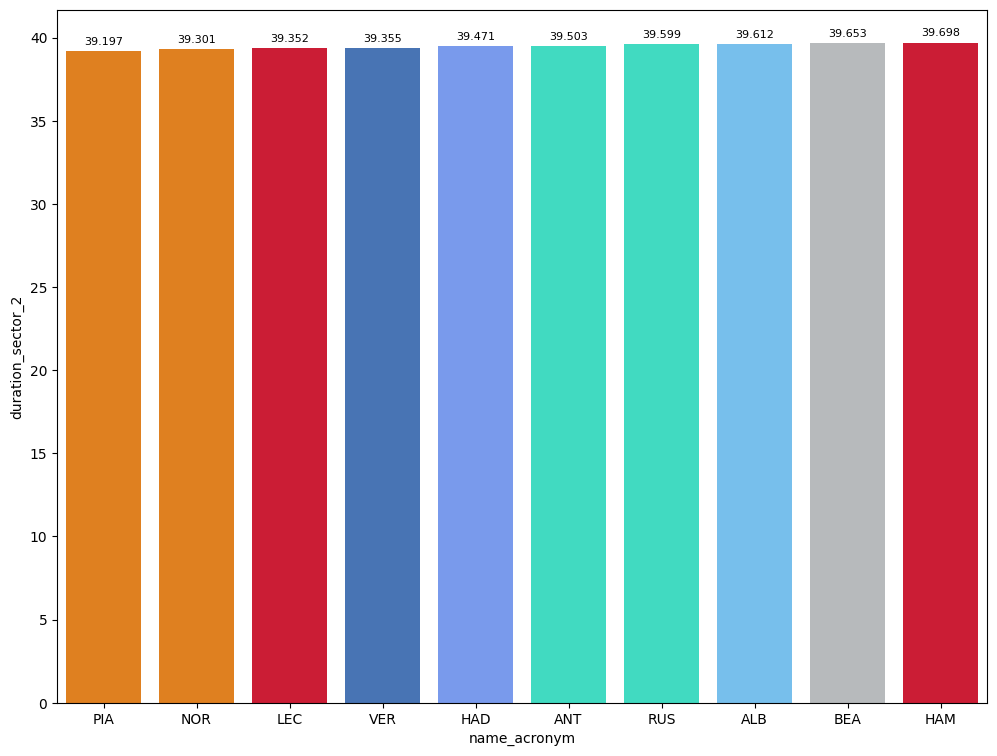

In [152]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

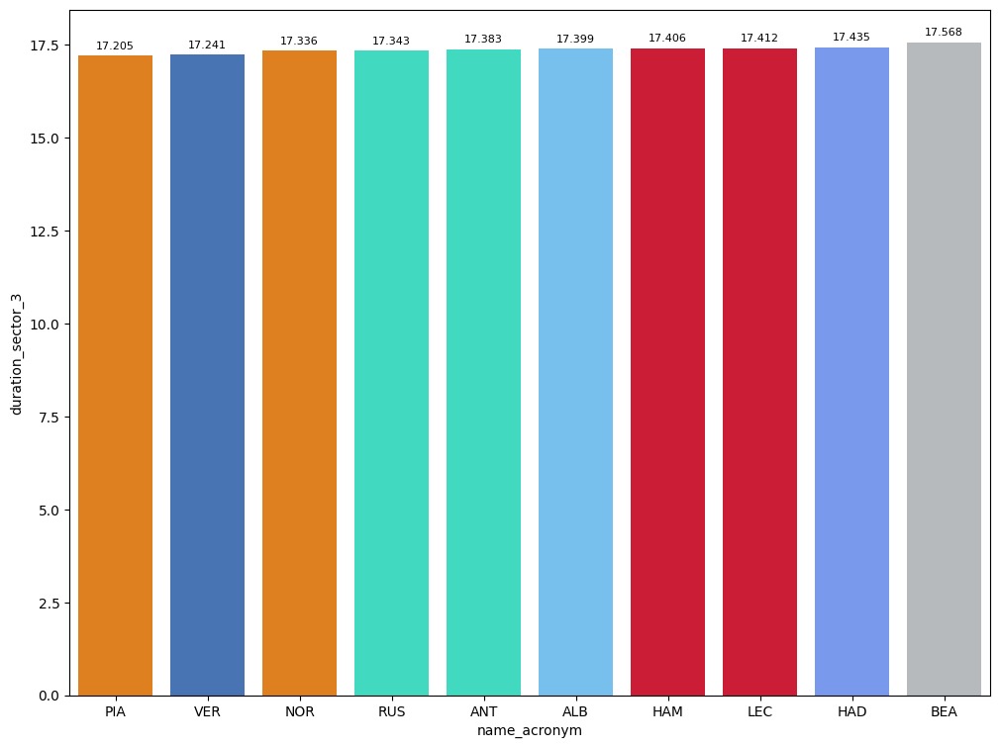

In [153]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

#### Best sector per driver of the session (in general)

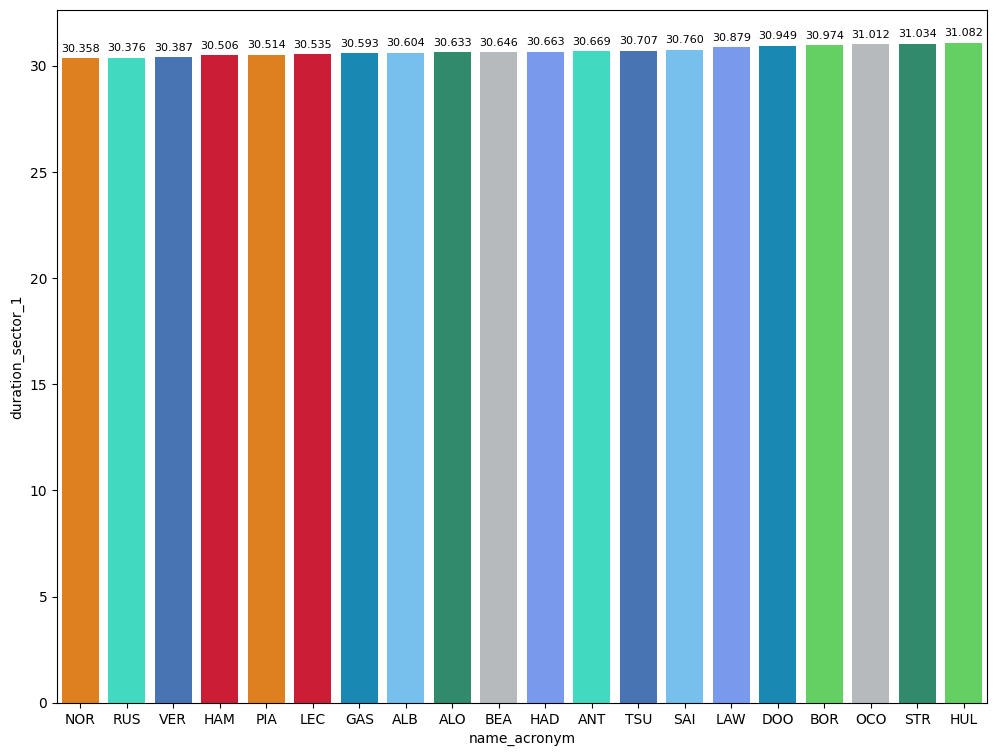

In [154]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

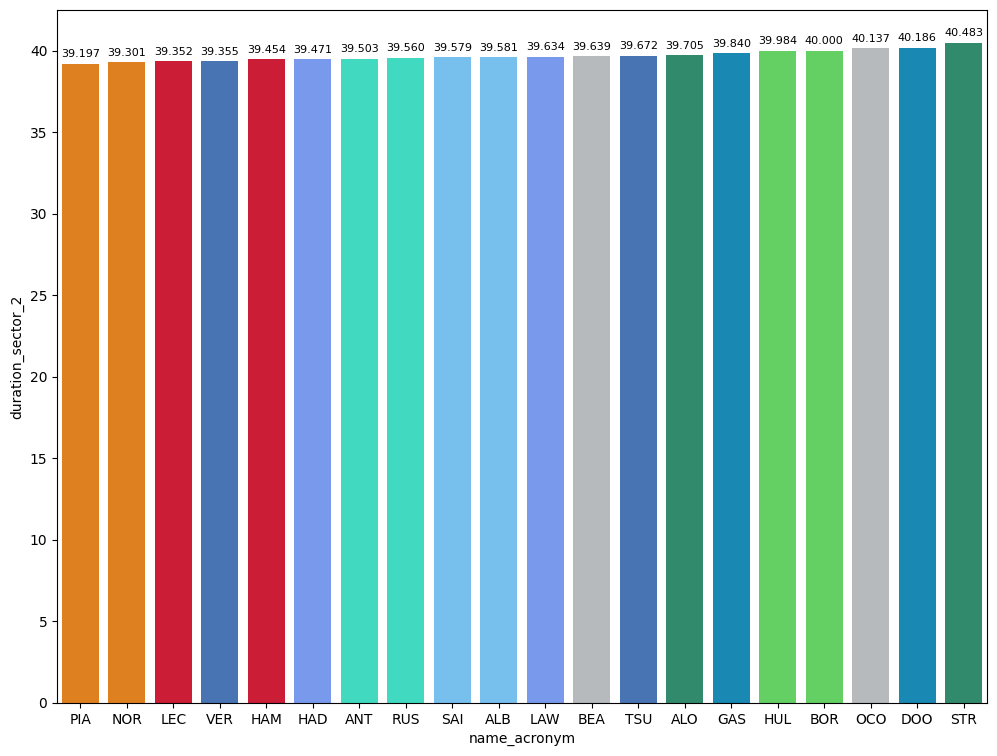

In [155]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

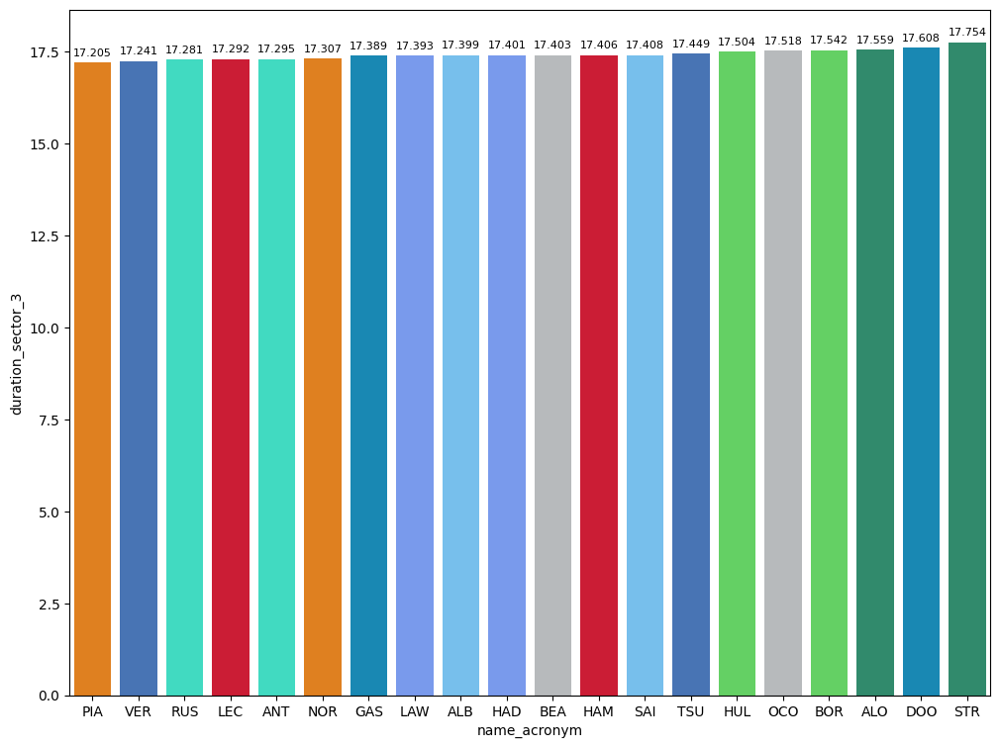

In [156]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

### Comparaison between the poleman and the second

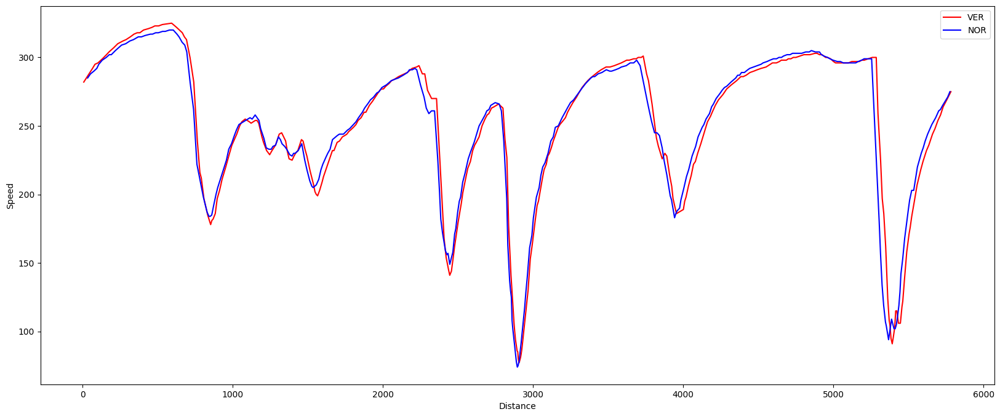

In [157]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

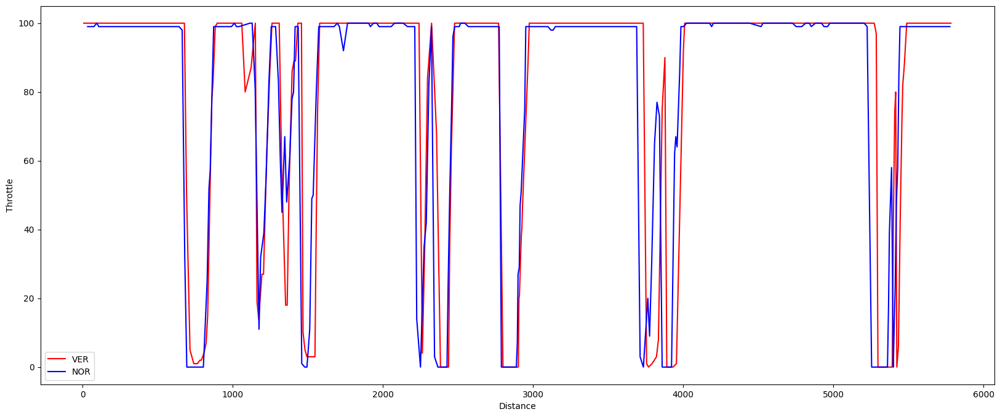

In [158]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

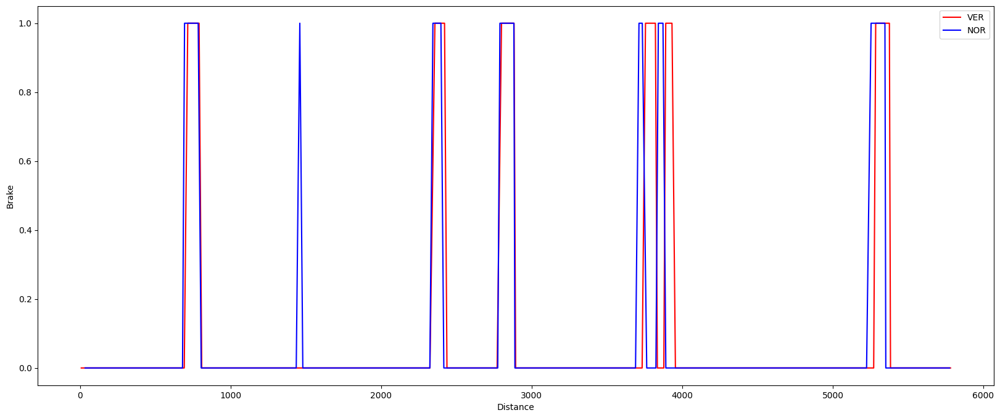

In [159]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

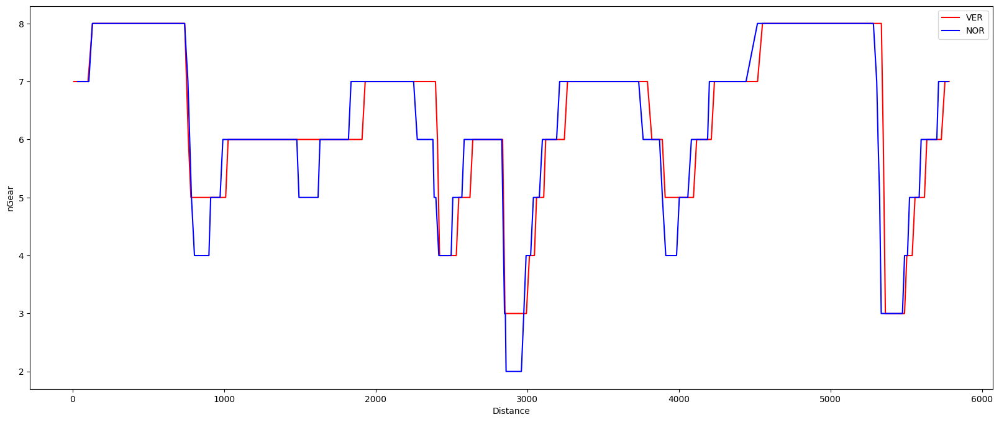

In [160]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Race
### Obtain setup

In [87]:
race = libraryDataF1.obtain_information('laps',session_key=10006)
stintInformation = libraryDataF1.obtain_information('stints',session_key=10006)
drivers = libraryDataF1.obtain_information('drivers',session_key=10006)
libraryDataF1.obtain_drivers_colours(drivers)

In [88]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)

In [89]:
raceLaps = race.query("is_pit_out_lap == False")
jointables = pd.merge(raceLaps,stintsDataFrame,on=['lap_number','driver_number'])

### Mean pace with the different compound used on the session

In [90]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,92.509921
HARD,92.517695
MEDIUM,93.679036


### Speed trap

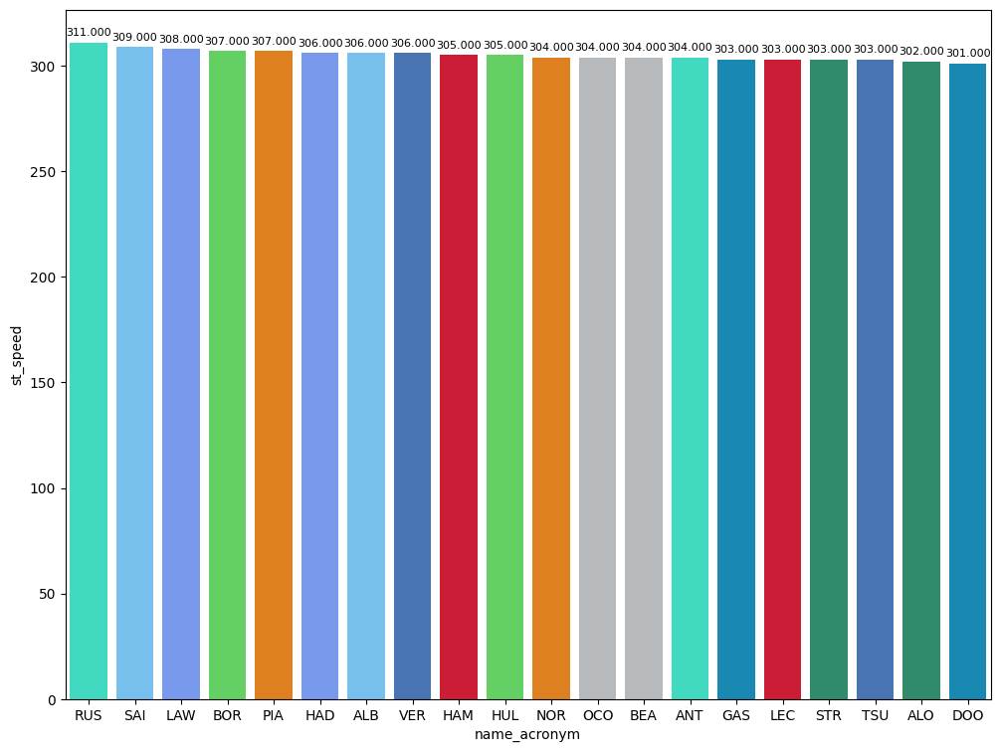

In [91]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

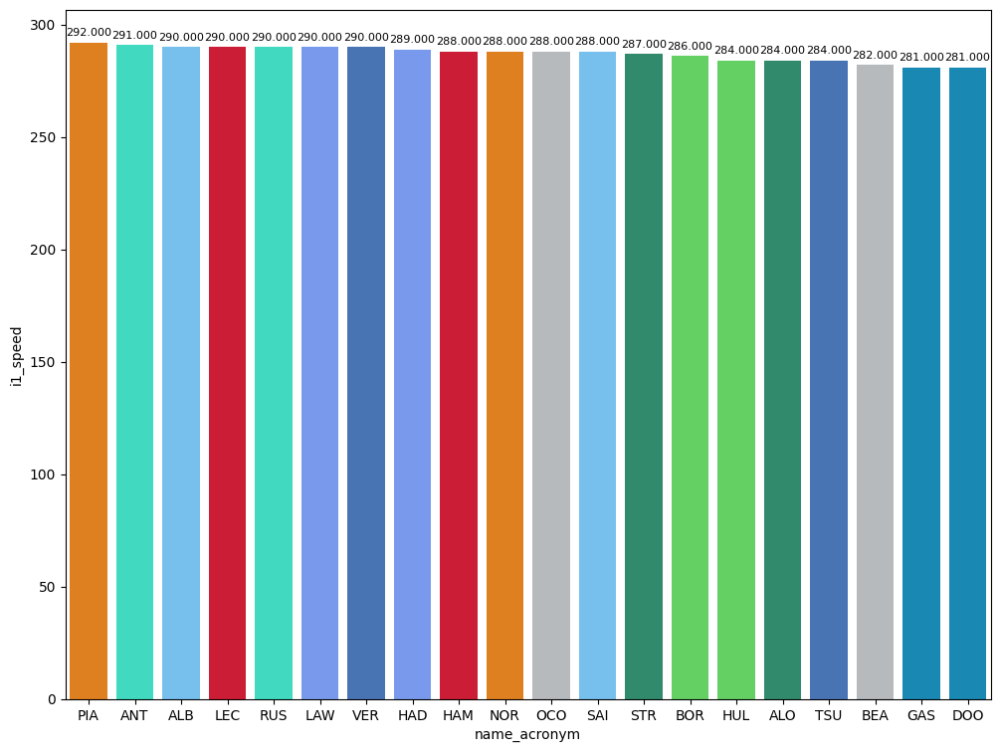

In [92]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

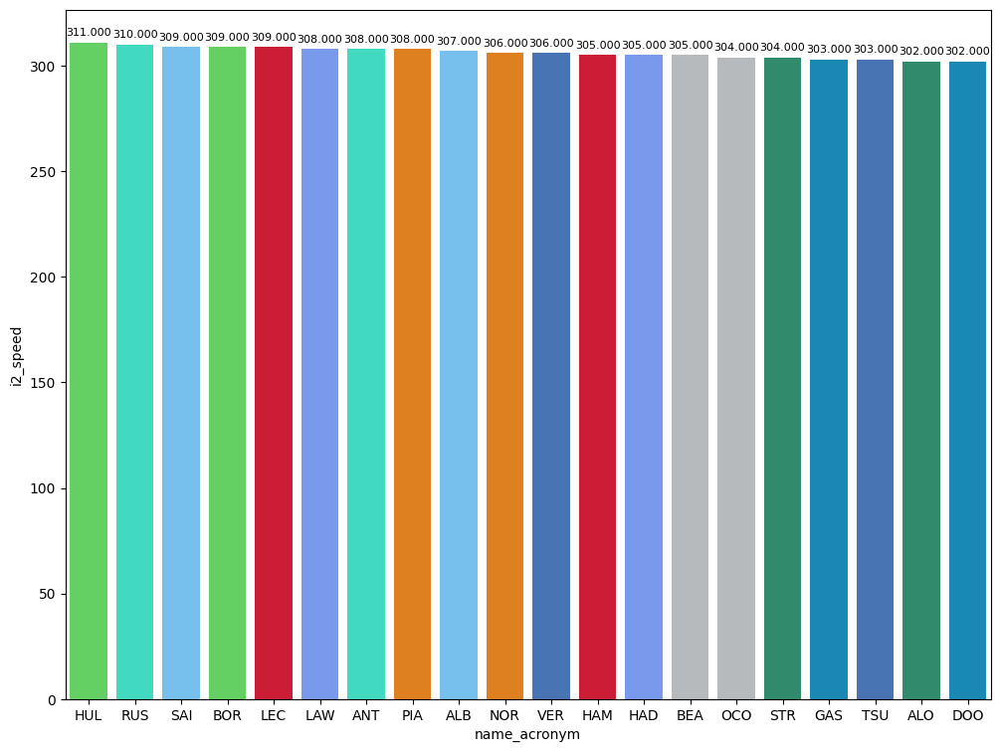

In [93]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Race pace
General explanation
Explanation per teams

In [94]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
team_name,
McLaren,92.400324
Mercedes,92.614769
Ferrari,92.825831
Red Bull Racing,92.917186
Aston Martin,93.026535
Racing Bulls,93.074434
Williams,93.204934
Alpine,93.308863
Kick Sauber,93.309352


#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending.

#### Sector 1
General explanation

In [95]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
McLaren,32.345015
Mercedes,32.416600
Haas F1 Team,32.613049
Ferrari,32.615620
Aston Martin,32.623698
Red Bull Racing,32.659508
Racing Bulls,32.679717
Kick Sauber,32.694630
Alpine,32.707549


#### Sector 2
General explanation

In [96]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
McLaren,42.007279
Ferrari,42.136380
Mercedes,42.146446
Red Bull Racing,42.163576
Aston Martin,42.202442
Racing Bulls,42.251321
Williams,42.366311
Alpine,42.406627
Kick Sauber,42.444296


#### Sector 3
General explanation

In [97]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
McLaren,18.048029
Mercedes,18.054492
Ferrari,18.073831
Red Bull Racing,18.094102
Williams,18.104787
Racing Bulls,18.143358
Kick Sauber,18.170426
Alpine,18.199706
Aston Martin,18.201930


### Long runs

In [98]:
MINIMUN_SECONDS = 90
MAXIMUM_SECONDS = 95

#### Red Bull Racing

In [99]:
stintInformation.query('driver_number == 1 or driver_number == 30')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1256,10006,1,1,1,17,MEDIUM,0
18,1256,10006,1,30,1,28,MEDIUM,0
24,1256,10006,2,1,18,48,HARD,0
39,1256,10006,2,30,29,48,SOFT,0


In [100]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
20,Max VERSTAPPEN,MEDIUM,2025-04-06T05:05:22.165000+00:00,2,33.894,42.026,18.023,93.943
40,Max VERSTAPPEN,MEDIUM,2025-04-06T05:06:56.025000+00:00,3,33.567,42.027,18.045,93.639
60,Max VERSTAPPEN,MEDIUM,2025-04-06T05:08:29.931000+00:00,4,33.570,42.140,18.034,93.744
80,Max VERSTAPPEN,MEDIUM,2025-04-06T05:10:03.510000+00:00,5,33.486,42.157,18.133,93.776
100,Max VERSTAPPEN,MEDIUM,2025-04-06T05:11:37.261000+00:00,6,33.319,42.252,18.075,93.646
120,Max VERSTAPPEN,MEDIUM,2025-04-06T05:13:11.027000+00:00,7,33.193,42.278,18.055,93.526
140,Max VERSTAPPEN,MEDIUM,2025-04-06T05:14:44.456000+00:00,8,33.130,42.336,18.070,93.536
160,Max VERSTAPPEN,MEDIUM,2025-04-06T05:16:18.050000+00:00,9,33.067,42.336,18.126,93.529
180,Max VERSTAPPEN,MEDIUM,2025-04-06T05:17:51.495000+00:00,10,32.875,42.429,18.076,93.380
200,Max VERSTAPPEN,MEDIUM,2025-04-06T05:25:39.296000+00:00,11,32.898,42.373,18.097,93.368


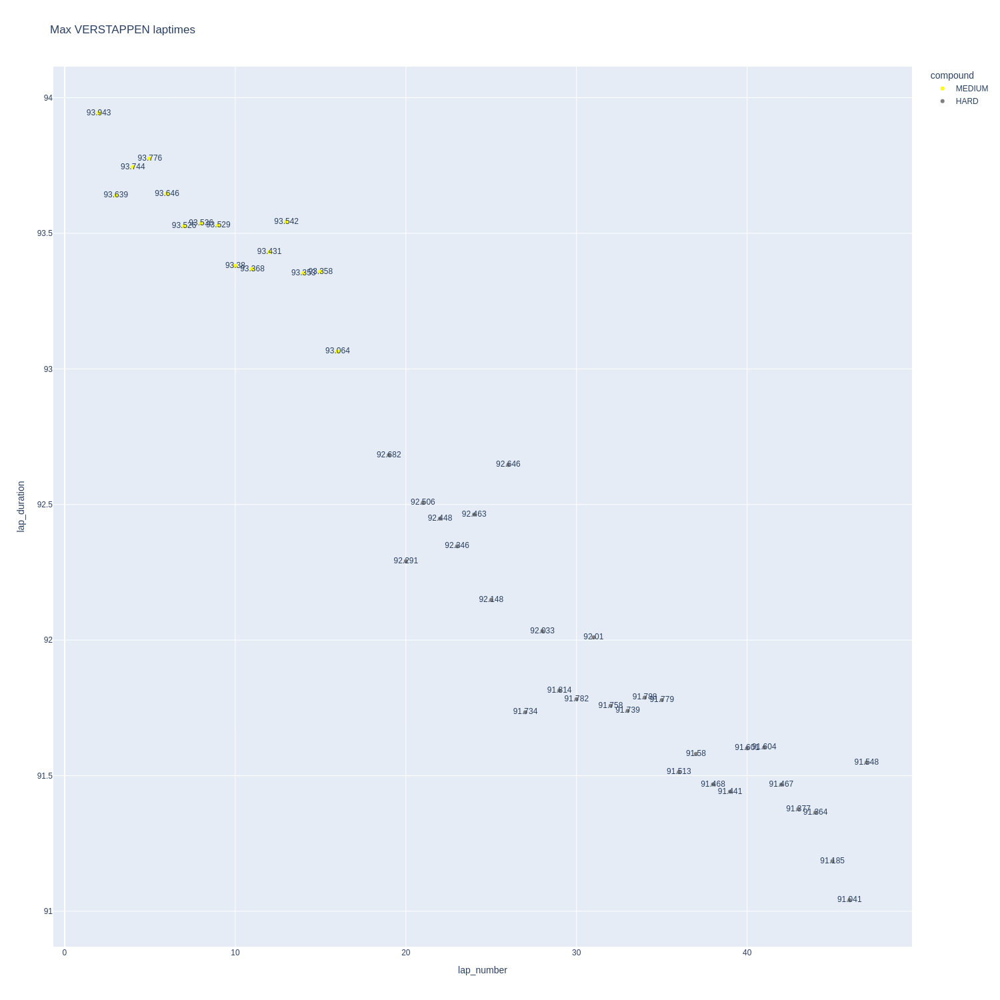

In [101]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

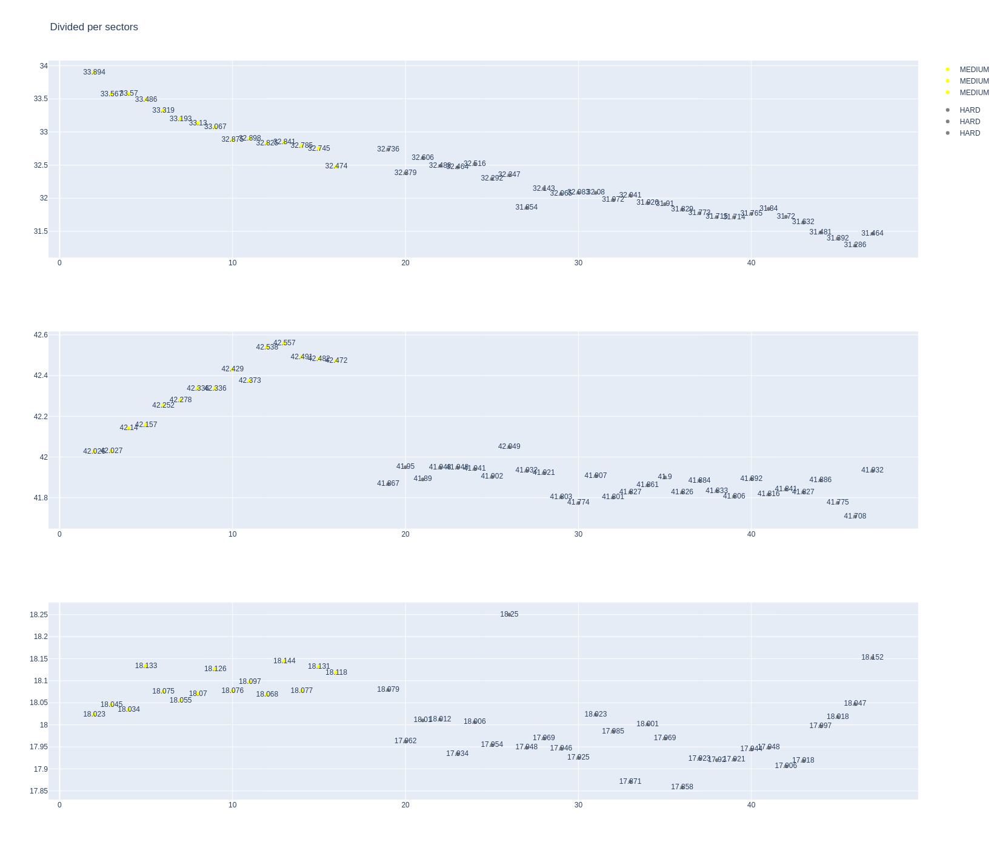

In [102]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [103]:
data = libraryDataF1.getinfolongruns(jointables,22,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
70,Yuki TSUNODA,MEDIUM,2025-04-06T05:08:41.510000+00:00,4,33.823,42.744,18.204,94.771
90,Yuki TSUNODA,MEDIUM,2025-04-06T05:10:16.213000+00:00,5,33.596,42.763,18.210,94.569
110,Yuki TSUNODA,MEDIUM,2025-04-06T05:11:50.792000+00:00,6,33.658,42.866,18.236,94.760
130,Yuki TSUNODA,MEDIUM,2025-04-06T05:13:25.527000+00:00,7,33.461,42.868,18.326,94.655
150,Yuki TSUNODA,MEDIUM,2025-04-06T05:15:00.300000+00:00,8,33.571,42.730,18.517,94.818
170,Yuki TSUNODA,MEDIUM,2025-04-06T05:16:35.082000+00:00,9,33.475,42.831,18.294,94.600
190,Yuki TSUNODA,MEDIUM,2025-04-06T05:26:02.218000+00:00,10,33.039,42.735,18.246,94.020
209,Yuki TSUNODA,MEDIUM,2025-04-06T05:27:36.250000+00:00,11,33.518,42.949,18.250,94.717
229,Yuki TSUNODA,MEDIUM,2025-04-06T05:29:11.010000+00:00,12,33.233,43.009,18.353,94.595
249,Yuki TSUNODA,MEDIUM,2025-04-06T05:30:45.651000+00:00,13,33.273,43.010,18.323,94.606


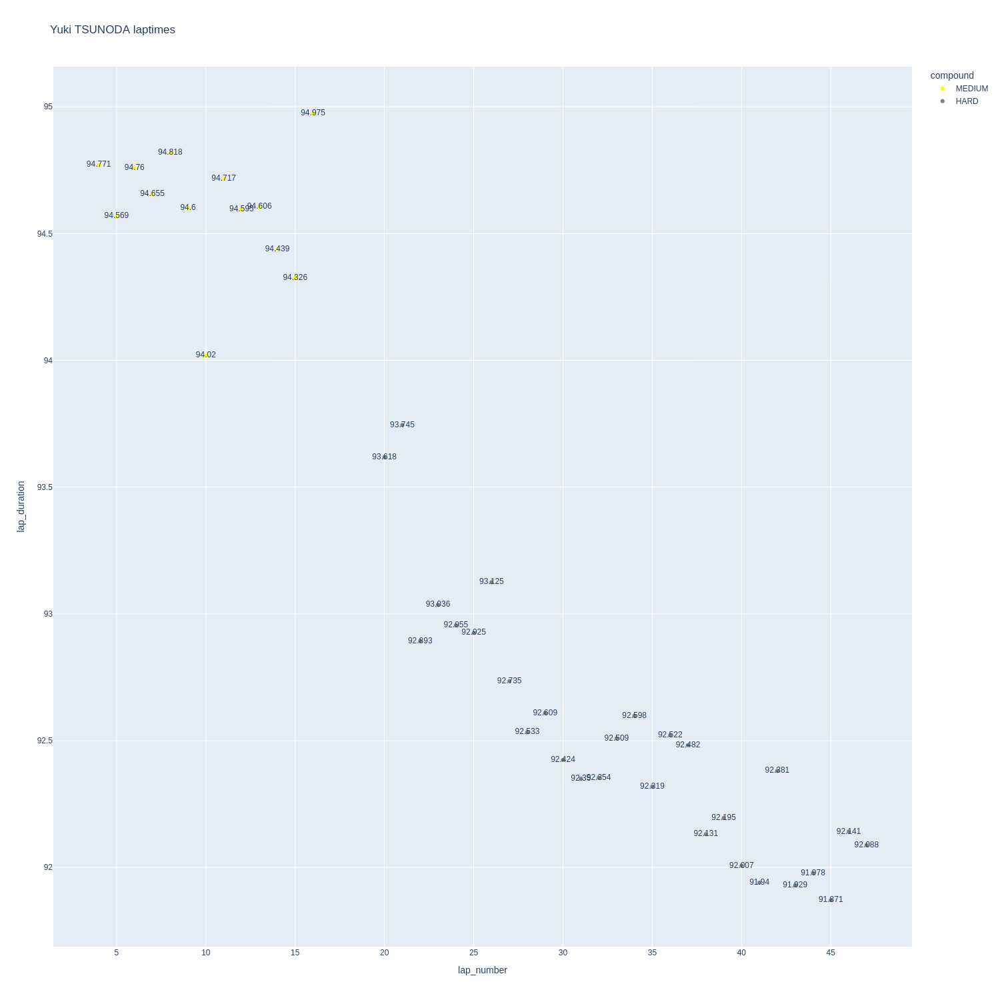

In [104]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

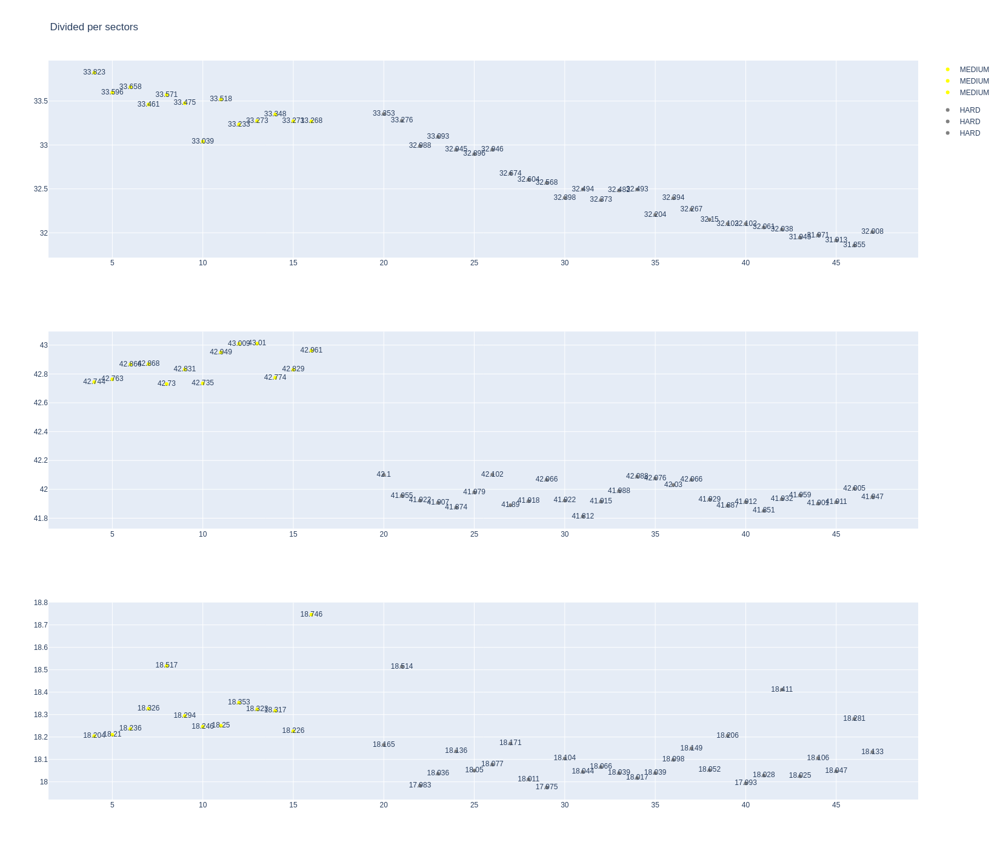

In [105]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [106]:
stintInformation.query('driver_number == 44 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
6,1256,10006,1,16,1,17,MEDIUM,0
14,1256,10006,1,44,1,25,HARD,0
26,1256,10006,2,16,18,48,HARD,0
34,1256,10006,2,44,26,48,MEDIUM,0


In [107]:
data = libraryDataF1.getinfolongruns(jointables,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
28,Charles LECLERC,MEDIUM,2025-04-06T05:05:24.868000+00:00,2,34.083,42.034,18.004,94.121
48,Charles LECLERC,MEDIUM,2025-04-06T05:06:59.119000+00:00,3,33.829,42.223,18.077,94.129
68,Charles LECLERC,MEDIUM,2025-04-06T05:08:33.197000+00:00,4,33.762,42.115,18.077,93.954
88,Charles LECLERC,MEDIUM,2025-04-06T05:10:07.026000+00:00,5,33.469,42.300,18.109,93.878
108,Charles LECLERC,MEDIUM,2025-04-06T05:11:40.964000+00:00,6,33.430,42.456,17.993,93.879
128,Charles LECLERC,MEDIUM,2025-04-06T05:13:14.980000+00:00,7,33.239,42.608,18.050,93.897
148,Charles LECLERC,MEDIUM,2025-04-06T05:14:48.800000+00:00,8,33.188,42.528,18.071,93.787
168,Charles LECLERC,MEDIUM,2025-04-06T05:16:22.504000+00:00,9,33.377,42.519,18.159,94.055
188,Charles LECLERC,MEDIUM,2025-04-06T05:17:56.573000+00:00,10,33.119,42.409,18.171,93.699
207,Charles LECLERC,MEDIUM,2025-04-06T05:25:44.921000+00:00,11,32.946,42.415,18.114,93.475


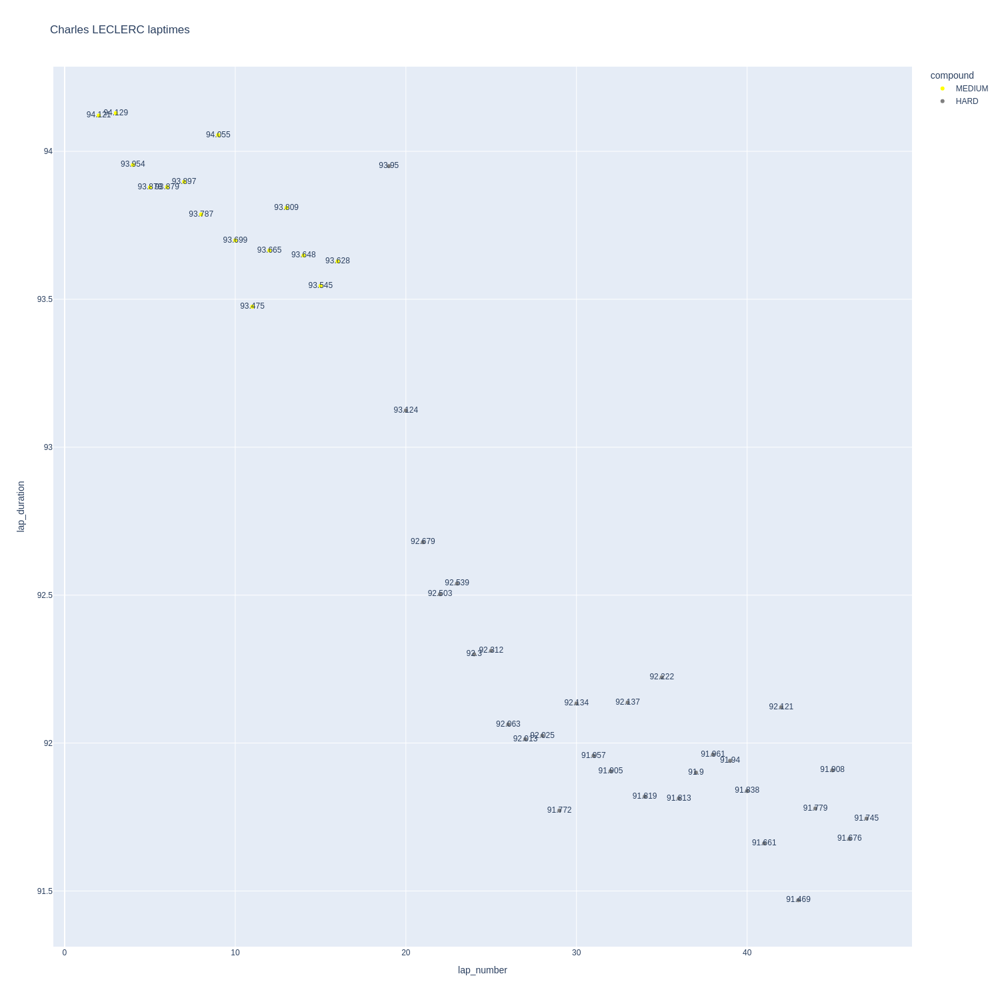

In [108]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

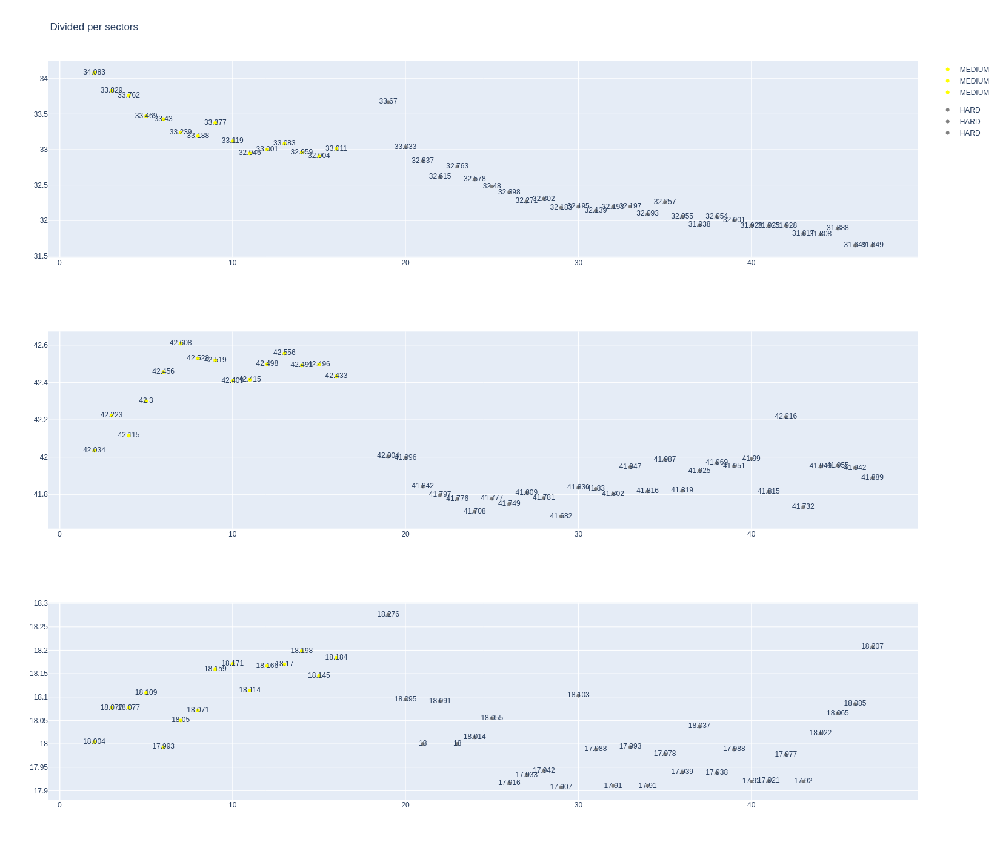

In [109]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [110]:
data = libraryDataF1.getinfolongruns(jointables,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
55,Lewis HAMILTON,HARD,2025-04-06T05:07:03.150000+00:00,3,33.769,42.301,18.184,94.254
75,Lewis HAMILTON,HARD,2025-04-06T05:08:37.275000+00:00,4,33.601,42.508,18.038,94.147
95,Lewis HAMILTON,HARD,2025-04-06T05:10:11.573000+00:00,5,33.369,42.354,18.097,93.820
115,Lewis HAMILTON,HARD,2025-04-06T05:11:45.323000+00:00,6,33.333,42.462,18.146,93.941
135,Lewis HAMILTON,HARD,2025-04-06T05:13:19.199000+00:00,7,33.496,42.456,18.187,94.139
155,Lewis HAMILTON,HARD,2025-04-06T05:14:53.378000+00:00,8,33.191,42.571,18.150,93.912
175,Lewis HAMILTON,HARD,2025-04-06T05:16:27.254000+00:00,9,33.127,42.681,18.284,93.985
195,Lewis HAMILTON,HARD,2025-04-06T05:25:50.561000+00:00,10,32.903,42.824,18.161,93.888
214,Lewis HAMILTON,HARD,2025-04-06T05:27:24.421000+00:00,11,32.982,42.869,18.217,94.068
234,Lewis HAMILTON,HARD,2025-04-06T05:28:58.431000+00:00,12,32.838,42.688,18.234,93.760


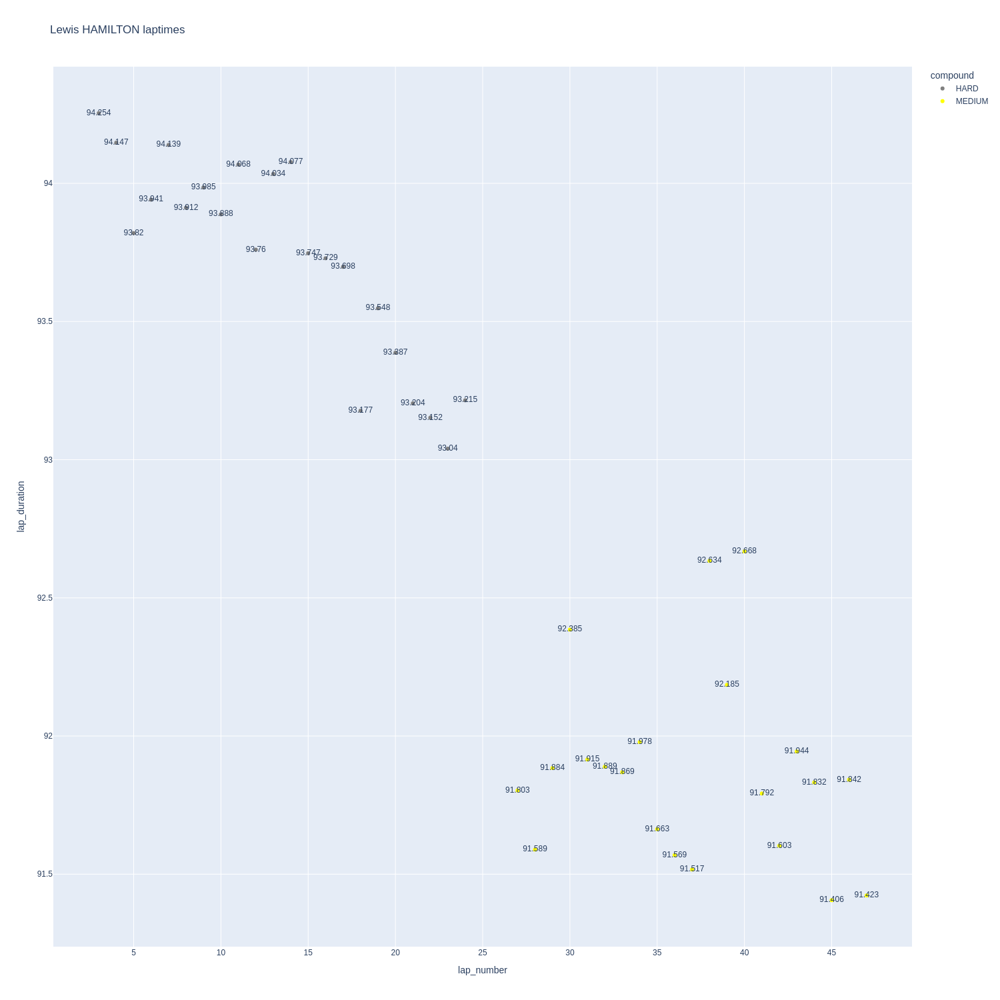

In [111]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

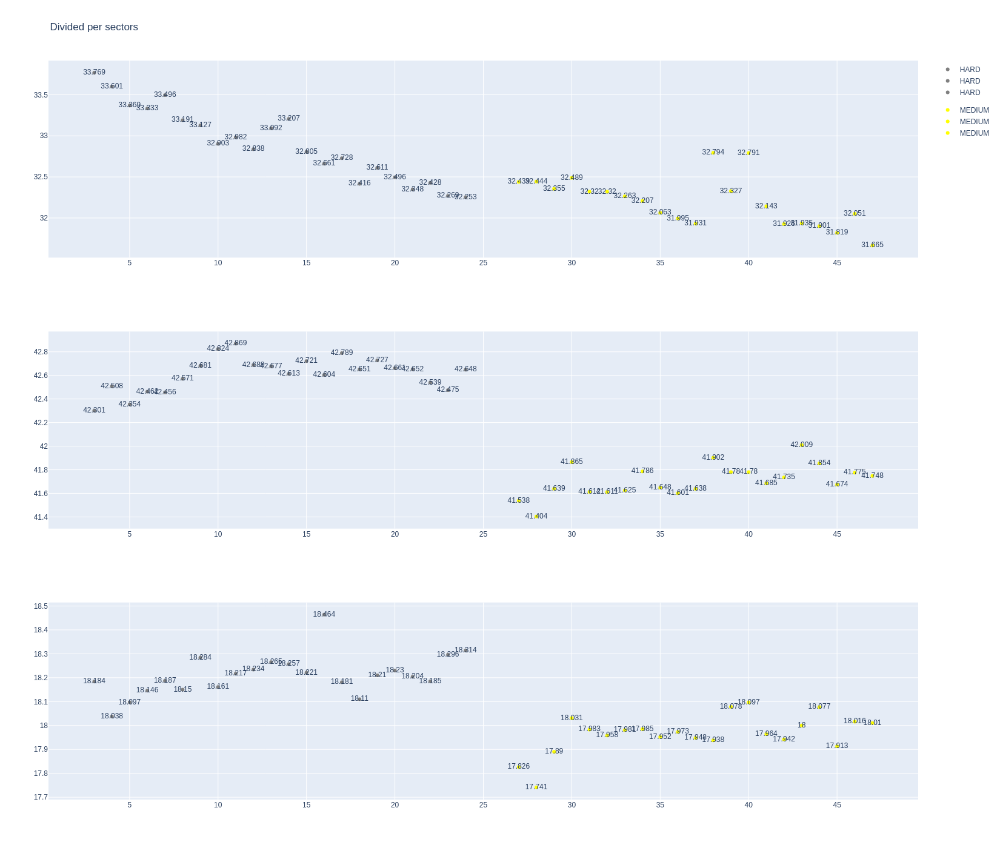

In [112]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [113]:
stintInformation.query('driver_number == 63 or driver_number == 12')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1256,10006,1,63,1,15,MEDIUM,0
16,1256,10006,1,12,1,26,MEDIUM,0
22,1256,10006,2,63,16,49,HARD,0
37,1256,10006,2,12,27,48,HARD,0


In [114]:
data = libraryDataF1.getinfolongruns(jointables,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
26,Kimi ANTONELLI,MEDIUM,2025-04-06T05:05:26.508000+00:00,2,34.135,42.288,18.108,94.531
46,Kimi ANTONELLI,MEDIUM,2025-04-06T05:07:00.962000+00:00,3,33.628,42.362,18.133,94.123
66,Kimi ANTONELLI,MEDIUM,2025-04-06T05:08:35.228000+00:00,4,33.531,42.556,18.173,94.260
86,Kimi ANTONELLI,MEDIUM,2025-04-06T05:10:09.432000+00:00,5,33.200,42.410,18.180,93.790
106,Kimi ANTONELLI,MEDIUM,2025-04-06T05:11:43.152000+00:00,6,33.288,42.570,18.199,94.057
126,Kimi ANTONELLI,MEDIUM,2025-04-06T05:13:17.230000+00:00,7,33.053,42.612,18.176,93.841
146,Kimi ANTONELLI,MEDIUM,2025-04-06T05:14:51.034000+00:00,8,33.159,42.691,18.168,94.018
166,Kimi ANTONELLI,MEDIUM,2025-04-06T05:16:25.129000+00:00,9,33.172,42.694,18.287,93.973
186,Kimi ANTONELLI,MEDIUM,2025-04-06T05:25:48.905000+00:00,10,33.006,42.571,18.197,93.774
205,Kimi ANTONELLI,MEDIUM,2025-04-06T05:27:22.703000+00:00,11,33.034,42.728,18.099,93.861


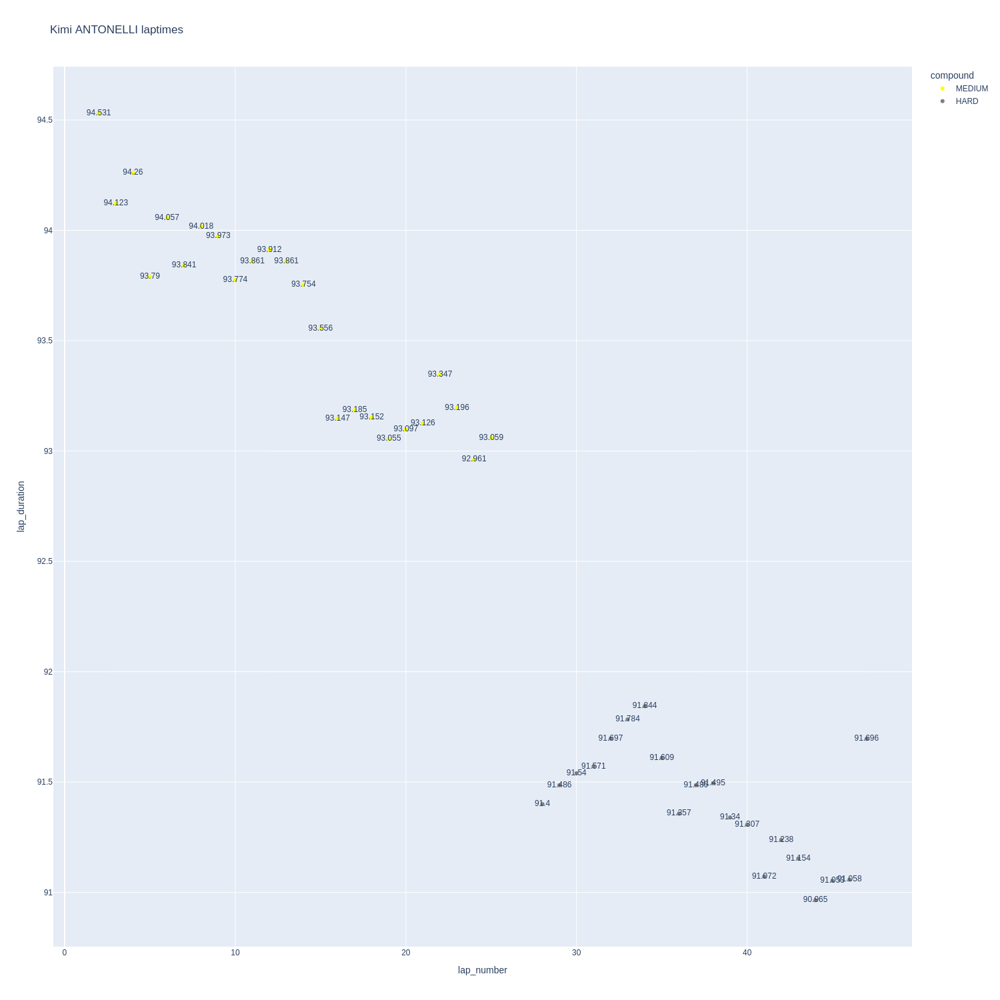

In [115]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

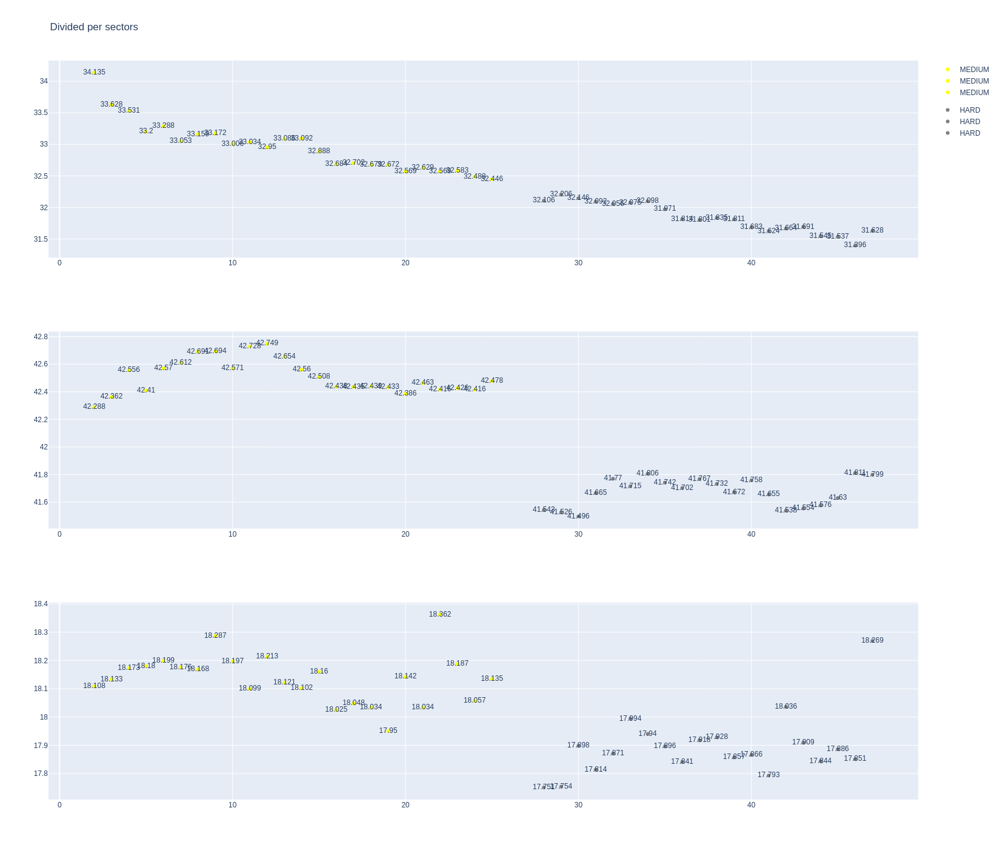

In [116]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [117]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
37,George RUSSELL,MEDIUM,2025-04-06T05:05:25.493000+00:00,2,33.985,42.155,18.051,94.191
57,George RUSSELL,MEDIUM,2025-04-06T05:06:59.744000+00:00,3,33.652,42.334,18.218,94.204
77,George RUSSELL,MEDIUM,2025-04-06T05:08:33.853000+00:00,4,33.511,42.480,18.066,94.057
97,George RUSSELL,MEDIUM,2025-04-06T05:10:08.041000+00:00,5,33.241,42.398,18.156,93.795
117,George RUSSELL,MEDIUM,2025-04-06T05:11:41.745000+00:00,6,33.263,42.485,18.174,93.922
137,George RUSSELL,MEDIUM,2025-04-06T05:13:15.558000+00:00,7,33.194,42.793,18.194,94.181
157,George RUSSELL,MEDIUM,2025-04-06T05:14:49.800000+00:00,8,32.911,42.645,18.242,93.798
177,George RUSSELL,MEDIUM,2025-04-06T05:16:23.644000+00:00,9,32.847,42.697,18.272,93.816
197,George RUSSELL,MEDIUM,2025-04-06T05:17:57.433000+00:00,10,32.727,42.719,18.212,93.658
216,George RUSSELL,MEDIUM,2025-04-06T05:25:46.327000+00:00,11,32.857,42.615,18.235,93.707


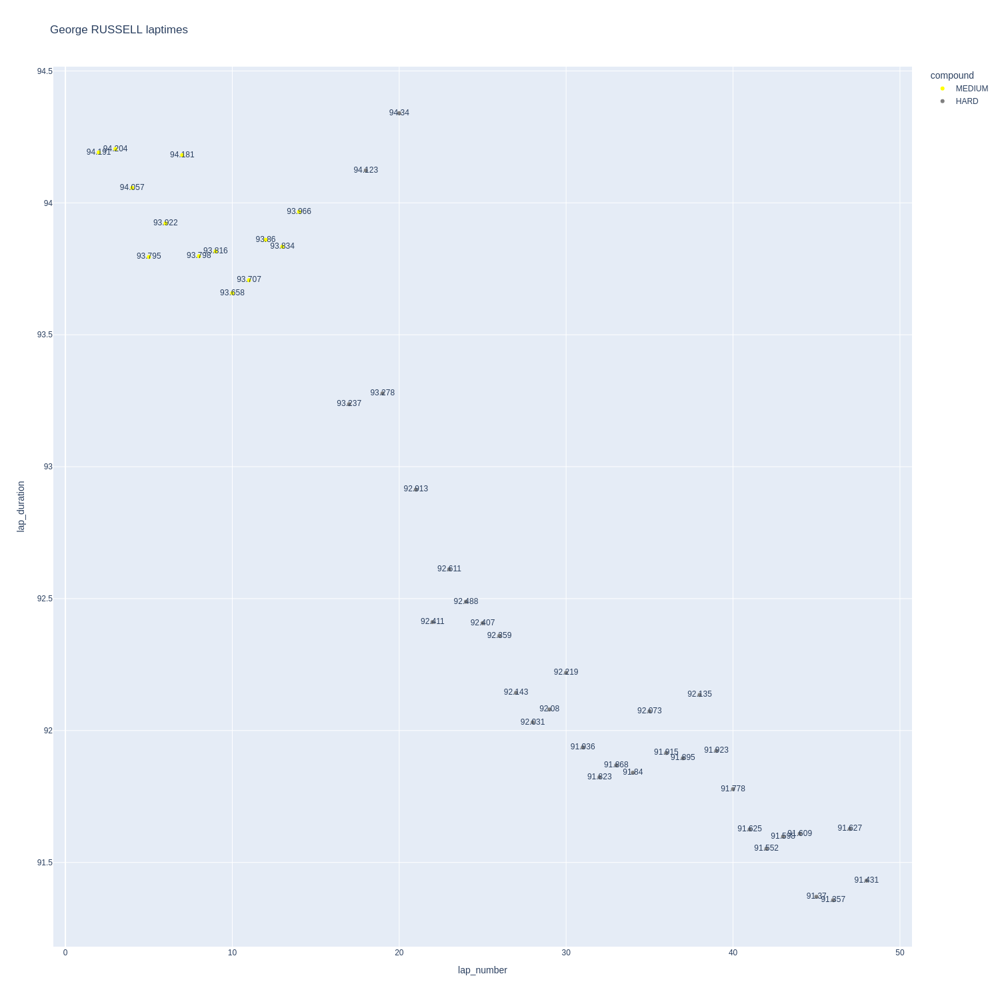

In [118]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

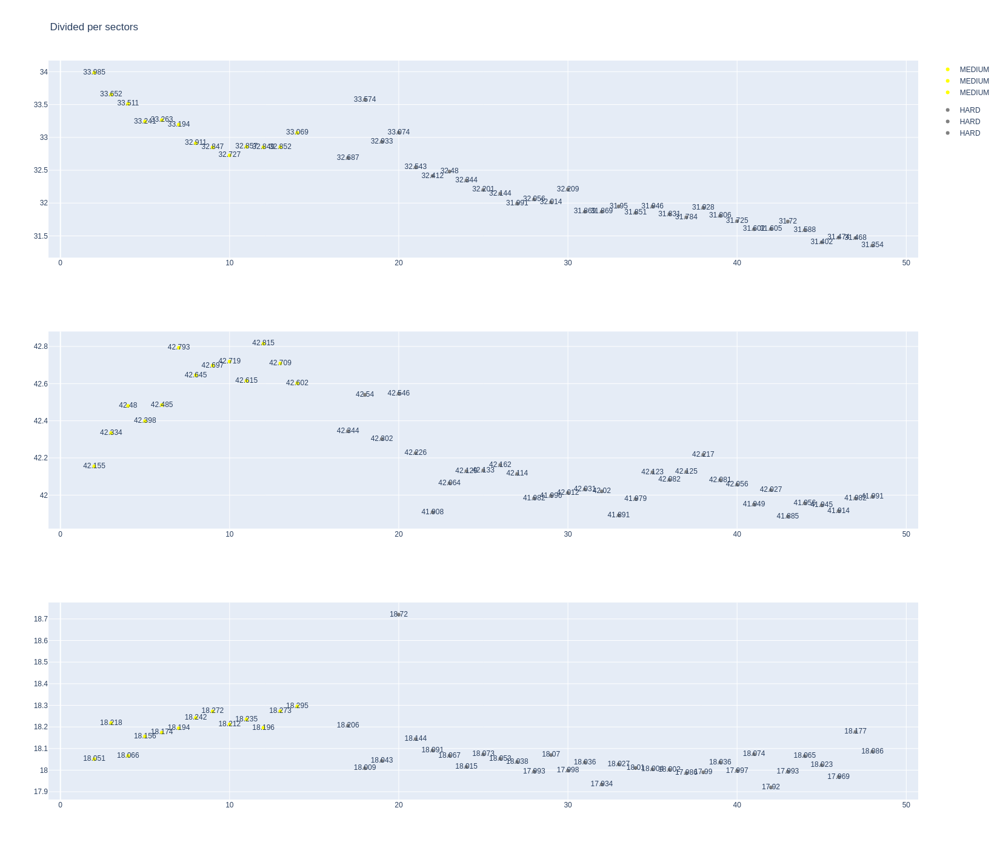

In [119]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [120]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1256,10006,1,81,1,16,MEDIUM,0
5,1256,10006,1,4,1,17,MEDIUM,0
23,1256,10006,2,81,17,48,HARD,0
25,1256,10006,2,4,18,48,HARD,0


In [121]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
21,Lando NORRIS,MEDIUM,2025-04-06T05:05:23.196000+00:00,2,33.809,42.049,18.089,93.947
41,Lando NORRIS,MEDIUM,2025-04-06T05:06:57.244000+00:00,3,33.515,42.096,18.178,93.789
61,Lando NORRIS,MEDIUM,2025-04-06T05:08:30.978000+00:00,4,33.576,42.123,18.139,93.838
81,Lando NORRIS,MEDIUM,2025-04-06T05:10:04.791000+00:00,5,33.620,42.142,18.185,93.947
101,Lando NORRIS,MEDIUM,2025-04-06T05:11:38.839000+00:00,6,33.573,42.304,18.059,93.936
121,Lando NORRIS,MEDIUM,2025-04-06T05:13:12.715000+00:00,7,33.467,42.271,18.082,93.820
141,Lando NORRIS,MEDIUM,2025-04-06T05:14:46.597000+00:00,8,33.149,42.371,18.068,93.588
161,Lando NORRIS,MEDIUM,2025-04-06T05:16:20.066000+00:00,9,33.093,42.303,18.116,93.512
181,Lando NORRIS,MEDIUM,2025-04-06T05:17:53.651000+00:00,10,32.836,42.571,18.106,93.513
201,Lando NORRIS,MEDIUM,2025-04-06T05:25:41.358000+00:00,11,32.866,42.525,18.119,93.510


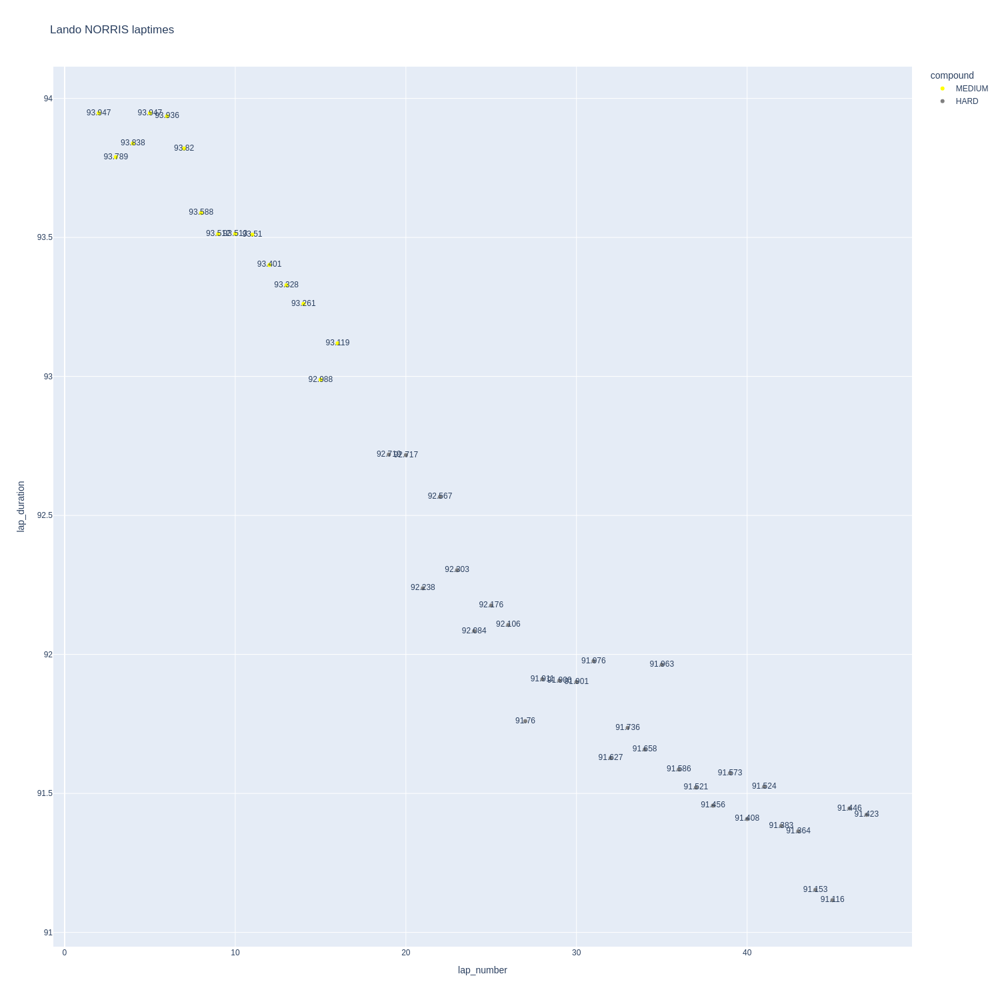

In [122]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

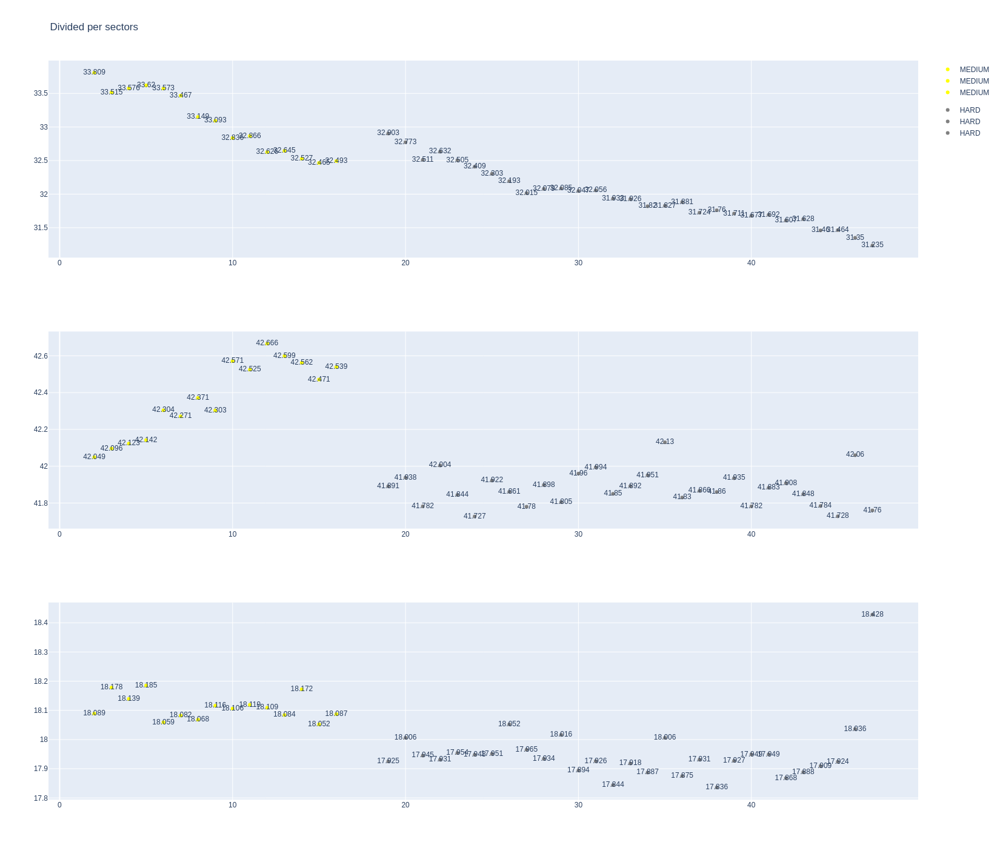

In [123]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [124]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
38,Oscar PIASTRI,MEDIUM,2025-04-06T05:05:23.930000+00:00,2,33.936,41.858,18.290,94.084
58,Oscar PIASTRI,MEDIUM,2025-04-06T05:06:58.165000+00:00,3,33.517,42.133,18.392,94.042
78,Oscar PIASTRI,MEDIUM,2025-04-06T05:08:32.213000+00:00,4,33.268,42.124,18.307,93.699
98,Oscar PIASTRI,MEDIUM,2025-04-06T05:10:05.838000+00:00,5,33.372,42.313,18.282,93.967
118,Oscar PIASTRI,MEDIUM,2025-04-06T05:11:39.745000+00:00,6,33.423,42.200,18.208,93.831
138,Oscar PIASTRI,MEDIUM,2025-04-06T05:13:13.590000+00:00,7,33.261,42.321,18.267,93.849
158,Oscar PIASTRI,MEDIUM,2025-04-06T05:14:47.456000+00:00,8,33.108,42.368,18.296,93.772
178,Oscar PIASTRI,MEDIUM,2025-04-06T05:16:21.316000+00:00,9,32.892,42.469,18.229,93.590
198,Oscar PIASTRI,MEDIUM,2025-04-06T05:17:54.948000+00:00,10,32.817,42.554,18.189,93.560
217,Oscar PIASTRI,MEDIUM,2025-04-06T05:25:42.671000+00:00,11,32.823,42.364,18.174,93.361


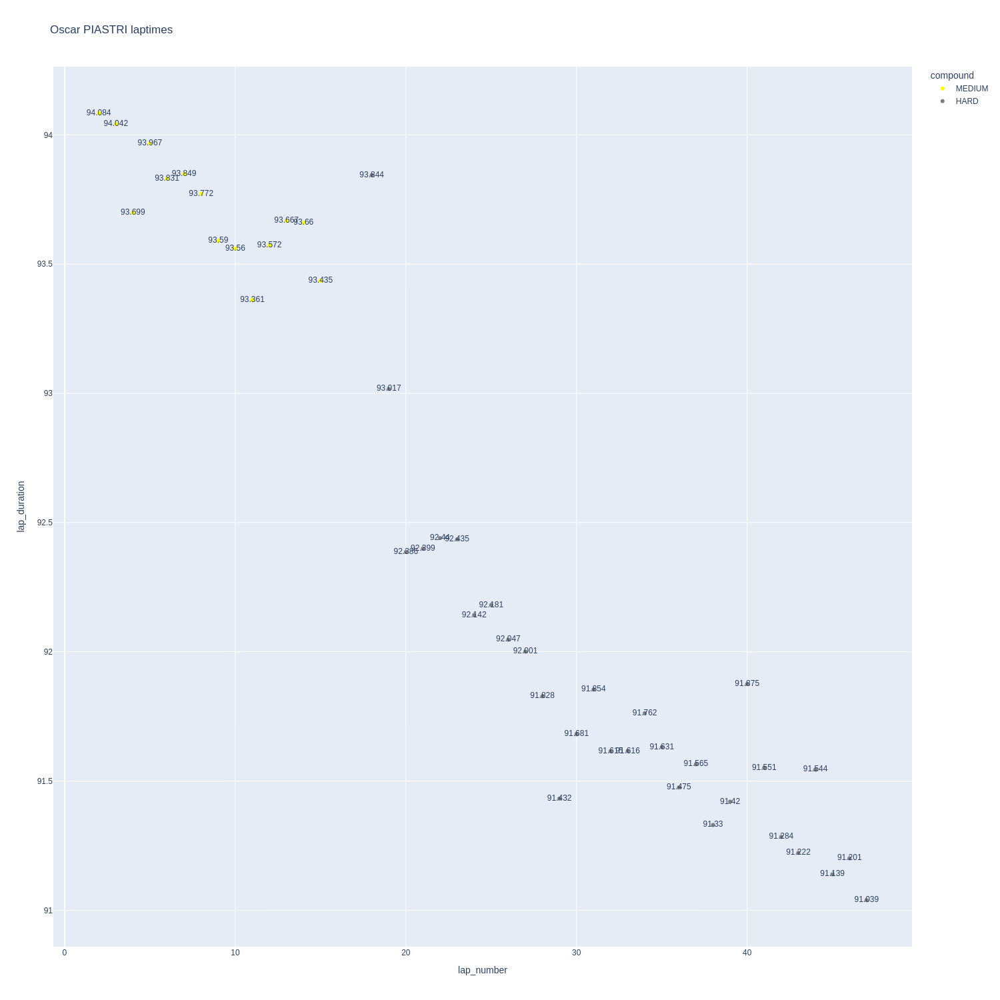

In [125]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

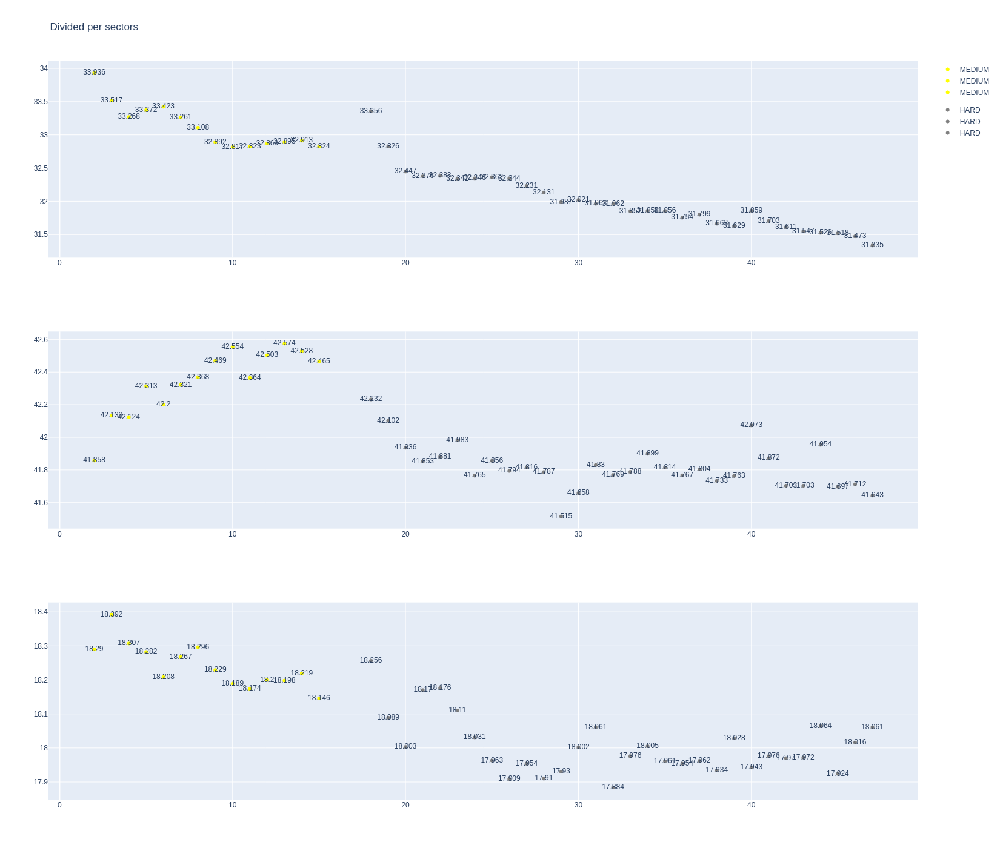

In [126]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [127]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1256,10006,1,18,1,9,SOFT,0
11,1256,10006,1,14,1,19,MEDIUM,1
20,1256,10006,2,18,10,26,None,5
31,1256,10006,2,14,20,48,HARD,1
36,1256,10006,3,18,27,47,MEDIUM,0


In [128]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
47,Fernando ALONSO,MEDIUM,2025-04-06T05:07:05.322000+00:00,3,33.874,42.654,18.233,94.761
67,Fernando ALONSO,MEDIUM,2025-04-06T05:08:39.994000+00:00,4,33.887,42.578,18.145,94.610
87,Fernando ALONSO,MEDIUM,2025-04-06T05:10:14.620000+00:00,5,33.702,42.669,18.228,94.599
107,Fernando ALONSO,MEDIUM,2025-04-06T05:11:49.198000+00:00,6,33.769,42.699,18.251,94.719
127,Fernando ALONSO,MEDIUM,2025-04-06T05:13:24.012000+00:00,7,33.425,42.762,18.210,94.397
147,Fernando ALONSO,MEDIUM,2025-04-06T05:14:58.315000+00:00,8,33.403,42.864,18.230,94.497
167,Fernando ALONSO,MEDIUM,2025-04-06T05:16:32.832000+00:00,9,33.413,42.856,18.343,94.546
187,Fernando ALONSO,MEDIUM,2025-04-06T05:25:59.733000+00:00,10,33.230,42.817,18.264,94.311
206,Fernando ALONSO,MEDIUM,2025-04-06T05:27:33.968000+00:00,11,33.237,42.877,18.342,94.456
226,Fernando ALONSO,MEDIUM,2025-04-06T05:29:08.416000+00:00,12,33.255,42.946,18.238,94.439


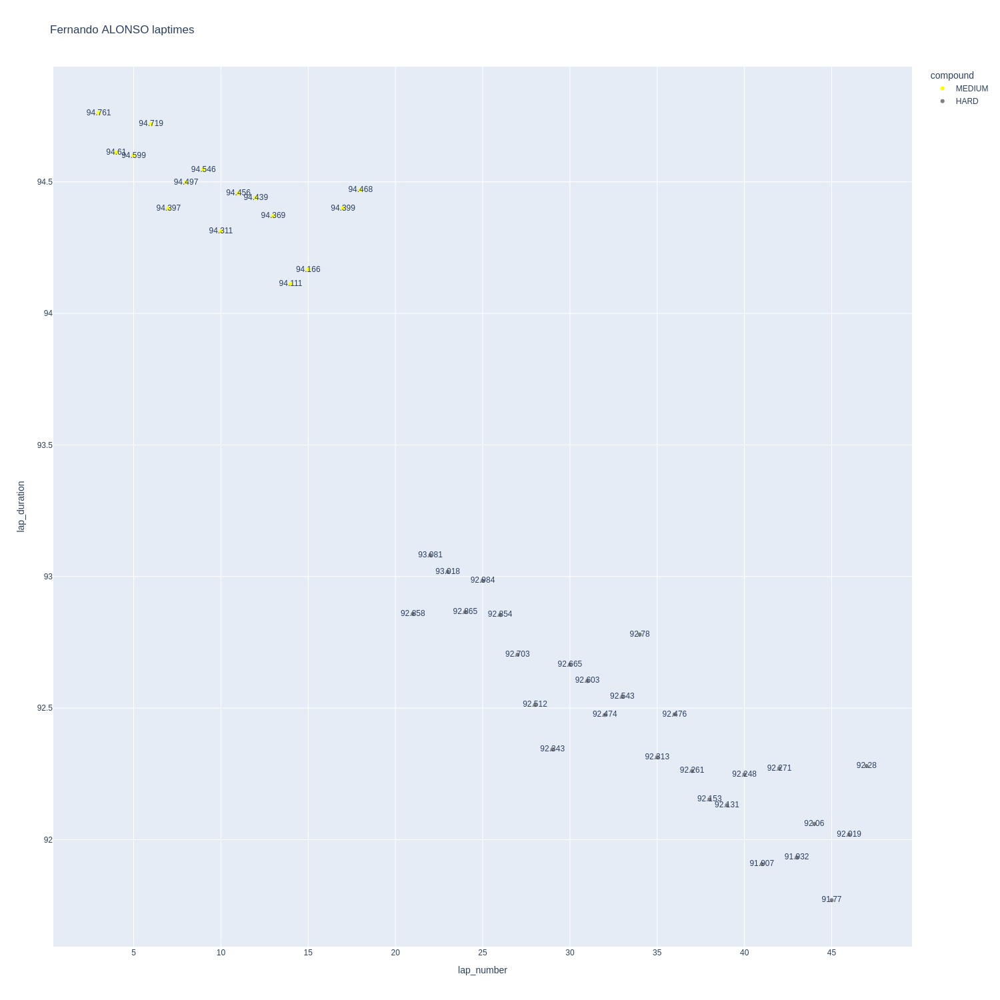

In [129]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

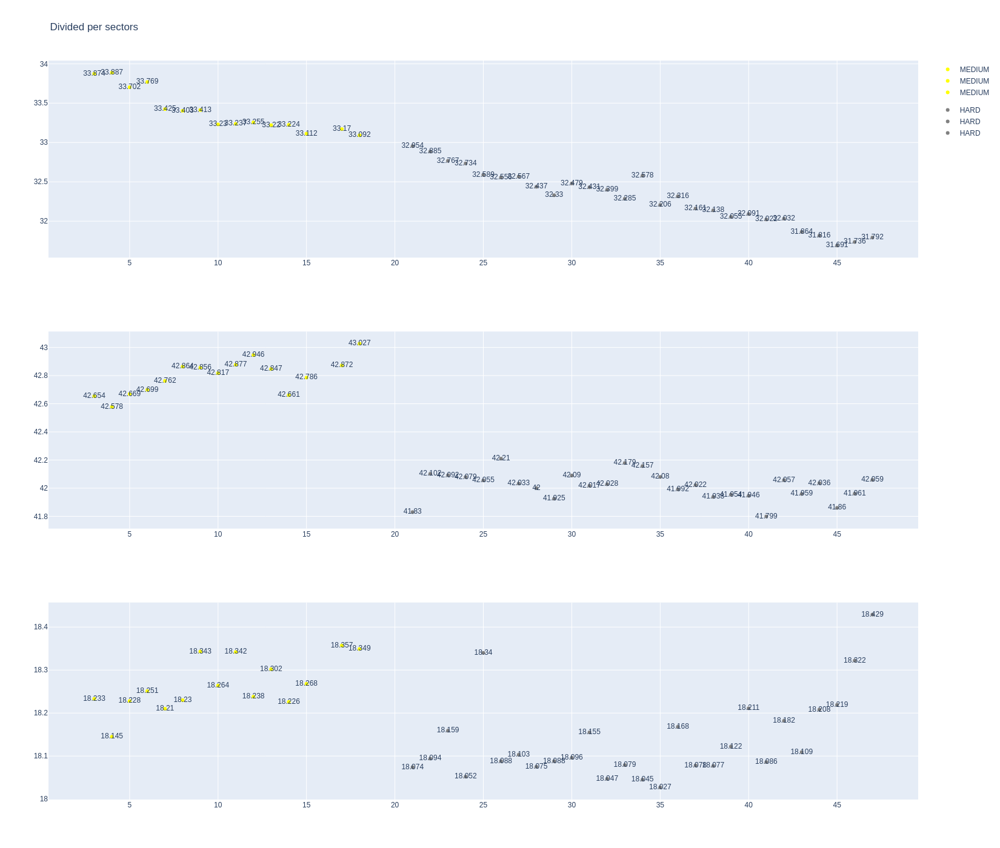

In [130]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [131]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
189,Lance STROLL,None,2025-04-06T05:25:00.789000+00:00,10,33.583,42.688,18.315,94.586
208,Lance STROLL,None,2025-04-06T05:26:35.359000+00:00,11,33.528,42.673,18.208,94.409
228,Lance STROLL,None,2025-04-06T05:28:09.972000+00:00,12,33.940,42.634,18.313,94.887
248,Lance STROLL,None,2025-04-06T05:29:44.744000+00:00,13,33.695,42.678,18.284,94.657
268,Lance STROLL,None,2025-04-06T05:31:19.401000+00:00,14,33.622,42.613,18.216,94.451
288,Lance STROLL,None,2025-04-06T05:32:53.822000+00:00,15,33.309,42.584,18.164,94.057
308,Lance STROLL,None,2025-04-06T05:34:27.979000+00:00,16,33.199,42.349,18.103,93.651
327,Lance STROLL,None,2025-04-06T05:36:01.444000+00:00,17,33.067,42.429,18.129,93.625
343,Lance STROLL,None,2025-04-06T05:37:35.191000+00:00,18,33.030,42.564,18.178,93.772
362,Lance STROLL,None,2025-04-06T05:39:09.192000+00:00,19,33.119,42.756,18.242,94.117


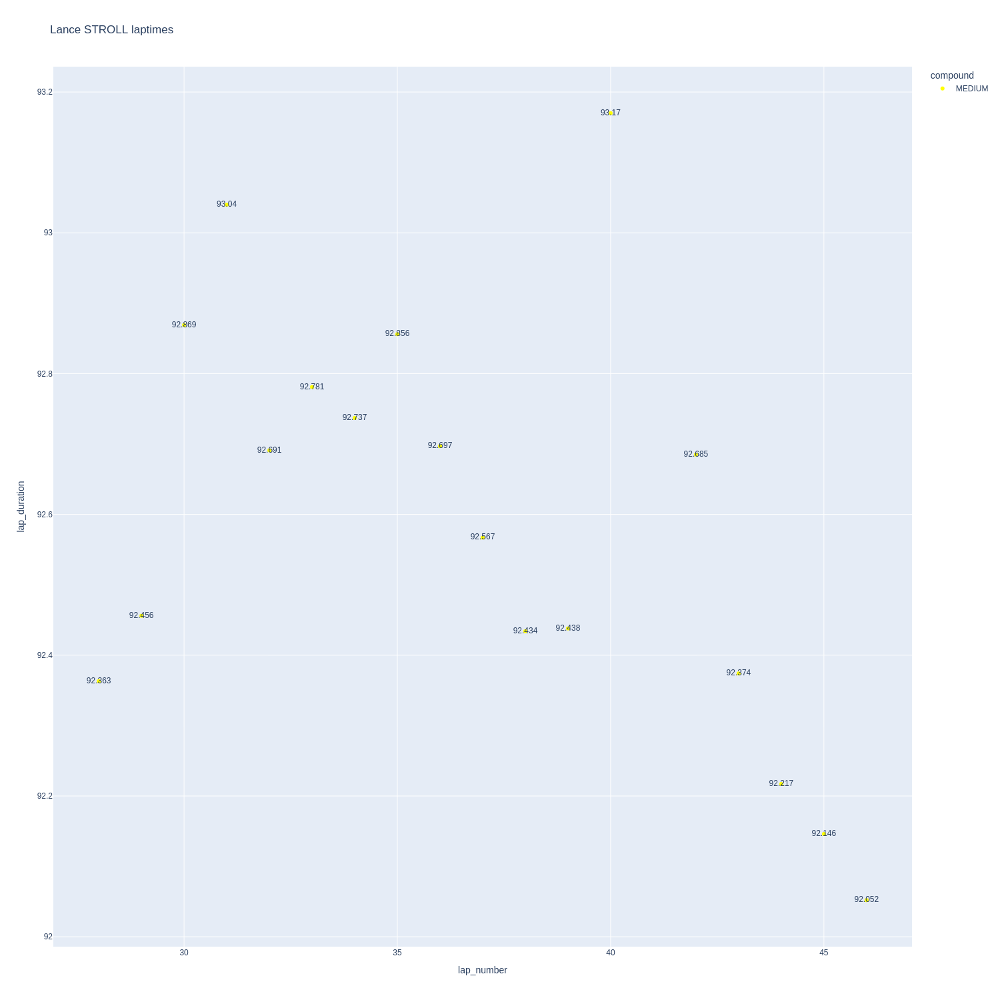

In [132]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

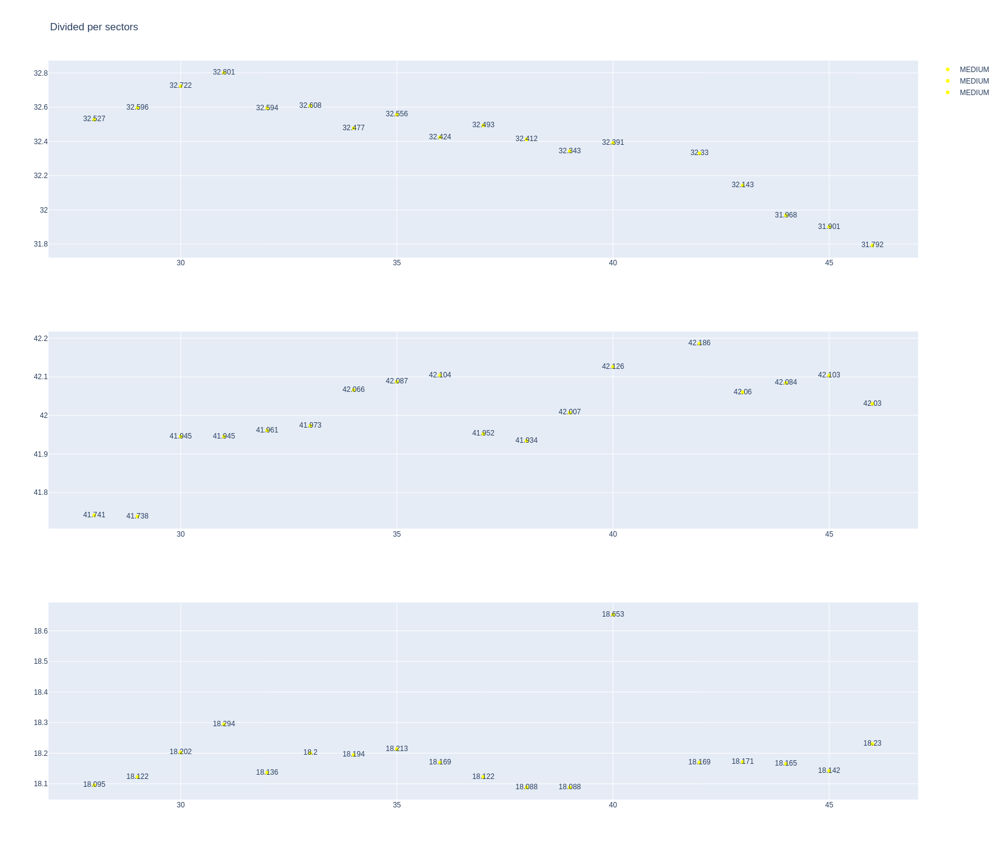

In [133]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [134]:
stintInformation.query('driver_number == 6 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
8,1256,10006,1,22,1,18,MEDIUM,0
13,1256,10006,1,6,1,20,MEDIUM,0
28,1256,10006,2,22,19,48,HARD,0
33,1256,10006,2,6,21,48,HARD,0


In [135]:
data = libraryDataF1.getinfolongruns(jointables,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
23,Isack HADJAR,MEDIUM,2025-04-06T05:05:27.383000+00:00,2,34.135,42.535,18.080,94.750
43,Isack HADJAR,MEDIUM,2025-04-06T05:07:02.322000+00:00,3,33.682,42.399,18.085,94.166
63,Isack HADJAR,MEDIUM,2025-04-06T05:08:36.447000+00:00,4,33.555,42.558,18.164,94.277
83,Isack HADJAR,MEDIUM,2025-04-06T05:10:10.604000+00:00,5,33.365,42.703,18.228,94.296
123,Isack HADJAR,MEDIUM,2025-04-06T05:13:20.433000+00:00,7,33.657,42.529,18.241,94.427
143,Isack HADJAR,MEDIUM,2025-04-06T05:14:54.940000+00:00,8,33.202,42.537,18.251,93.990
163,Isack HADJAR,MEDIUM,2025-04-06T05:16:28.816000+00:00,9,33.320,42.685,18.239,93.941
183,Isack HADJAR,MEDIUM,2025-04-06T05:25:53.218000+00:00,10,33.032,42.621,18.238,93.891
203,Isack HADJAR,MEDIUM,2025-04-06T05:27:27.015000+00:00,11,32.973,42.816,18.257,94.046
222,Isack HADJAR,MEDIUM,2025-04-06T05:29:01.119000+00:00,12,32.953,42.789,18.313,94.055


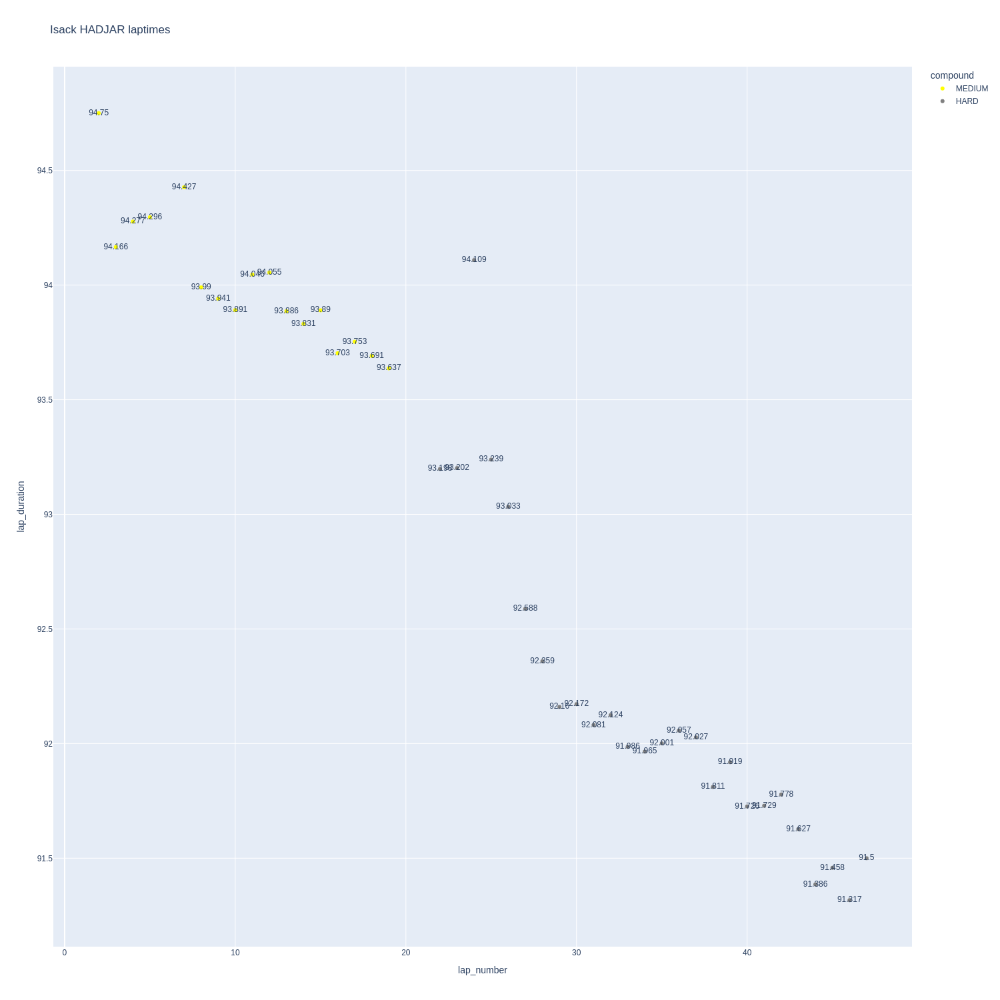

In [136]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

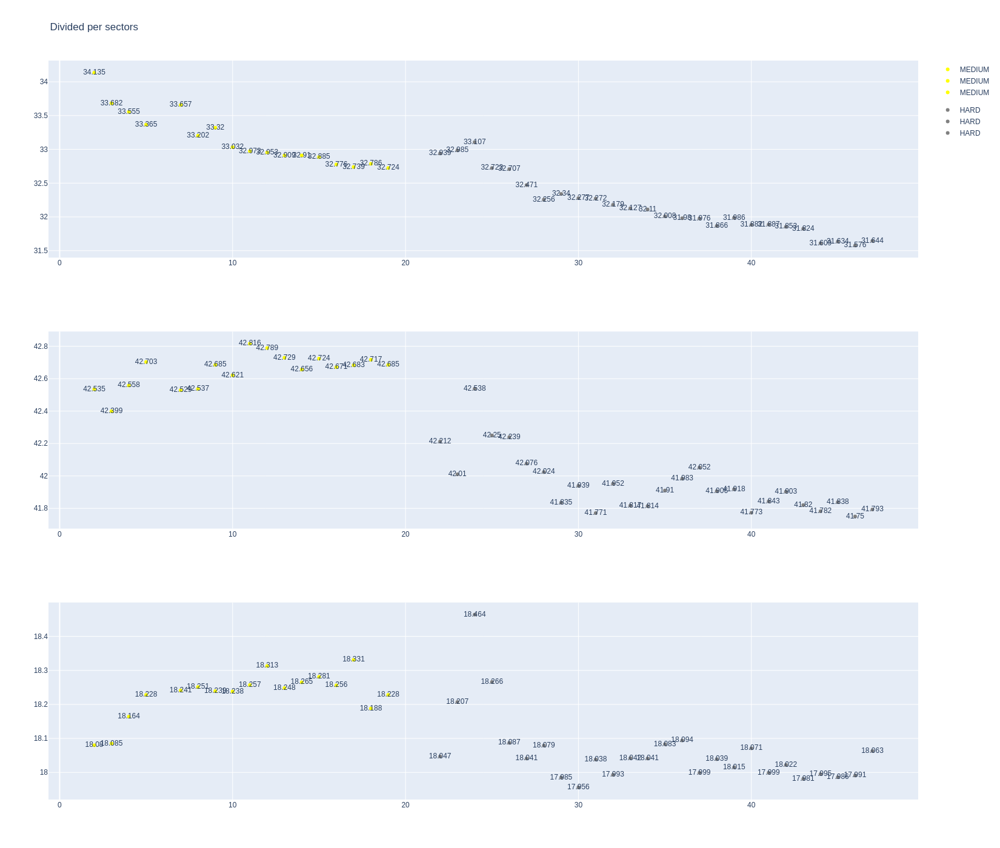

In [137]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [138]:
data = libraryDataF1.getinfolongruns(jointables,30,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
153,Liam LAWSON,MEDIUM,2025-04-06T05:15:02.925000+00:00,8,33.730,42.761,18.199,94.690
173,Liam LAWSON,MEDIUM,2025-04-06T05:16:37.566000+00:00,9,33.543,42.846,18.348,94.737
193,Liam LAWSON,MEDIUM,2025-04-06T05:26:05.890000+00:00,10,33.427,42.896,18.382,94.705
212,Liam LAWSON,MEDIUM,2025-04-06T05:27:40.609000+00:00,11,33.440,42.846,18.347,94.633
232,Liam LAWSON,MEDIUM,2025-04-06T05:29:15.213000+00:00,12,33.346,42.914,18.284,94.544
252,Liam LAWSON,MEDIUM,2025-04-06T05:30:49.729000+00:00,13,33.443,42.810,18.328,94.581
272,Liam LAWSON,MEDIUM,2025-04-06T05:32:24.276000+00:00,14,33.391,42.695,18.256,94.342
292,Liam LAWSON,MEDIUM,2025-04-06T05:33:58.682000+00:00,15,33.713,42.791,18.264,94.768
312,Liam LAWSON,MEDIUM,2025-04-06T05:35:33.506000+00:00,16,33.407,42.910,18.287,94.604
331,Liam LAWSON,MEDIUM,2025-04-06T05:37:08.097000+00:00,17,33.407,42.951,18.331,94.689


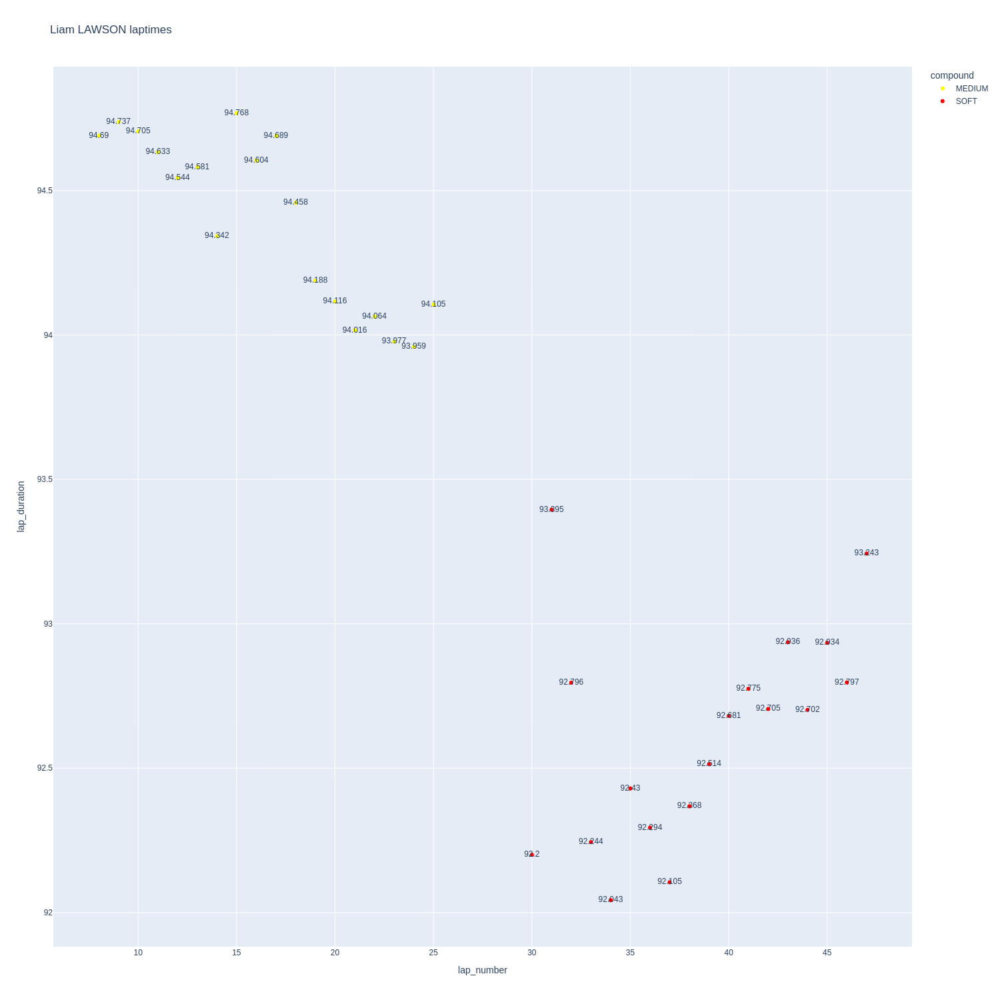

In [139]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

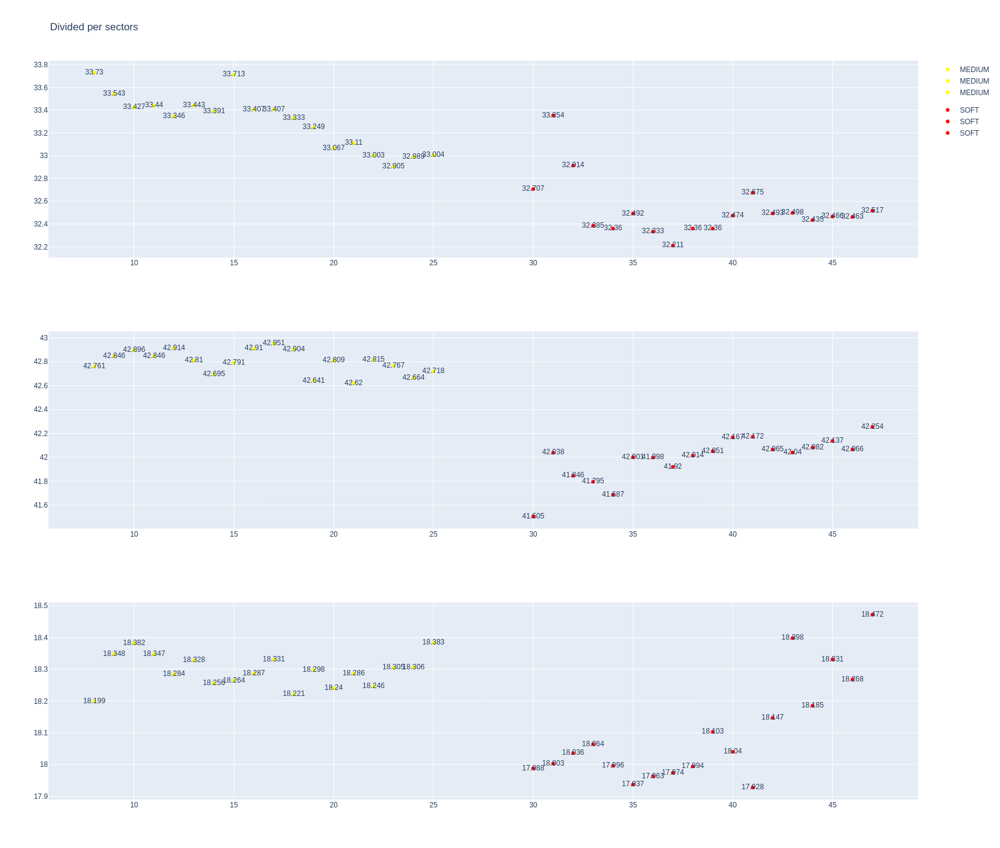

In [140]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [141]:
stintInformation.query('driver_number == 87 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1256,10006,1,87,1,18,MEDIUM,0
17,1256,10006,1,31,1,27,HARD,1
29,1256,10006,2,87,19,48,HARD,1
38,1256,10006,2,31,28,47,MEDIUM,0


In [142]:
data = libraryDataF1.getinfolongruns(jointables,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
174,Esteban OCON,HARD,2025-04-06T05:16:40.519000+00:00,9,33.325,43.149,18.346,94.820
194,Esteban OCON,HARD,2025-04-06T05:26:09.515000+00:00,10,33.207,43.174,18.340,94.721
213,Esteban OCON,HARD,2025-04-06T05:27:44.100000+00:00,11,33.349,43.145,18.447,94.941
233,Esteban OCON,HARD,2025-04-06T05:29:19.135000+00:00,12,33.219,43.036,18.458,94.713
253,Esteban OCON,HARD,2025-04-06T05:30:53.886000+00:00,13,33.363,42.997,18.408,94.768
273,Esteban OCON,HARD,2025-04-06T05:32:28.620000+00:00,14,33.156,42.988,18.356,94.500
293,Esteban OCON,HARD,2025-04-06T05:34:03.057000+00:00,15,32.995,42.976,18.392,94.363
313,Esteban OCON,HARD,2025-04-06T05:35:37.444000+00:00,16,32.930,42.835,18.443,94.208
332,Esteban OCON,HARD,2025-04-06T05:37:11.676000+00:00,17,33.006,42.910,18.440,94.356
347,Esteban OCON,HARD,2025-04-06T05:38:45.895000+00:00,18,32.854,42.962,18.302,94.118


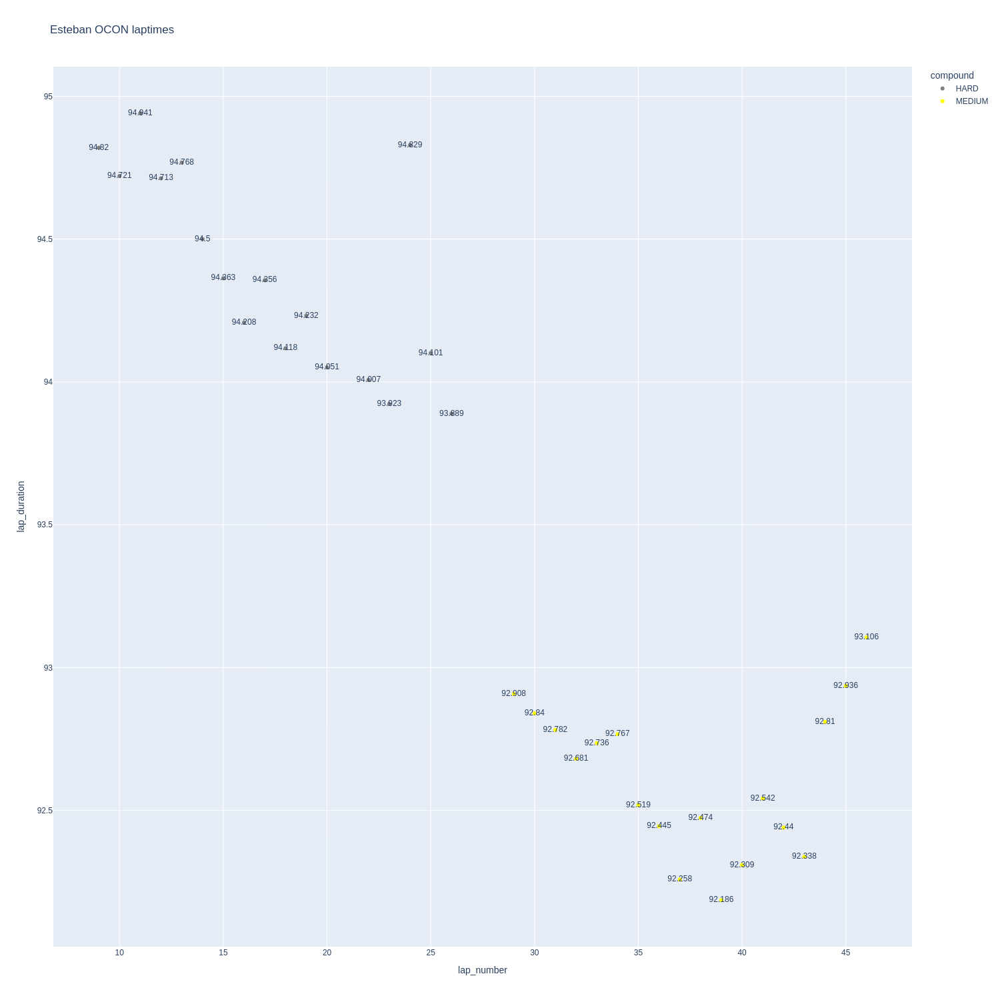

In [143]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

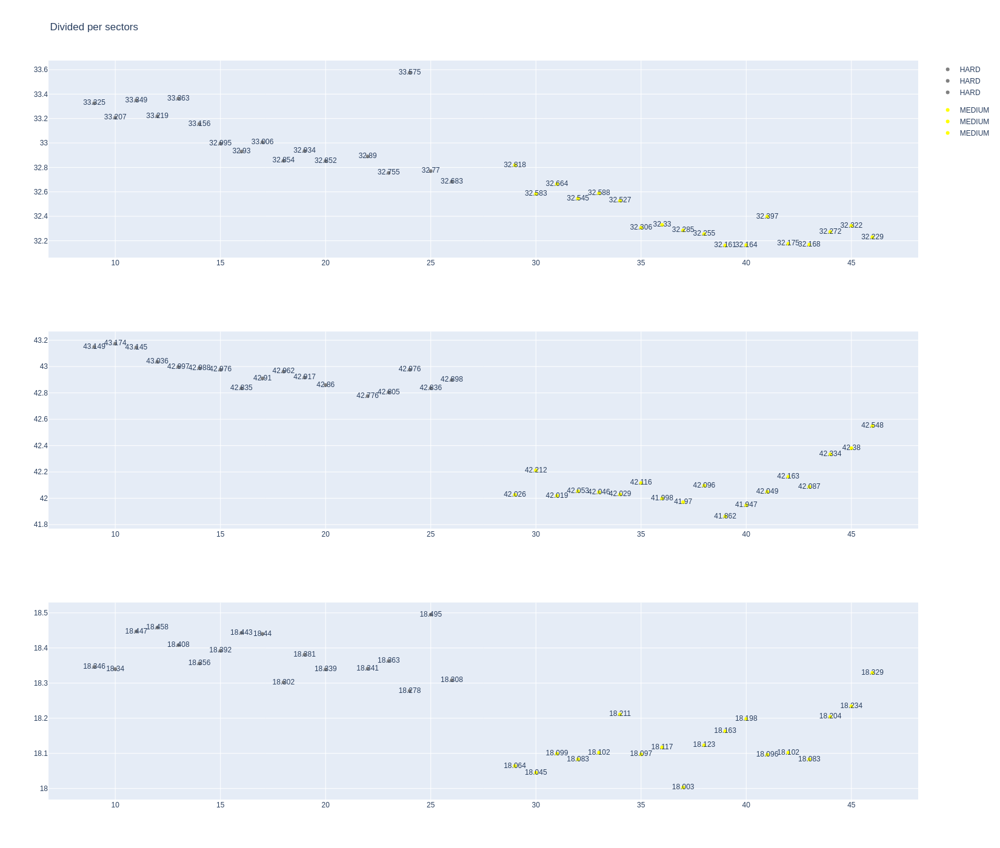

In [144]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [145]:
data = libraryDataF1.getinfolongruns(jointables,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
59,Oliver BEARMAN,MEDIUM,2025-04-06T05:07:04.259000+00:00,3,33.728,42.585,18.122,94.435
79,Oliver BEARMAN,MEDIUM,2025-04-06T05:08:38.791000+00:00,4,33.651,42.618,18.197,94.466
99,Oliver BEARMAN,MEDIUM,2025-04-06T05:10:13.260000+00:00,5,33.360,42.626,18.140,94.126
119,Oliver BEARMAN,MEDIUM,2025-04-06T05:11:47.355000+00:00,6,33.536,42.883,18.116,94.535
139,Oliver BEARMAN,MEDIUM,2025-04-06T05:13:21.933000+00:00,7,33.638,42.928,18.185,94.751
159,Oliver BEARMAN,MEDIUM,2025-04-06T05:14:56.550000+00:00,8,33.408,43.093,18.230,94.731
179,Oliver BEARMAN,MEDIUM,2025-04-06T05:16:31.269000+00:00,9,33.407,42.914,18.353,94.327
199,Oliver BEARMAN,MEDIUM,2025-04-06T05:25:57.186000+00:00,10,32.827,42.854,18.353,94.034
218,Oliver BEARMAN,MEDIUM,2025-04-06T05:27:31.171000+00:00,11,33.012,43.085,18.328,94.425
238,Oliver BEARMAN,MEDIUM,2025-04-06T05:29:05.666000+00:00,12,33.084,43.031,18.322,94.437


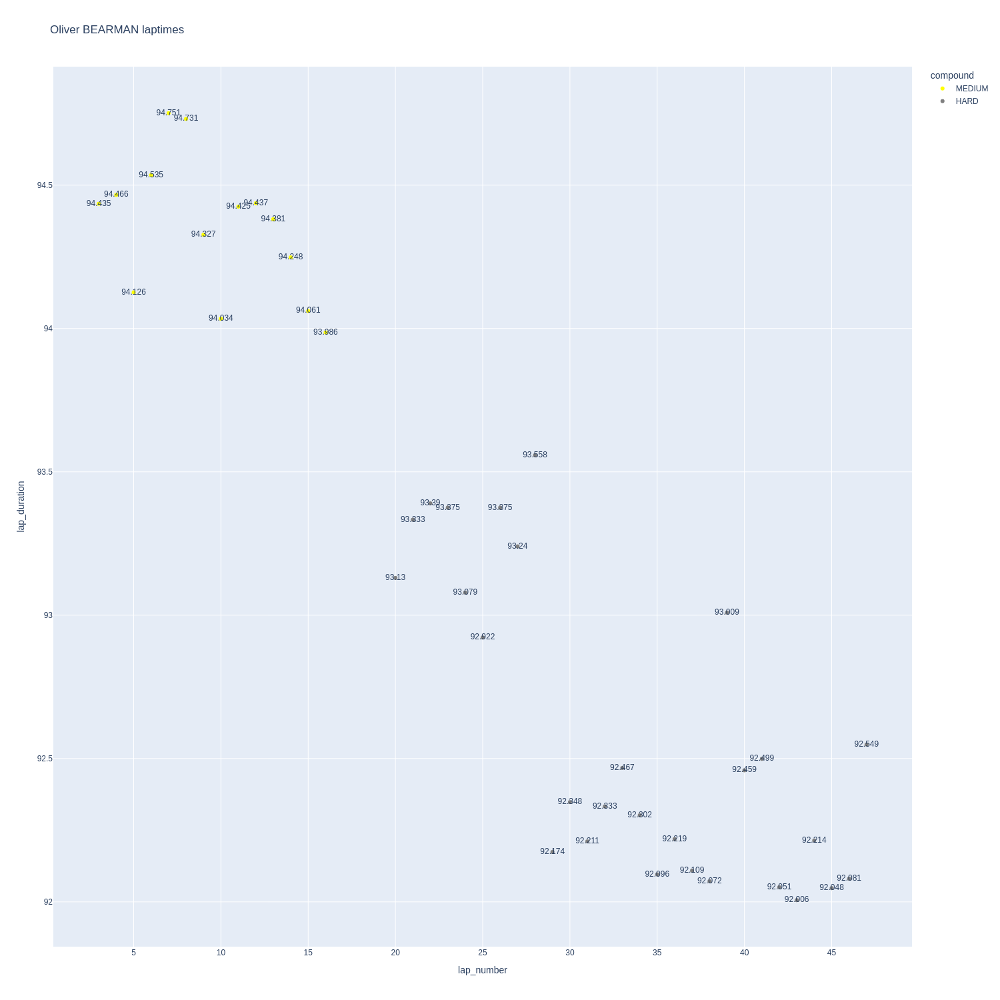

In [146]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

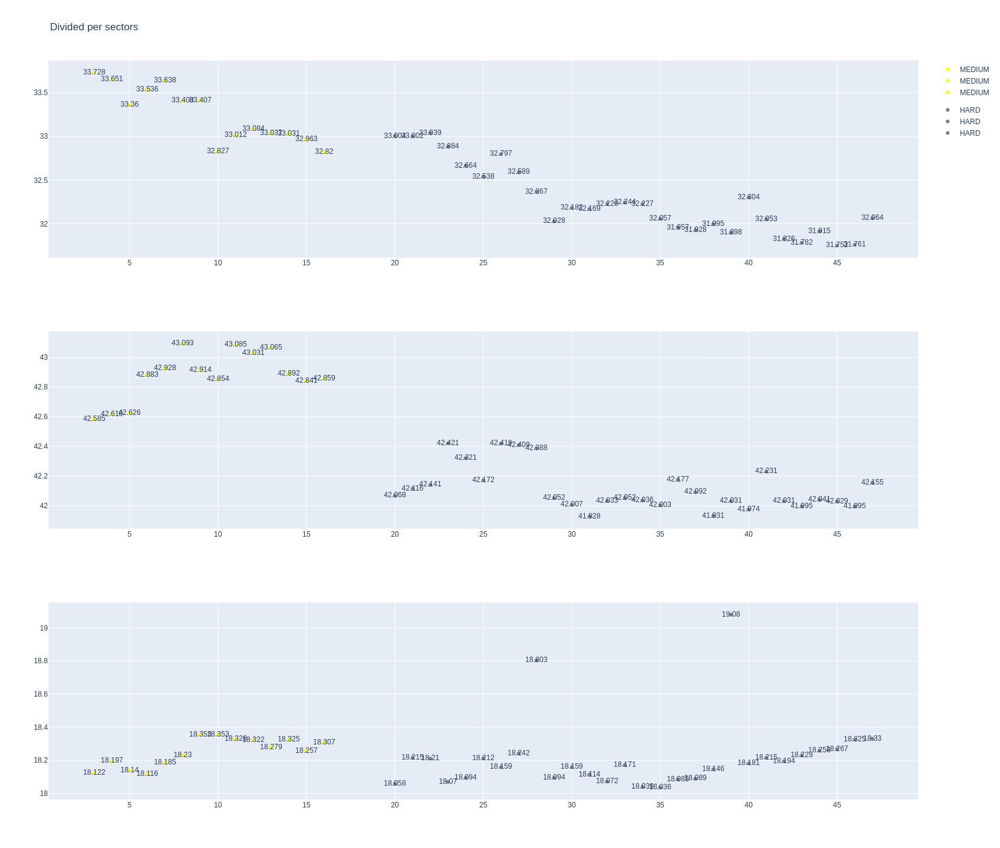

In [147]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [148]:
stintInformation.query('driver_number == 10 or driver_number == 7')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1256,10006,1,7,1,10,SOFT,0
10,1256,10006,1,10,1,19,MEDIUM,0
21,1256,10006,2,7,11,48,HARD,0
30,1256,10006,2,10,20,48,HARD,0


In [149]:
data =libraryDataF1.getinfolongruns(jointables,7,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
124,Jack DOOHAN,SOFT,2025-04-06T05:13:31.496000+00:00,7,33.591,42.973,18.328,94.892
164,Jack DOOHAN,SOFT,2025-04-06T05:16:41.457000+00:00,9,33.483,43.074,18.372,94.929
223,Jack DOOHAN,HARD,2025-04-06T05:29:43.447000+00:00,12,33.297,42.314,18.188,93.799
243,Jack DOOHAN,HARD,2025-04-06T05:31:17.276000+00:00,13,33.171,42.188,18.243,93.602
263,Jack DOOHAN,HARD,2025-04-06T05:32:50.885000+00:00,14,33.368,42.398,18.215,93.981
283,Jack DOOHAN,HARD,2025-04-06T05:34:24.917000+00:00,15,33.098,42.319,18.283,93.700
303,Jack DOOHAN,HARD,2025-04-06T05:35:58.600000+00:00,16,33.125,42.422,18.264,93.811
322,Jack DOOHAN,HARD,2025-04-06T05:37:32.379000+00:00,17,32.945,42.322,18.255,93.522
339,Jack DOOHAN,HARD,2025-04-06T05:39:05.927000+00:00,18,32.883,42.384,18.217,93.484
357,Jack DOOHAN,HARD,2025-04-06T05:40:39.334000+00:00,19,32.932,42.294,18.141,93.367


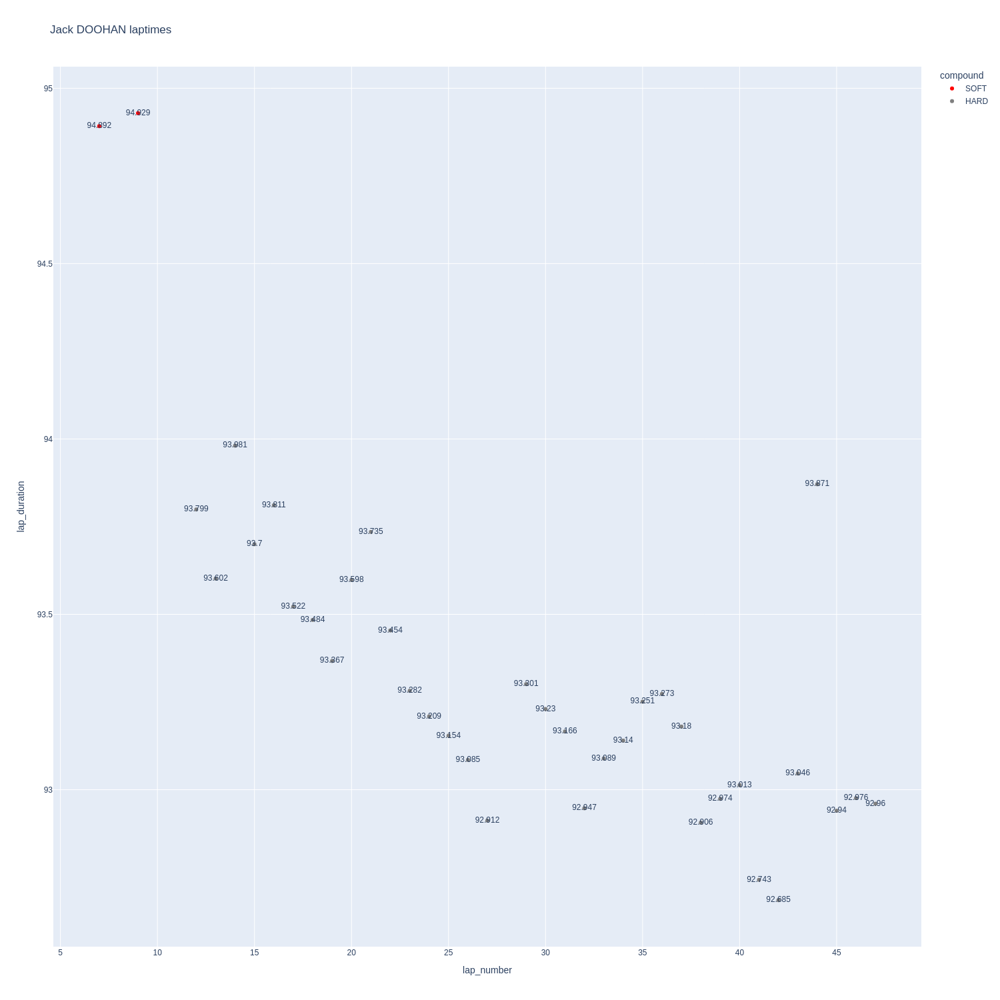

In [150]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

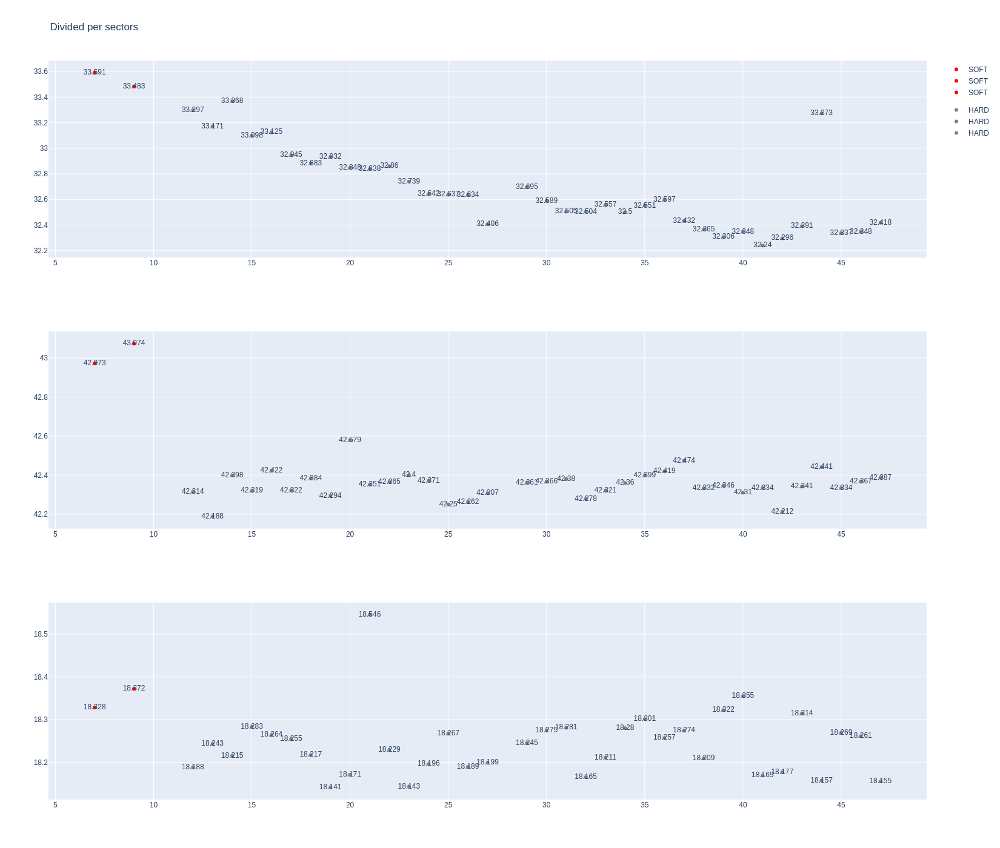

In [151]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [152]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
45,Pierre GASLY,MEDIUM,2025-04-06T05:07:05.884000+00:00,3,34.086,42.689,18.180,94.955
65,Pierre GASLY,MEDIUM,2025-04-06T05:08:40.744000+00:00,4,33.883,42.704,18.121,94.708
85,Pierre GASLY,MEDIUM,2025-04-06T05:10:15.385000+00:00,5,33.593,42.820,18.141,94.554
105,Pierre GASLY,MEDIUM,2025-04-06T05:11:49.948000+00:00,6,33.680,42.952,18.218,94.850
125,Pierre GASLY,MEDIUM,2025-04-06T05:13:24.918000+00:00,7,33.399,42.972,18.214,94.585
145,Pierre GASLY,MEDIUM,2025-04-06T05:14:59.425000+00:00,8,33.556,42.933,18.282,94.771
165,Pierre GASLY,MEDIUM,2025-04-06T05:16:34.301000+00:00,9,33.497,42.868,18.193,94.302
185,Pierre GASLY,MEDIUM,2025-04-06T05:26:01.296000+00:00,10,33.171,42.907,18.211,94.289
204,Pierre GASLY,MEDIUM,2025-04-06T05:27:35.547000+00:00,11,33.411,43.005,18.246,94.662
224,Pierre GASLY,MEDIUM,2025-04-06T05:29:10.228000+00:00,12,33.293,43.073,18.263,94.629


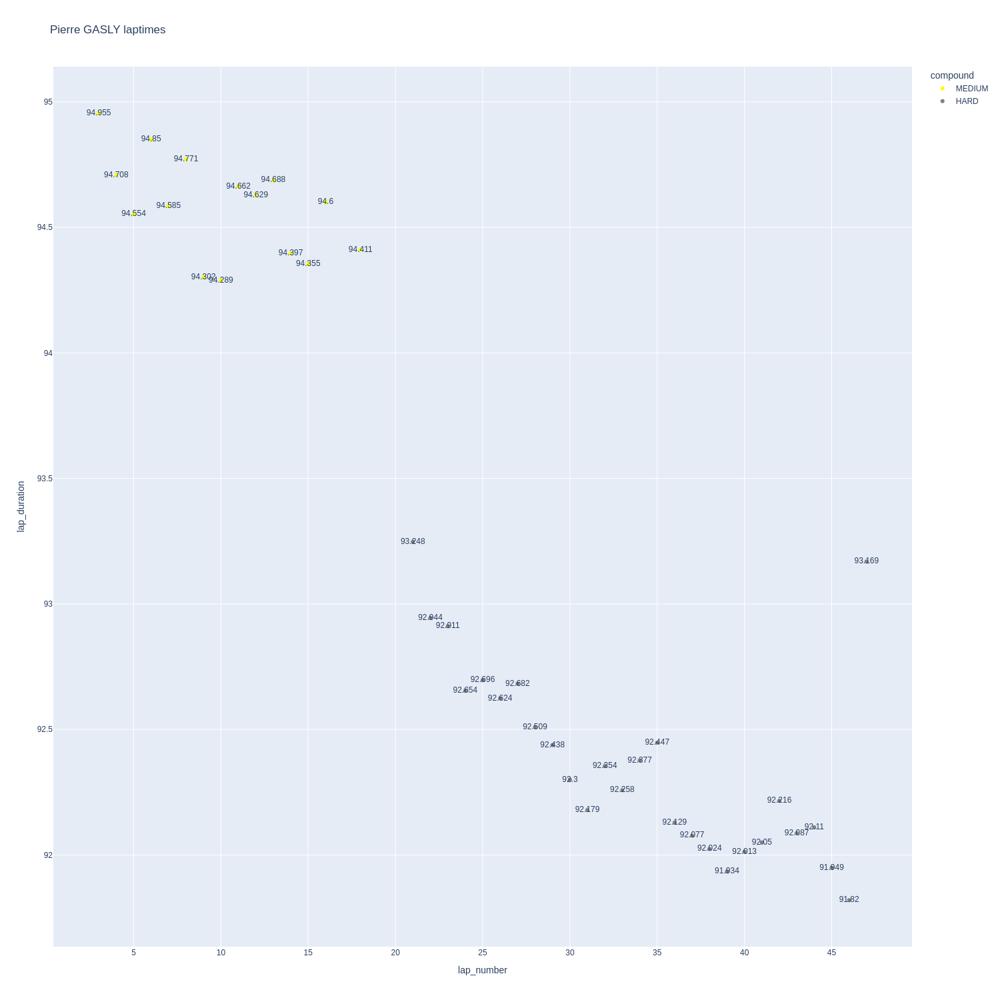

In [153]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

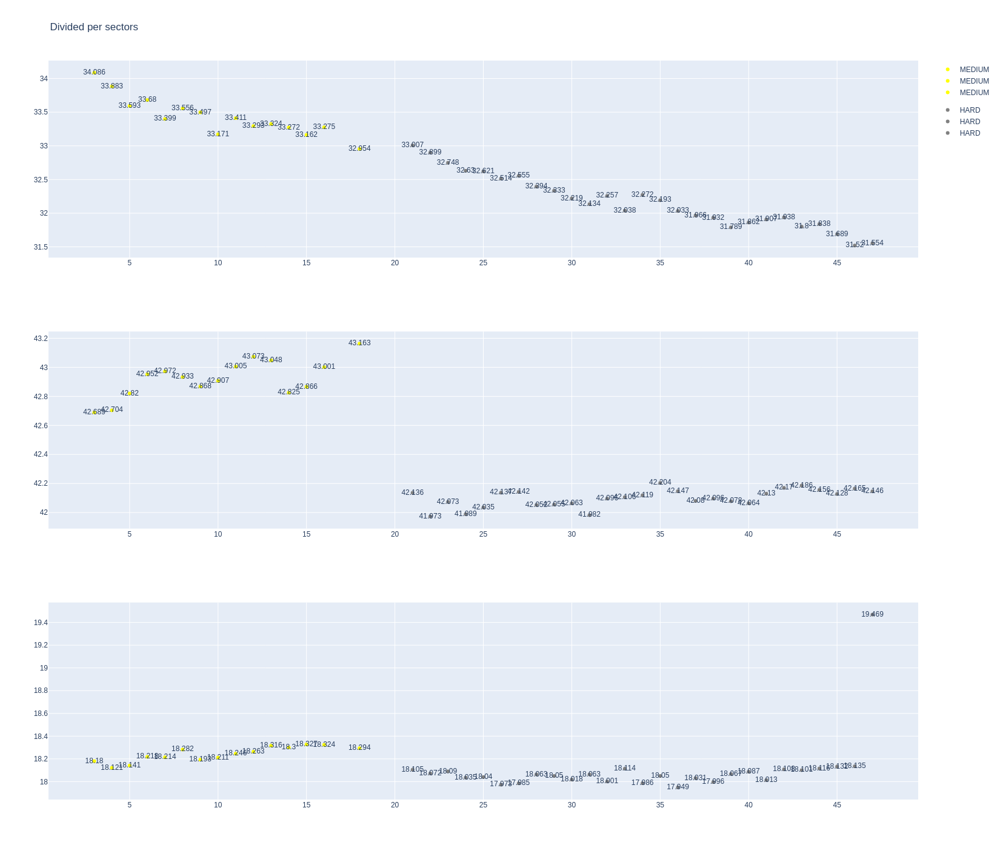

In [154]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [155]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1256,10006,1,23,1,19,MEDIUM,0
19,1256,10006,1,55,1,28,MEDIUM,0
32,1256,10006,2,23,20,48,HARD,0
40,1256,10006,2,55,29,48,SOFT,0


In [156]:
data = libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
51,Alexander ALBON,MEDIUM,2025-04-06T05:07:03.775000+00:00,3,33.756,42.534,18.211,94.501
71,Alexander ALBON,MEDIUM,2025-04-06T05:08:38.182000+00:00,4,33.460,42.581,18.276,94.317
91,Alexander ALBON,MEDIUM,2025-04-06T05:10:12.510000+00:00,5,33.453,42.417,18.268,94.138
111,Alexander ALBON,MEDIUM,2025-04-06T05:11:46.652000+00:00,6,33.548,42.620,18.280,94.448
131,Alexander ALBON,MEDIUM,2025-04-06T05:13:21.105000+00:00,7,33.534,42.652,18.256,94.442
151,Alexander ALBON,MEDIUM,2025-04-06T05:14:55.597000+00:00,8,33.410,42.778,18.302,94.490
171,Alexander ALBON,MEDIUM,2025-04-06T05:16:30.035000+00:00,9,33.351,42.822,18.178,94.155
191,Alexander ALBON,MEDIUM,2025-04-06T05:25:54.718000+00:00,10,33.075,42.553,18.177,93.805
210,Alexander ALBON,MEDIUM,2025-04-06T05:27:28.562000+00:00,11,33.195,42.877,18.287,94.359
230,Alexander ALBON,MEDIUM,2025-04-06T05:29:02.885000+00:00,12,33.107,42.857,18.259,94.223


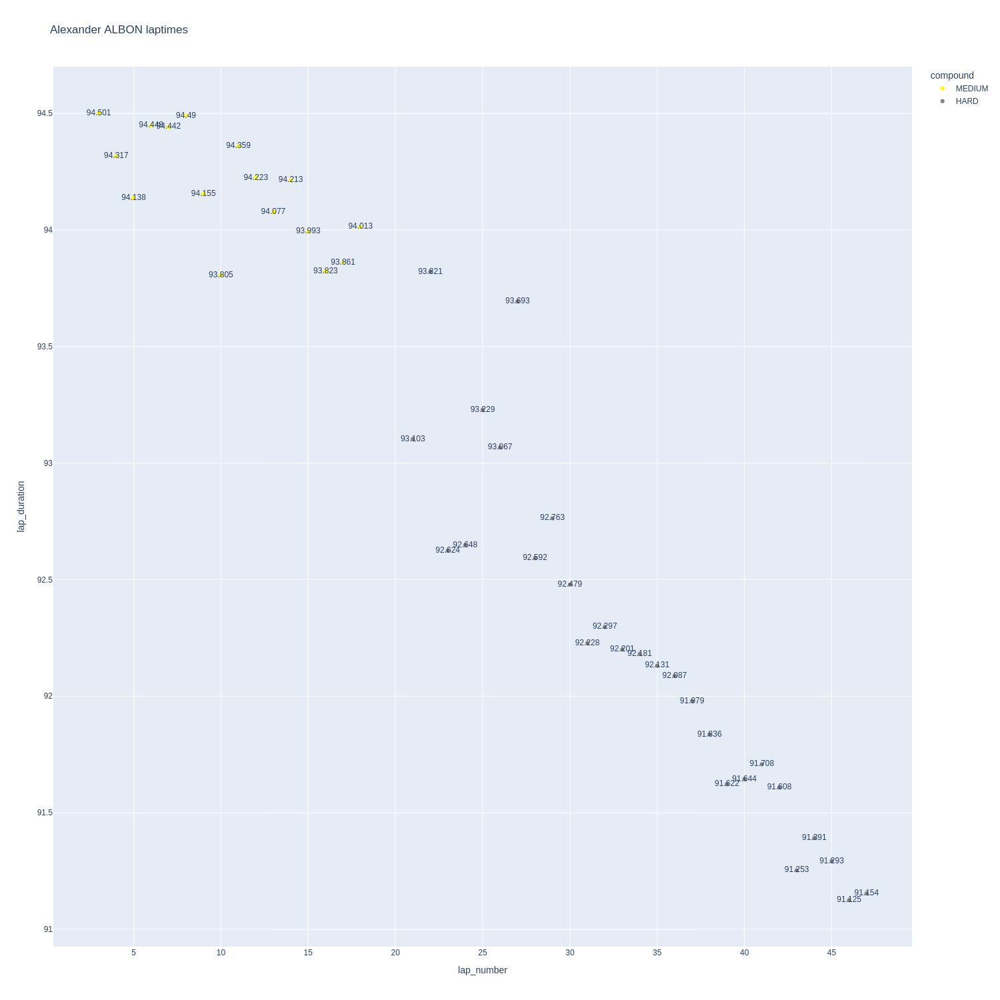

In [157]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

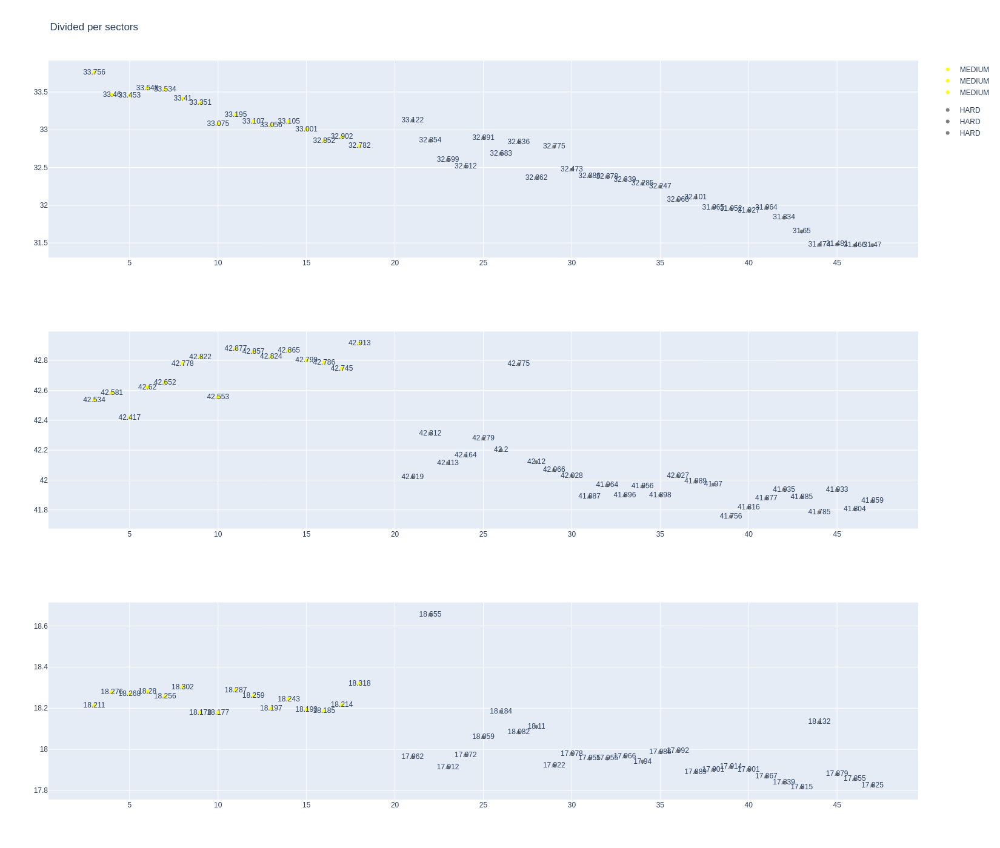

In [158]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [159]:
data= libraryDataF1.getinfolongruns(jointables,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
76,Carlos SAINZ,MEDIUM,2025-04-06T05:08:43.291000+00:00,4,34.015,42.667,18.083,94.765
116,Carlos SAINZ,MEDIUM,2025-04-06T05:11:53.433000+00:00,6,33.856,42.789,18.137,94.782
156,Carlos SAINZ,MEDIUM,2025-04-06T05:15:03.628000+00:00,8,33.758,42.716,18.165,94.639
196,Carlos SAINZ,MEDIUM,2025-04-06T05:26:06.936000+00:00,10,33.404,42.979,18.068,94.451
215,Carlos SAINZ,MEDIUM,2025-04-06T05:27:41.578000+00:00,11,33.676,42.928,18.249,94.853
235,Carlos SAINZ,MEDIUM,2025-04-06T05:29:16.338000+00:00,12,33.195,42.906,18.156,94.257
255,Carlos SAINZ,MEDIUM,2025-04-06T05:30:50.620000+00:00,13,33.380,42.986,18.234,94.600
275,Carlos SAINZ,MEDIUM,2025-04-06T05:32:25.073000+00:00,14,33.292,42.924,18.197,94.413
295,Carlos SAINZ,MEDIUM,2025-04-06T05:33:59.542000+00:00,15,33.488,43.089,18.236,94.813
315,Carlos SAINZ,MEDIUM,2025-04-06T05:35:34.287000+00:00,16,33.173,43.067,18.231,94.471


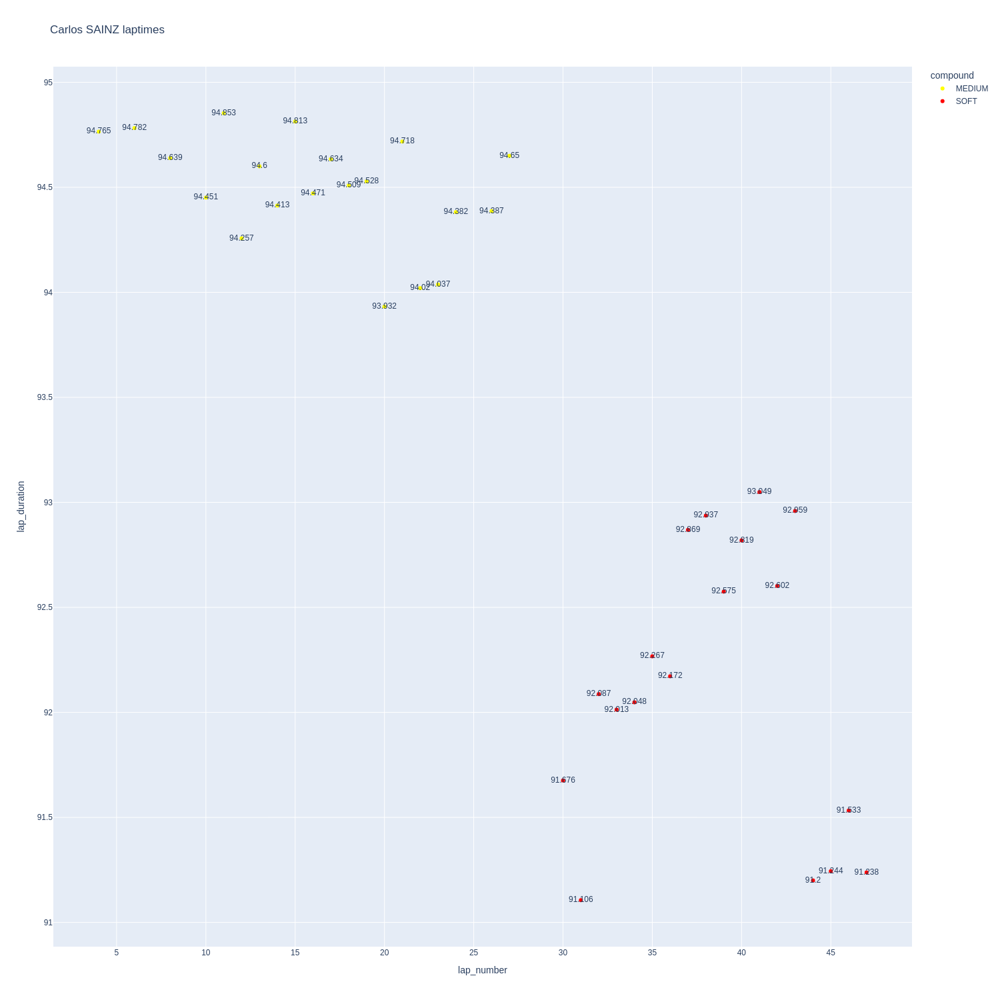

In [160]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

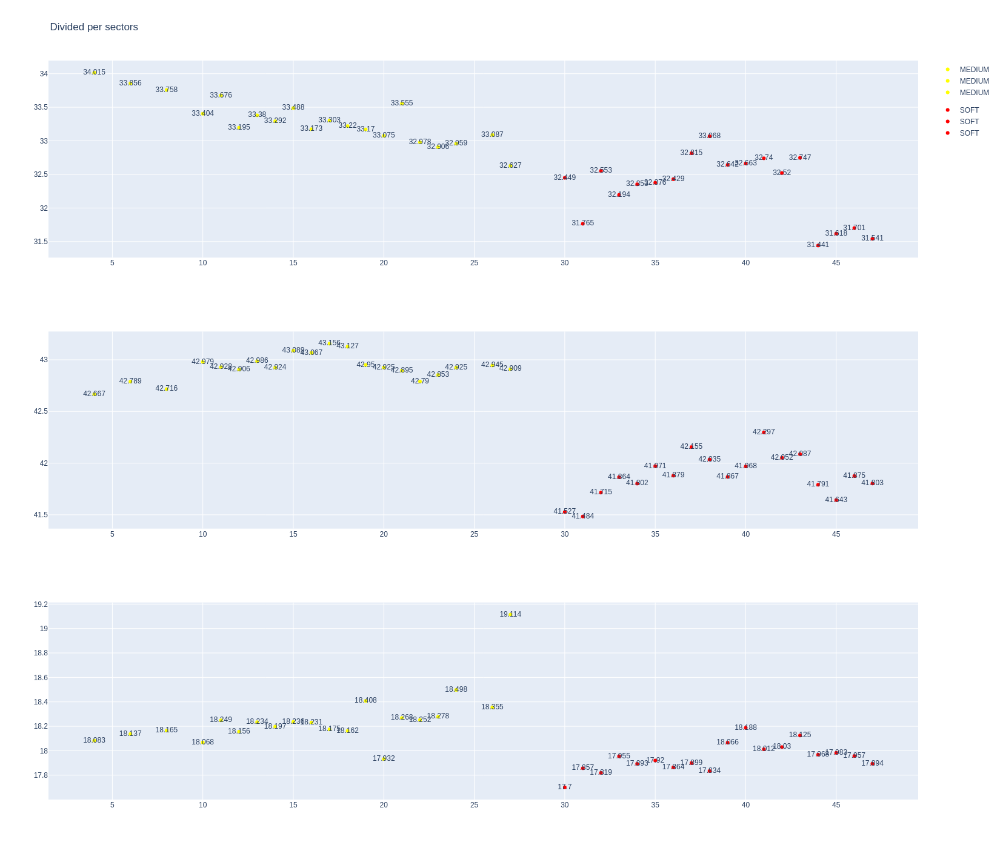

In [161]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [162]:
stintInformation.query('driver_number == 5 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1256,10006,1,27,1,17,MEDIUM,0
15,1256,10006,1,5,1,26,HARD,0
27,1256,10006,2,27,18,48,HARD,0
35,1256,10006,2,5,27,47,MEDIUM,0


In [163]:
data = libraryDataF1.getinfolongruns(jointables,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
62,Gabriel BORTOLETO,HARD,2025-04-06T05:08:47.103000+00:00,4,33.997,42.724,18.247,94.968
162,Gabriel BORTOLETO,HARD,2025-04-06T05:16:43.098000+00:00,9,33.806,42.905,18.260,94.971
182,Gabriel BORTOLETO,HARD,2025-04-06T05:26:12.171000+00:00,10,33.717,42.842,18.299,94.858
202,Gabriel BORTOLETO,HARD,2025-04-06T05:27:47.065000+00:00,11,33.459,42.919,18.221,94.599
221,Gabriel BORTOLETO,HARD,2025-04-06T05:29:21.744000+00:00,12,33.386,42.947,18.309,94.642
241,Gabriel BORTOLETO,HARD,2025-04-06T05:30:56.307000+00:00,13,33.559,42.872,18.293,94.724
261,Gabriel BORTOLETO,HARD,2025-04-06T05:32:30.986000+00:00,14,33.343,42.711,18.150,94.204
281,Gabriel BORTOLETO,HARD,2025-04-06T05:34:05.292000+00:00,15,33.247,43.004,18.288,94.539
301,Gabriel BORTOLETO,HARD,2025-04-06T05:35:39.866000+00:00,16,33.291,42.787,18.294,94.372
320,Gabriel BORTOLETO,HARD,2025-04-06T05:37:14.129000+00:00,17,33.327,42.879,18.286,94.492


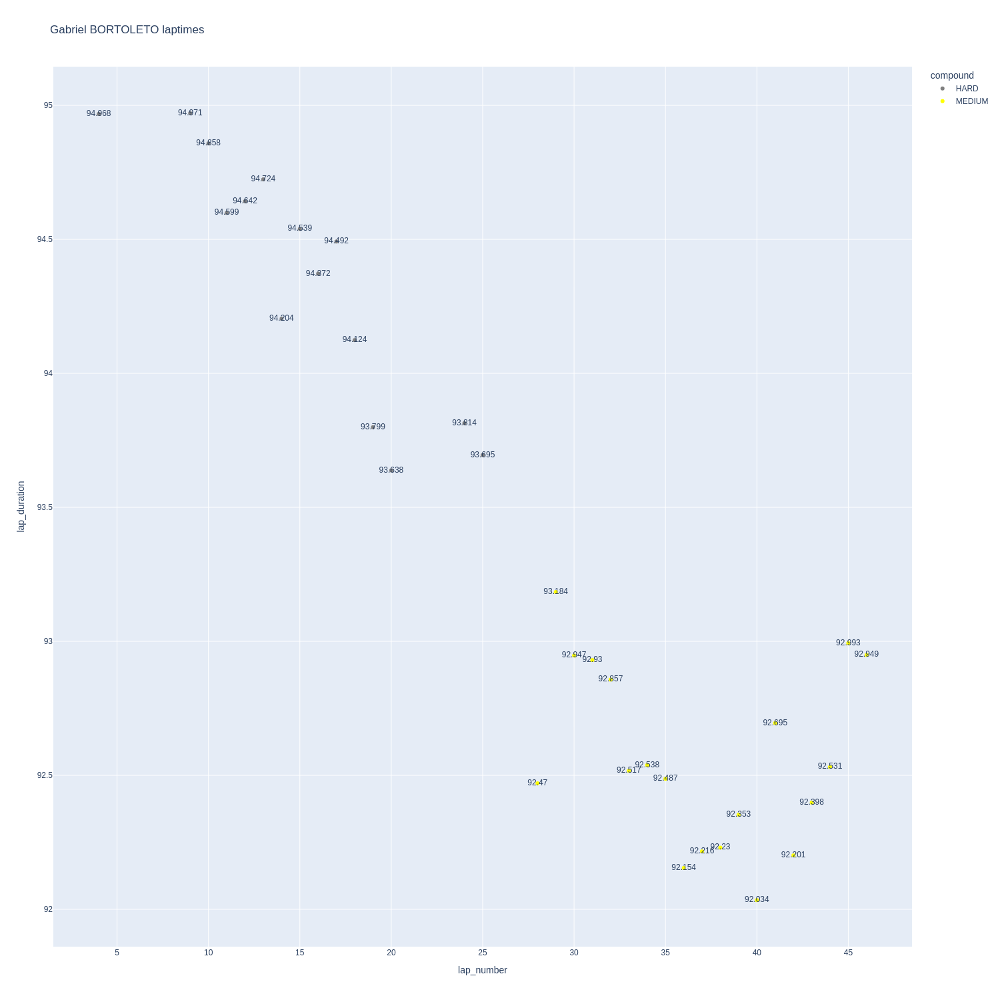

In [164]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

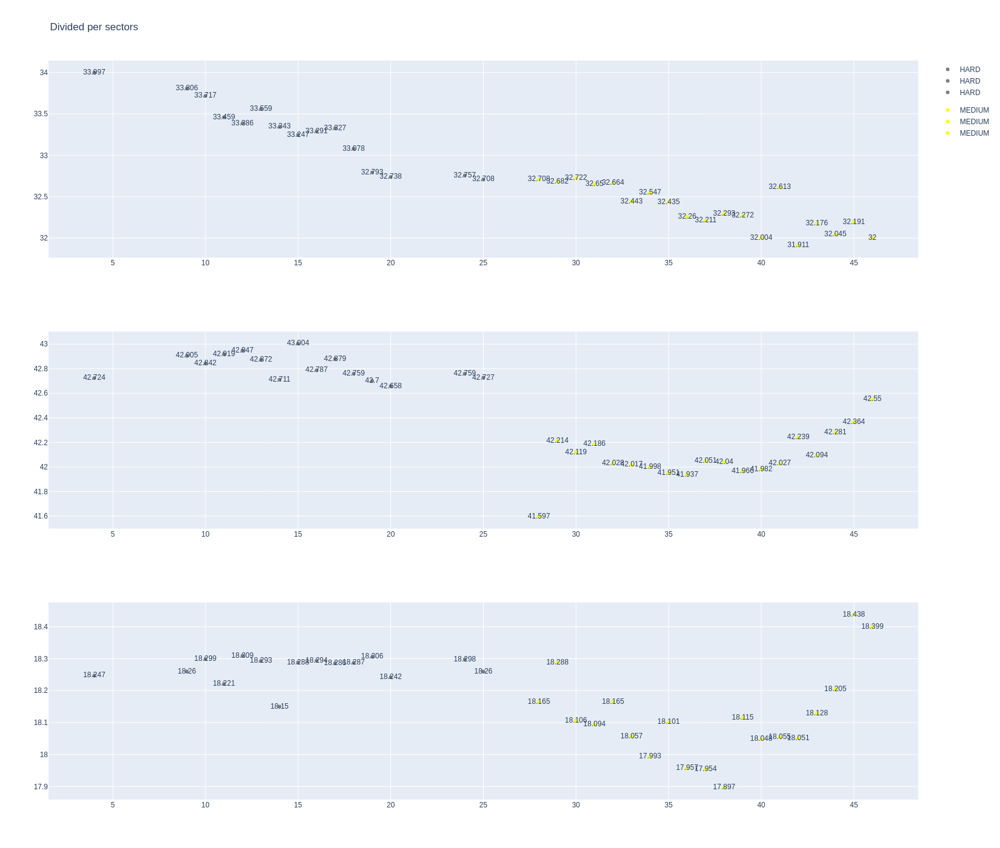

In [165]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [166]:
data = libraryDataF1.getinfolongruns(jointables,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
152,Nico HULKENBERG,MEDIUM,2025-04-06T05:15:04.816000+00:00,8,33.570,42.995,18.195,94.760
172,Nico HULKENBERG,MEDIUM,2025-04-06T05:16:39.598000+00:00,9,33.423,43.069,18.297,94.789
192,Nico HULKENBERG,MEDIUM,2025-04-06T05:26:08.327000+00:00,10,33.429,43.085,18.215,94.729
211,Nico HULKENBERG,MEDIUM,2025-04-06T05:27:42.906000+00:00,11,33.455,43.094,18.446,94.995
231,Nico HULKENBERG,MEDIUM,2025-04-06T05:29:17.994000+00:00,12,33.059,43.120,18.313,94.492
251,Nico HULKENBERG,MEDIUM,2025-04-06T05:30:52.479000+00:00,13,33.254,42.971,18.326,94.551
271,Nico HULKENBERG,MEDIUM,2025-04-06T05:32:26.979000+00:00,14,33.101,42.857,18.354,94.312
291,Nico HULKENBERG,MEDIUM,2025-04-06T05:34:01.307000+00:00,15,33.053,43.002,18.259,94.314
311,Nico HULKENBERG,MEDIUM,2025-04-06T05:35:35.647000+00:00,16,33.154,43.025,18.259,94.438
364,Nico HULKENBERG,HARD,2025-04-06T05:40:41.365000+00:00,19,33.021,41.664,18.131,92.816


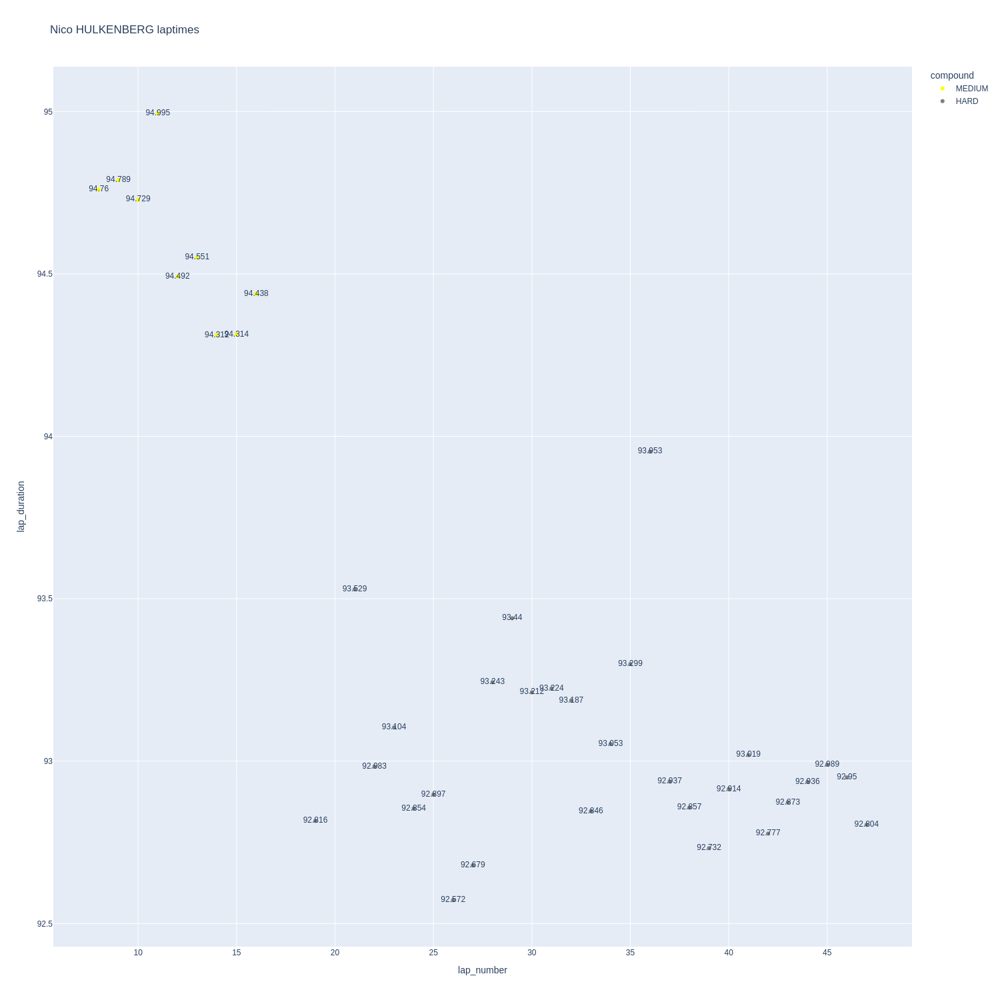

In [167]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

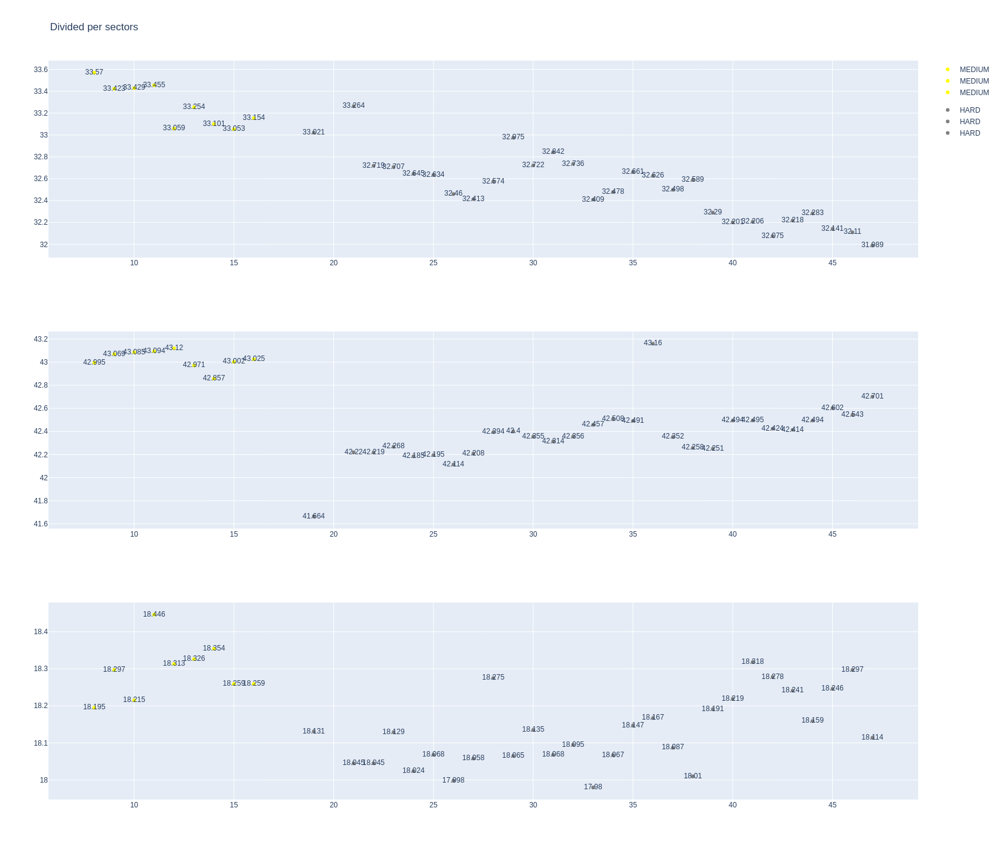

In [168]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

### Pits
Before to finish the analysis, I added the Pits sections where it can see how much time teams spent in the box.

In [169]:
pit = libraryDataF1.obtain_information('pit',session_key=9496)

In [170]:
jointables = pd.merge(drivers,pit,on=['driver_number']).query("pit_duration<120")
jointables
pit_duration = pd.DataFrame(jointables.groupby('team_name')['pit_duration'].mean().sort_values(ascending=True))
pit_duration

,pit_duration
team_name,
Aston Martin,23.080000
McLaren,23.100000
Mercedes,23.200000
Red Bull Racing,23.250000
Williams,23.300000
Alpine,23.450000
Ferrari,23.466667
Haas F1 Team,23.700000
Kick Sauber,23.750000
